`# 
Abstract:

This is a set of data created from imaginary data of water quality in an urban environment. 

Description
All attributes are numeric variables and they are listed bellow:

aluminium - dangerous if greater than 2.8

ammonia - dangerous if greater than 32.5

arsenic - dangerous if greater than 0.01

barium - dangerous if greater than 2

cadmium - dangerous if greater than 0.005

chloramine - dangerous if greater than 4

chromium - dangerous if greater than 0.1

copper - dangerous if greater than 1.3

flouride - dangerous if greater than 1.5

bacteria - dangerous if greater than 0

viruses - dangerous if greater than 0

lead - dangerous if greater than 0.015

nitrates - dangerous if greater than 10

nitrites - dangerous if greater than 1

mercury - dangerous if greater than 0.002

perchlorate - dangerous if greater than 56

radium - dangerous if greater than 5

selenium - dangerous if greater than 0.5

silver - dangerous if greater than 0.1

uranium - dangerous if greater than 0.3

is_safe - class attribute {0 - not safe, 1 - safe}

In [1]:
#installing dependencies
!pip install shap

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 572.4/572.4 KB 8.6 MB/s eta 0:00:00


In [2]:
#imports

import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pylab as plt
from matplotlib import pyplot
from sklearn.model_selection import train_test_split
from sklearn.svm import SVC
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
from sklearn.ensemble import RandomForestClassifier
import shap
import warnings
warnings.filterwarnings('ignore')

In [3]:
df= pd.read_csv('https://raw.githubusercontent.com/ParvatiSohani/DSEM_1/main/waterQuality1.csv')
df

,ammonia,arsenic,barium,cadmium,chloramine,chromium,copper,flouride,bacteria,viruses,...,nitrates,nitrites,mercury,perchlorate,radium,selenium,silver,uranium,aluminiumdanger,is_safe
0,9.08,0.04,2.85,0.007,0.35,0.83,0.17,0.05,0.20,0.000,...,16.08,1.13,0.007,37.75,6.78,0.08,0.34,0.02,0,1
1,21.16,0.01,3.31,0.002,5.28,0.68,0.66,0.90,0.65,0.650,...,2.01,1.93,0.003,32.26,3.21,0.08,0.27,0.05,0,1
2,14.02,0.04,0.58,0.008,4.24,0.53,0.02,0.99,0.05,0.003,...,14.16,1.11,0.006,50.28,7.07,0.07,0.44,0.01,0,0
3,11.33,0.04,2.96,0.001,7.23,0.03,1.66,1.08,0.71,0.710,...,1.41,1.29,0.004,9.12,1.72,0.02,0.45,0.05,0,1
4,24.33,0.03,0.20,0.006,2.67,0.69,0.57,0.61,0.13,0.001,...,6.74,1.11,0.003,16.90,2.41,0.02,0.06,0.02,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7994,7.78,0.00,1.95,0.040,0.10,0.03,0.03,1.37,0.00,0.000,...,14.29,1.00,0.005,3.57,2.13,0.09,0.06,0.03,0,1
7995,24.22,0.02,0.59,0.010,0.45,0.02,0.02,1.48,0.00,0.000,...,10.27,1.00,0.001,1.48,1.11,0.09,0.10,0.08,0,1
7996,6.85,0.00,0.61,0.030,0.05,0.05,0.02,0.91,0.00,0.000,...,15.92,1.00,0.000,1.35,4.84,0.00,0.04,0.05,0,1
7997,10.00,0.01,2.00,0.000,2.00,0.00,0.09,0.00,0.00,0.000,...,0.00,0.00,0.000,0.00,0.00,0.00,0.00,0.00,0,1


In [4]:
df.head()

,ammonia,arsenic,barium,cadmium,chloramine,chromium,copper,flouride,bacteria,viruses,...,nitrates,nitrites,mercury,perchlorate,radium,selenium,silver,uranium,aluminiumdanger,is_safe
0,9.08,0.04,2.85,0.007,0.35,0.83,0.17,0.05,0.20,0.000,...,16.08,1.13,0.007,37.75,6.78,0.08,0.34,0.02,0,1
1,21.16,0.01,3.31,0.002,5.28,0.68,0.66,0.90,0.65,0.650,...,2.01,1.93,0.003,32.26,3.21,0.08,0.27,0.05,0,1
2,14.02,0.04,0.58,0.008,4.24,0.53,0.02,0.99,0.05,0.003,...,14.16,1.11,0.006,50.28,7.07,0.07,0.44,0.01,0,0
3,11.33,0.04,2.96,0.001,7.23,0.03,1.66,1.08,0.71,0.710,...,1.41,1.29,0.004,9.12,1.72,0.02,0.45,0.05,0,1
4,24.33,0.03,0.20,0.006,2.67,0.69,0.57,0.61,0.13,0.001,...,6.74,1.11,0.003,16.90,2.41,0.02,0.06,0.02,0,1


In [5]:
numco = df._get_numeric_data().columns
print(numco)

catco = df.select_dtypes(include=['object']).columns.tolist()
print(catco)

Index(['ammonia', 'arsenic', 'barium', 'cadmium', 'chloramine', 'chromium',
       'copper', 'flouride', 'bacteria', 'viruses', 'lead', 'nitrates',
       'nitrites', 'mercury', 'perchlorate', 'radium', 'selenium', 'silver',
       'uranium', 'aluminiumdanger', 'is_safe'],
      dtype='object')
[]


### **Q1: What are the data types?**

(Only numerical values)
Answer: All the columns are numerical values, along with the dependent variable.

Numerical Columns = ['ammonia', 'arsenic', 'barium', 'cadmium', 'chloramine', 'chromium','copper', 'flouride', 'bacteria', 'viruses', 'lead', 'nitrates','nitrites', 'mercury', 'perchlorate', 'radium', 'selenium', 'silver',
'uranium', 'aluminiumdanger', 'is_safe']

In [6]:
numeric_data = df.select_dtypes(include=[np.number])

In [7]:
numeric_data.shape[1]

21

In [8]:
numeric_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7999 entries, 0 to 7998
Data columns (total 21 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   ammonia          7999 non-null   float64
 1   arsenic          7999 non-null   float64
 2   barium           7999 non-null   float64
 3   cadmium          7999 non-null   float64
 4   chloramine       7999 non-null   float64
 5   chromium         7999 non-null   float64
 6   copper           7999 non-null   float64
 7   flouride         7999 non-null   float64
 8   bacteria         7999 non-null   float64
 9   viruses          7999 non-null   float64
 10  lead             7999 non-null   float64
 11  nitrates         7999 non-null   float64
 12  nitrites         7999 non-null   float64
 13  mercury          7999 non-null   float64
 14  perchlorate      7999 non-null   float64
 15  radium           7999 non-null   float64
 16  selenium         7999 non-null   float64
 17  silver        

### **Q2: Are there missing values?**

In [9]:
#checking if the any data is missing
df.isnull().sum()

ammonia            0
arsenic            0
barium             0
cadmium            0
chloramine         0
chromium           0
copper             0
flouride           0
bacteria           0
viruses            0
lead               0
nitrates           0
nitrites           0
mercury            0
perchlorate        0
radium             0
selenium           0
silver             0
uranium            0
aluminiumdanger    0
is_safe            0
dtype: int64


### **Answer:** 
Using the isnull().sum() we can see that there are no missing values in the dataset as the values are 0.

### **Q3: What are the likely distributions of the numeric variables?**

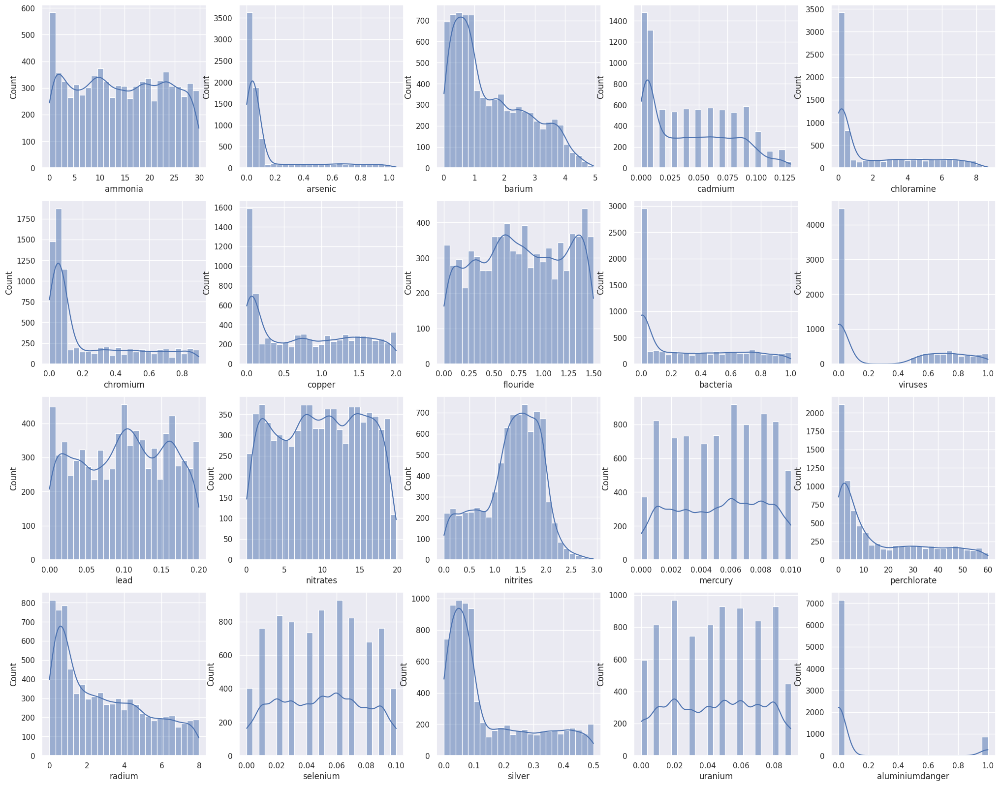

In [10]:
cols = df.columns

sns.set(rc={"figure.figsize": (25, 25)})

for i in range(len(cols)-1):
  plt.subplot(5,5,i+1)
  ax = sns.histplot(x = df[cols[i]],kde=True,bins=25)

    

  

### **Answer** : 
above is the distribution of numerical data using Histogram Plot which is random distribution.

Below is the distribution using QQ Plot:

 If the data is normally distributed, the points on the plot will fall on a straight line. If the data is not normally distributed, the points on the plot will deviate from the straight line, indicating that the data does not follow a normal distribution.

<Figure size 800x500 with 0 Axes>

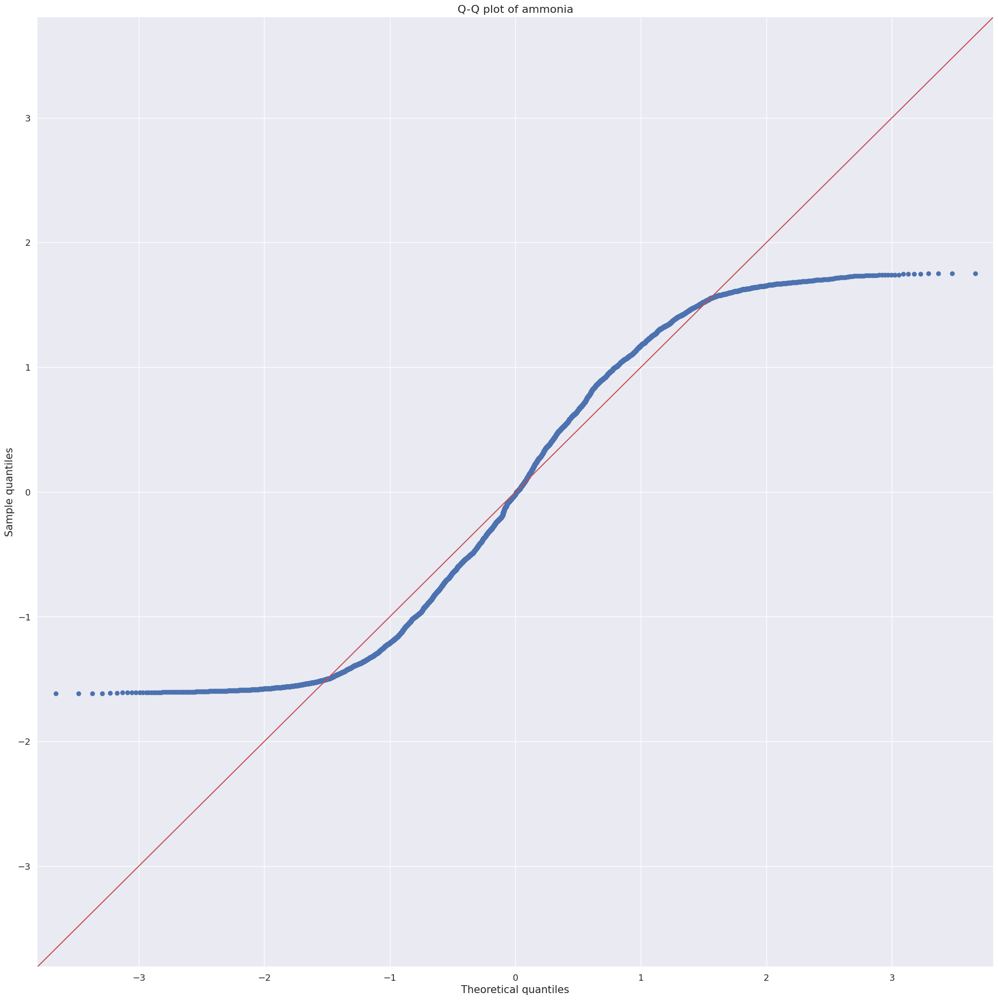

<Figure size 800x500 with 0 Axes>

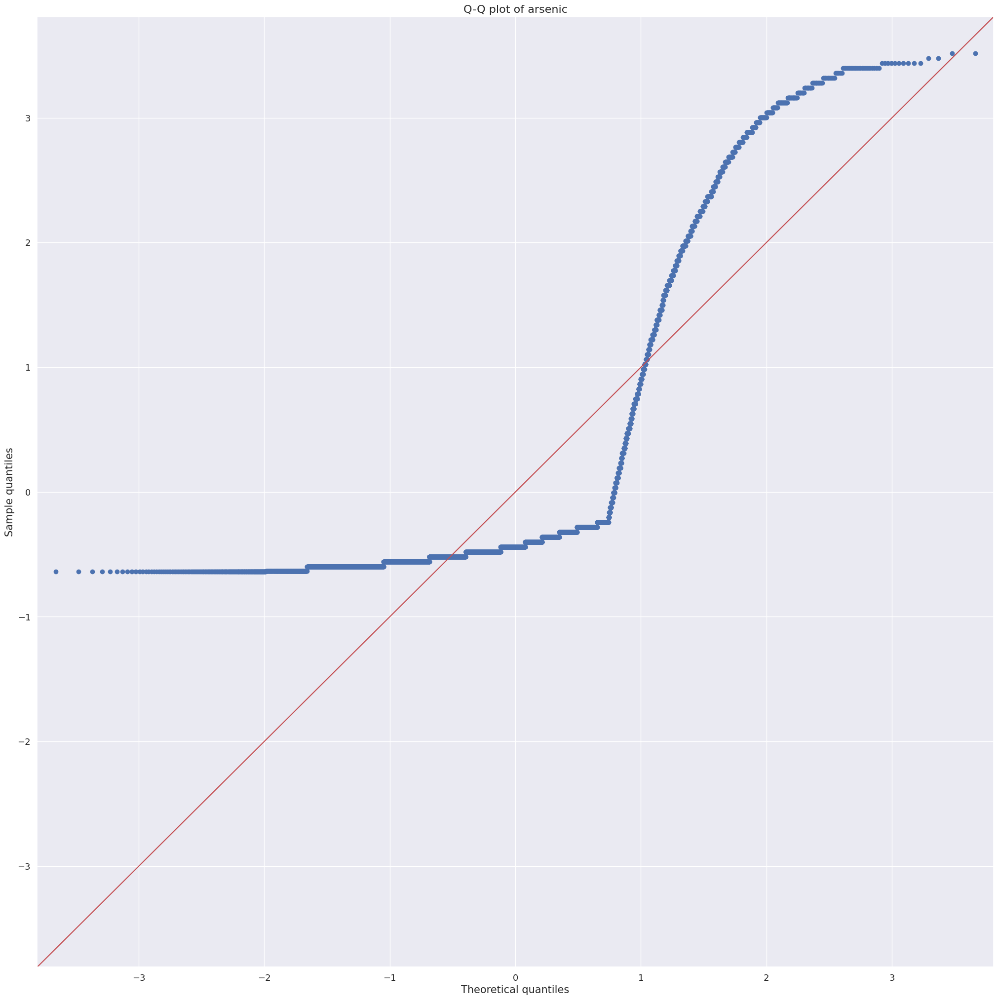

<Figure size 800x500 with 0 Axes>

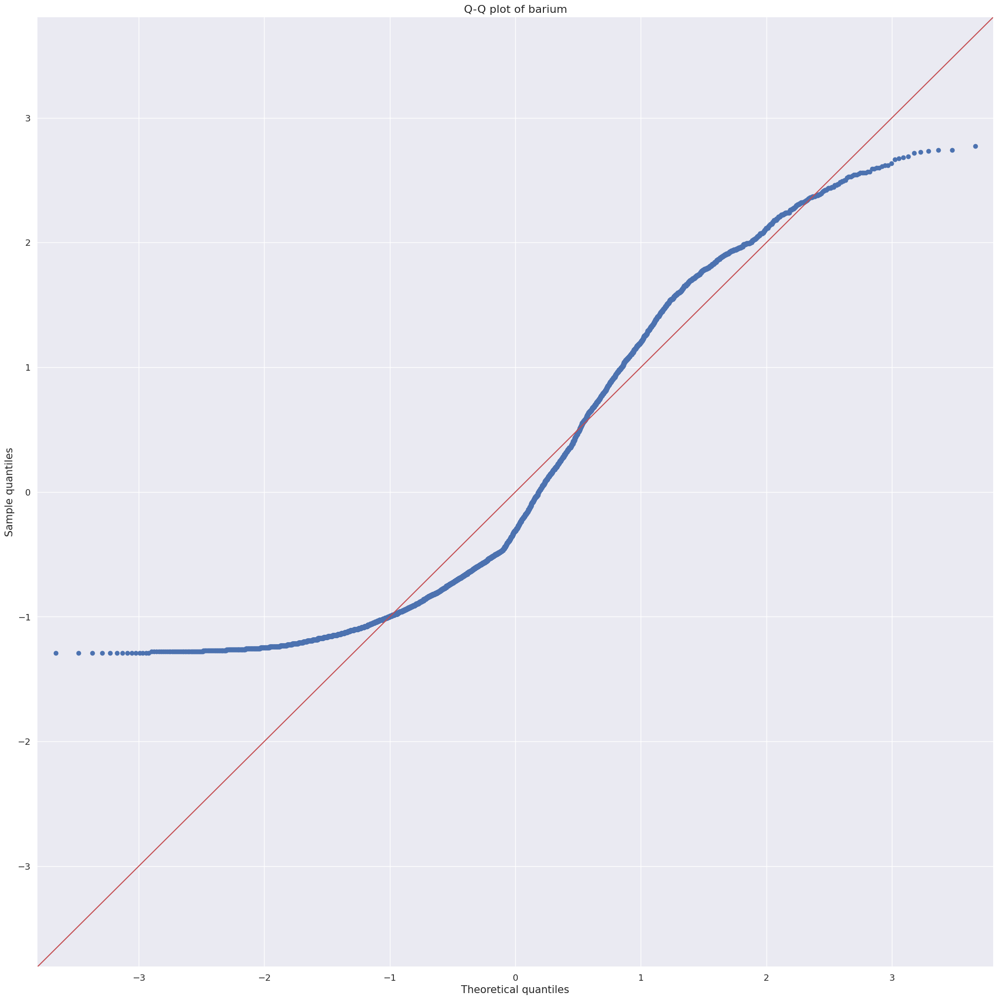

<Figure size 800x500 with 0 Axes>

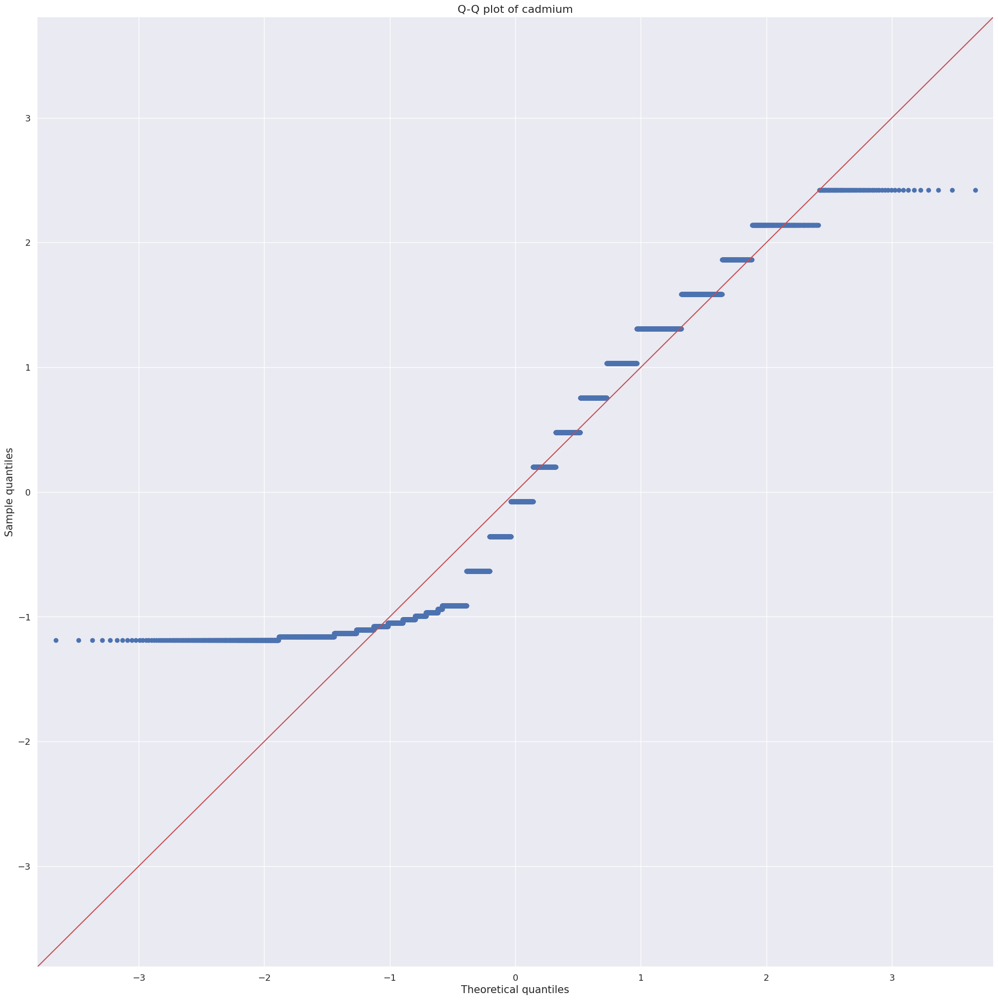

<Figure size 800x500 with 0 Axes>

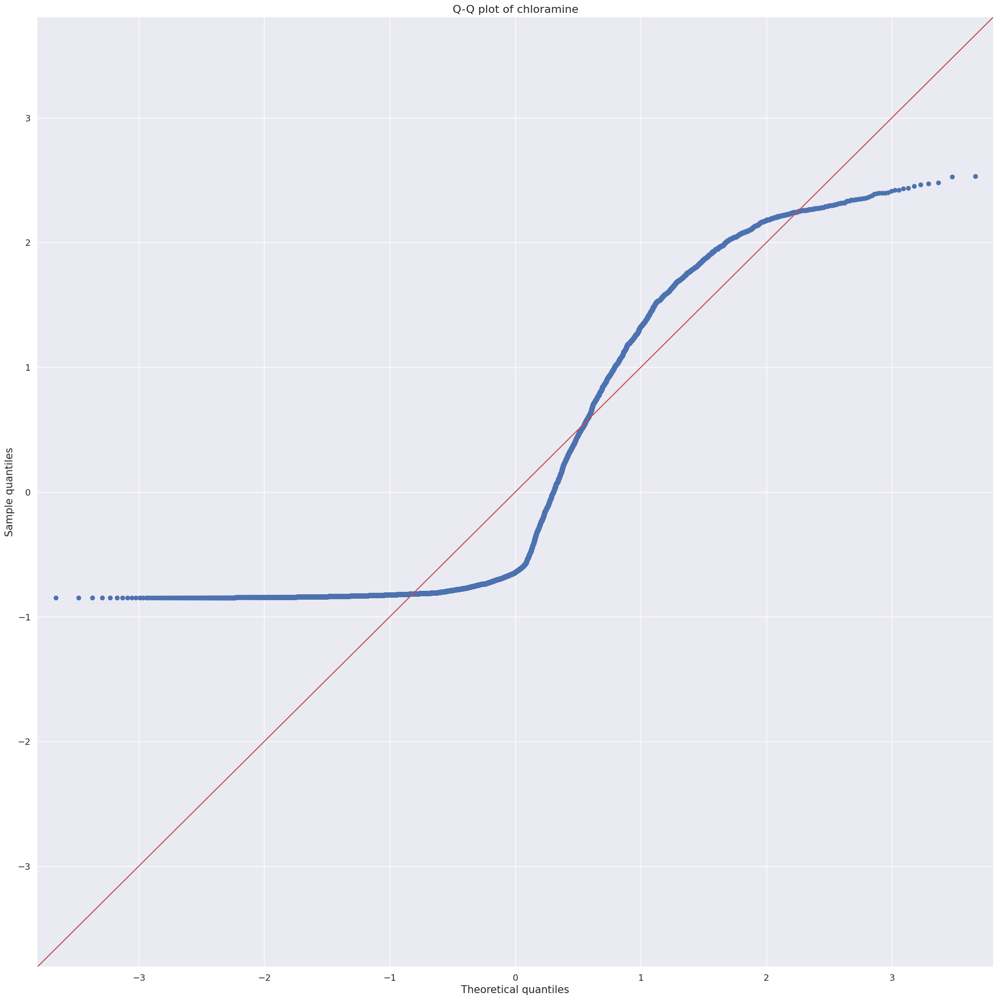

<Figure size 800x500 with 0 Axes>

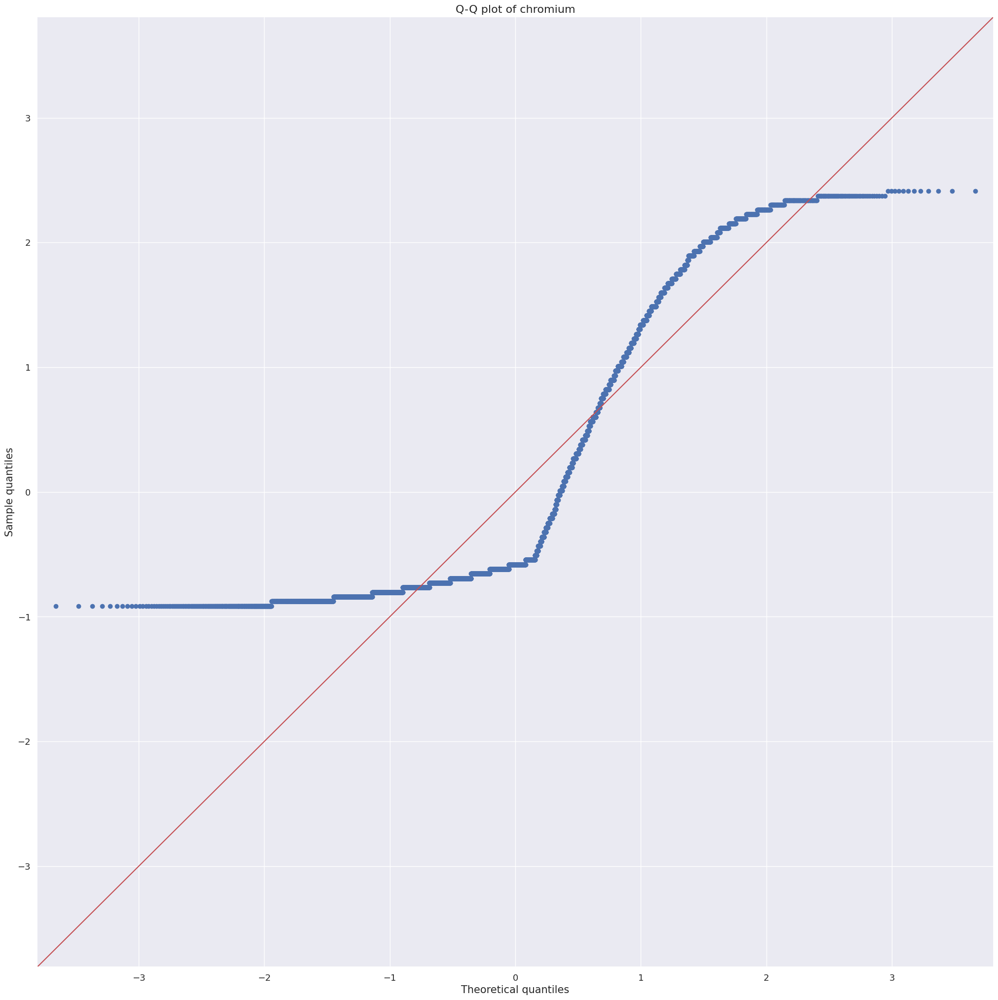

<Figure size 800x500 with 0 Axes>

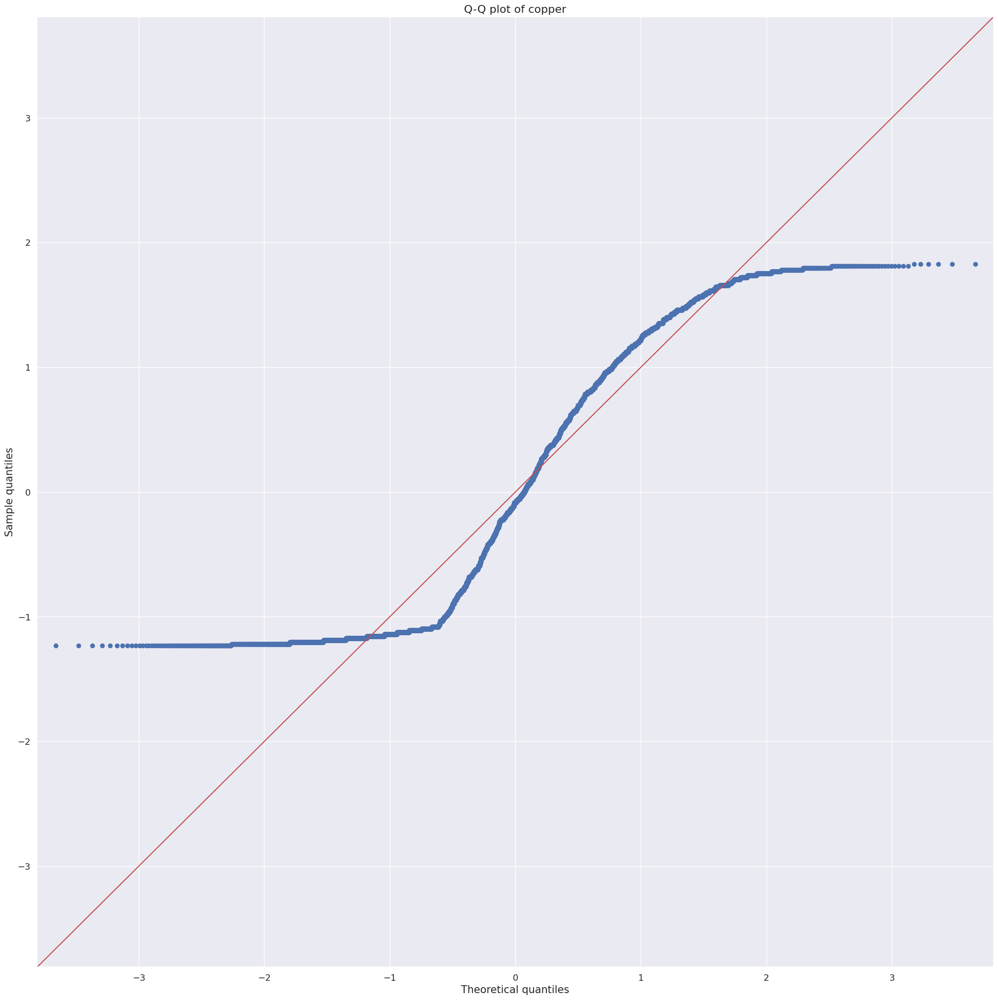

<Figure size 800x500 with 0 Axes>

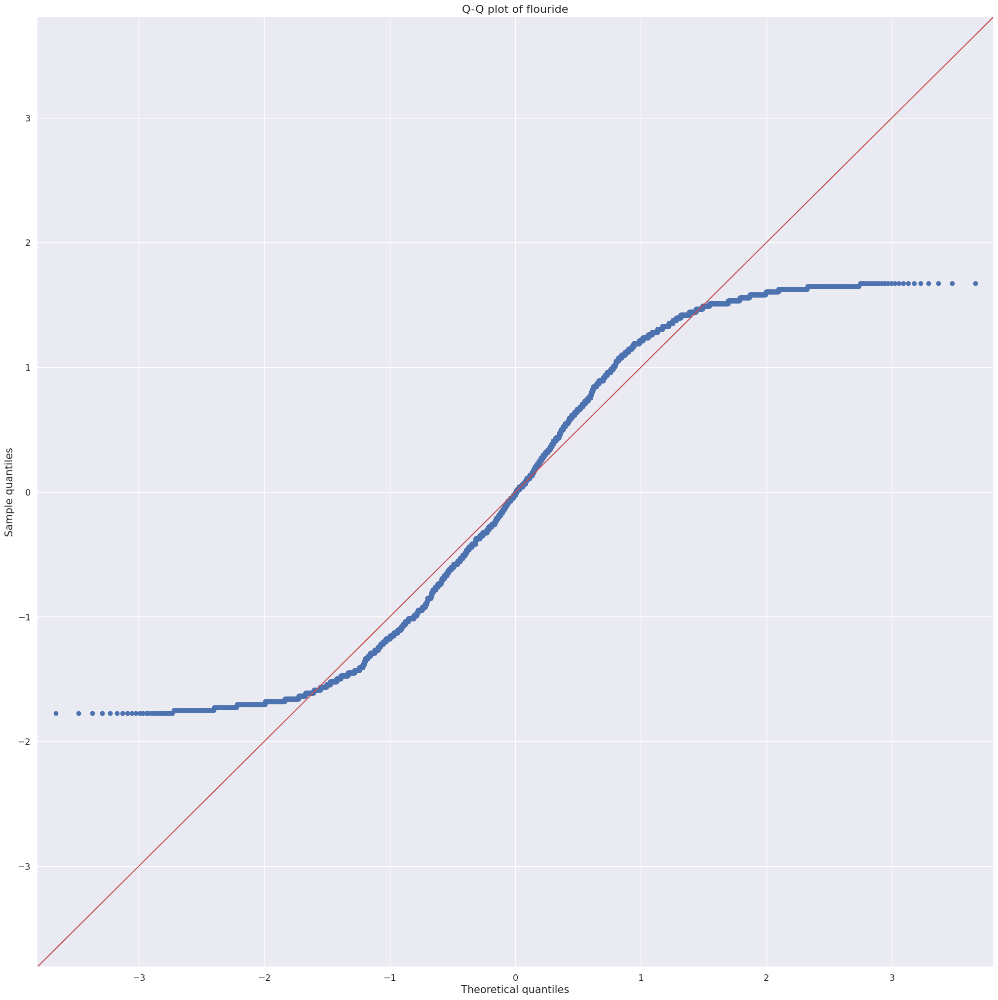

<Figure size 800x500 with 0 Axes>

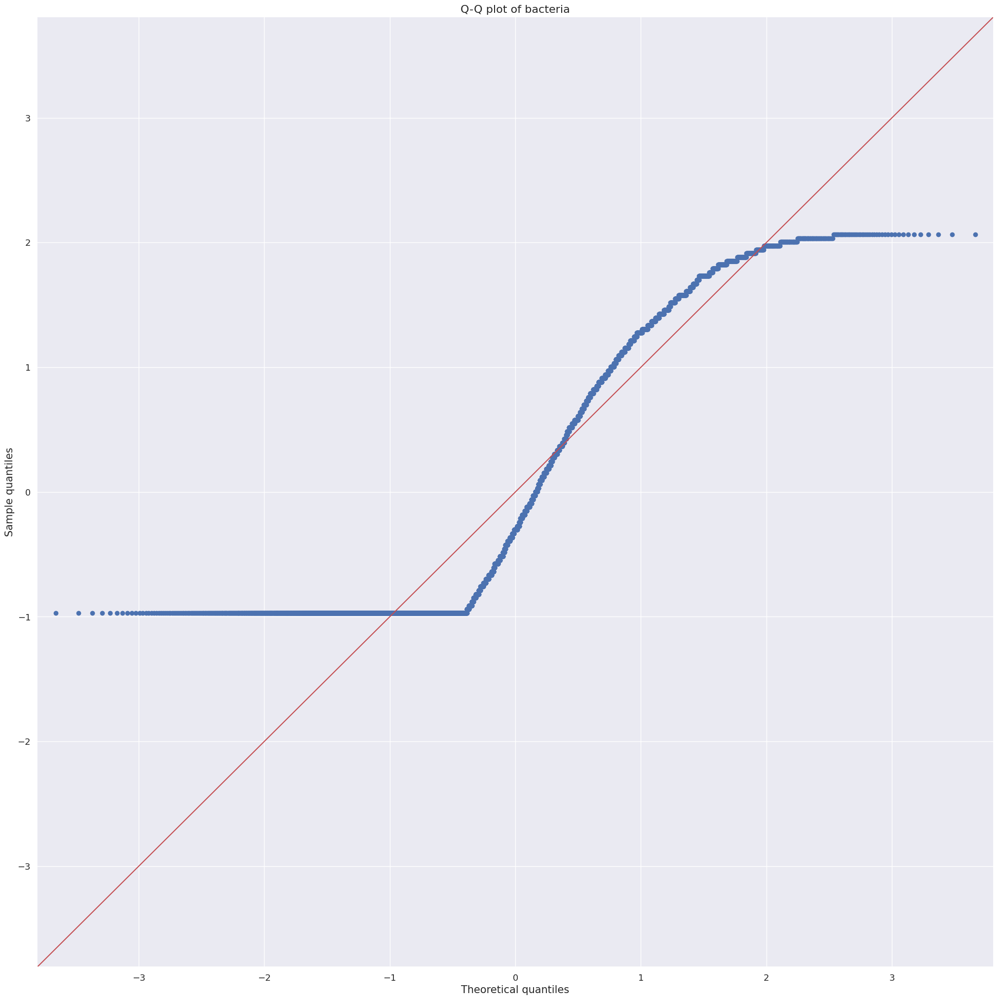

<Figure size 800x500 with 0 Axes>

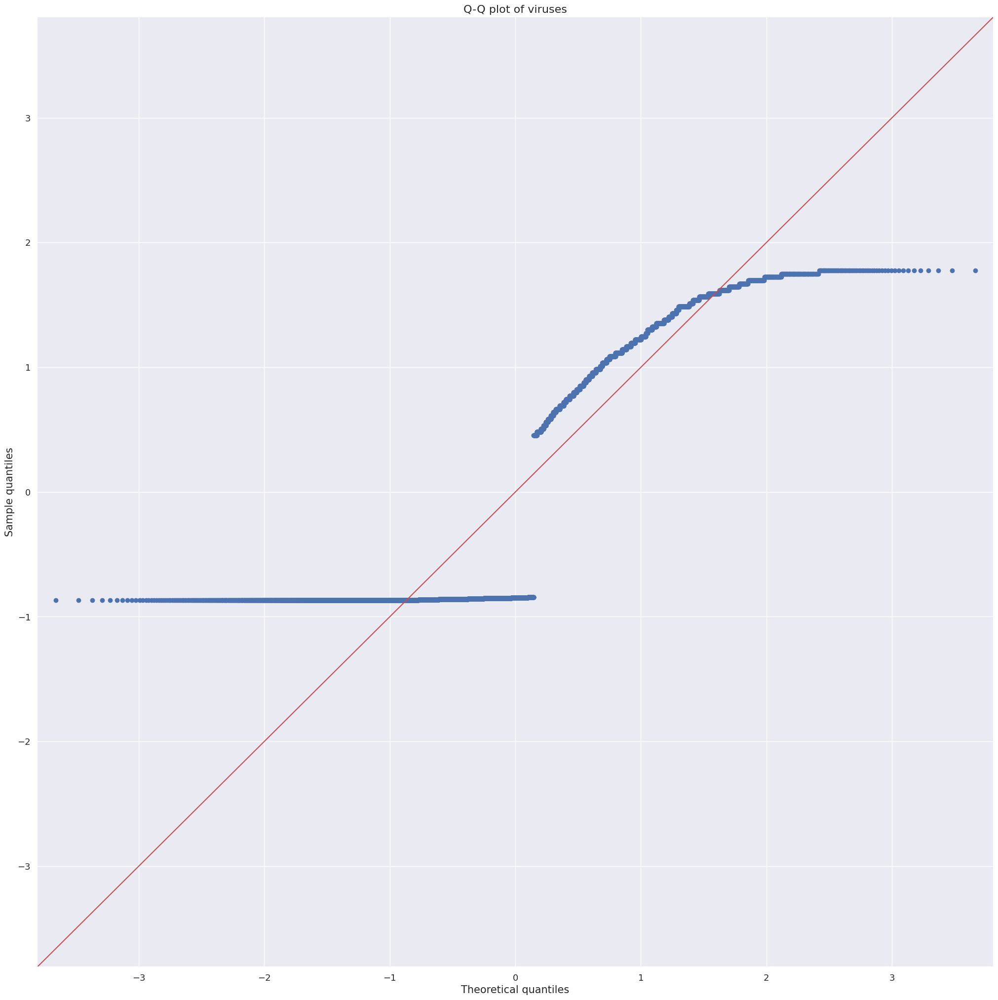

<Figure size 800x500 with 0 Axes>

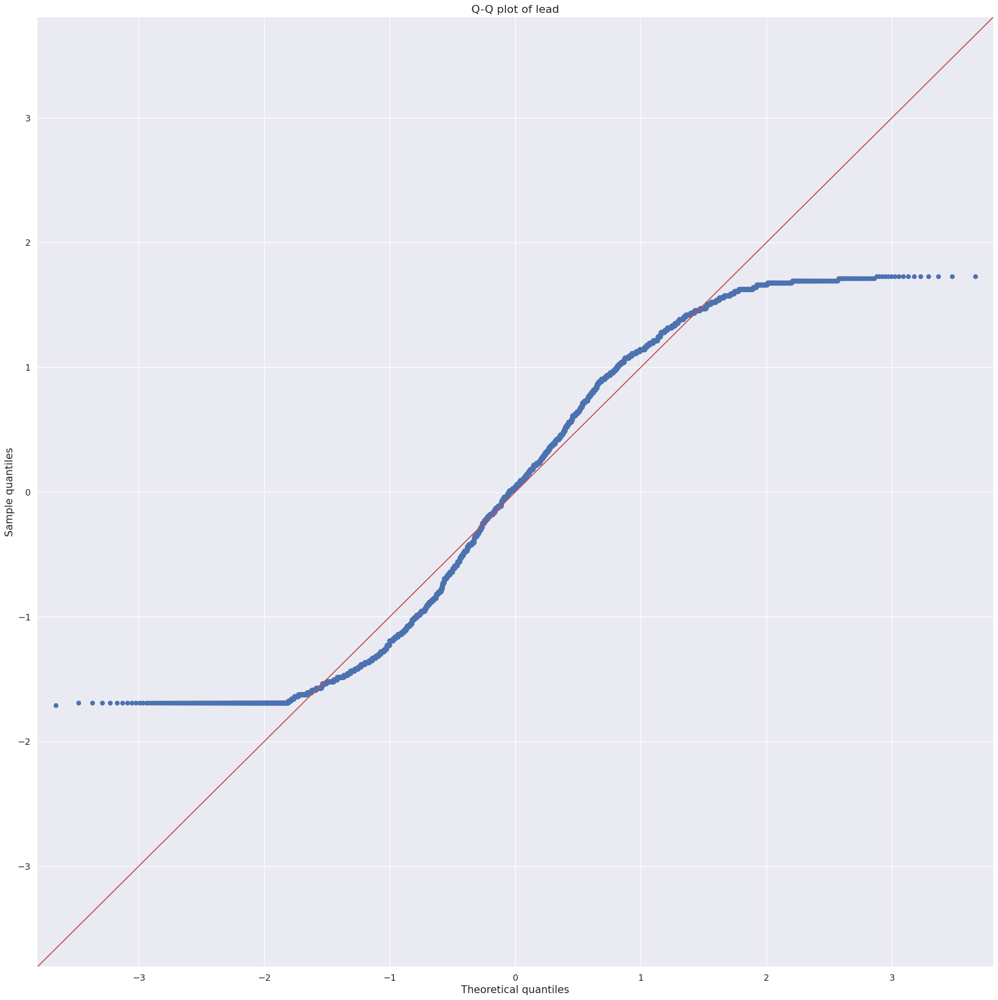

<Figure size 800x500 with 0 Axes>

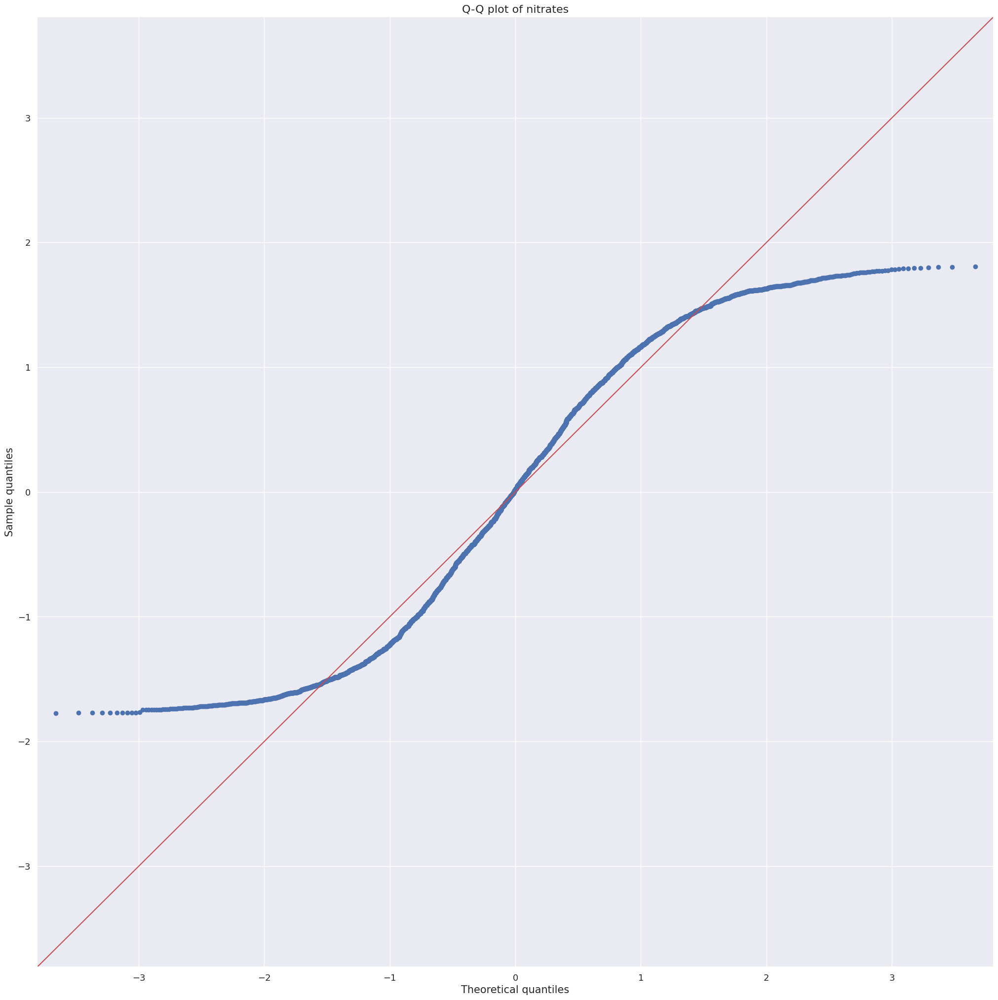

<Figure size 800x500 with 0 Axes>

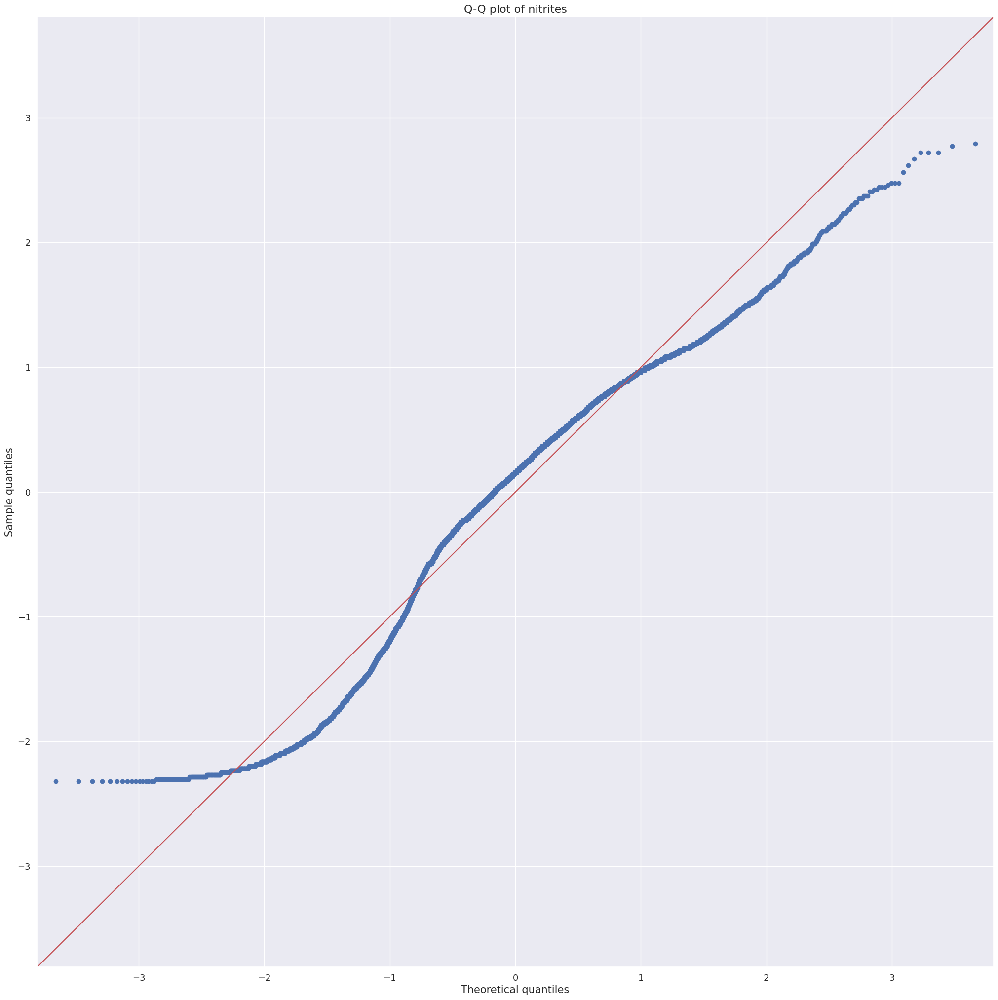

<Figure size 800x500 with 0 Axes>

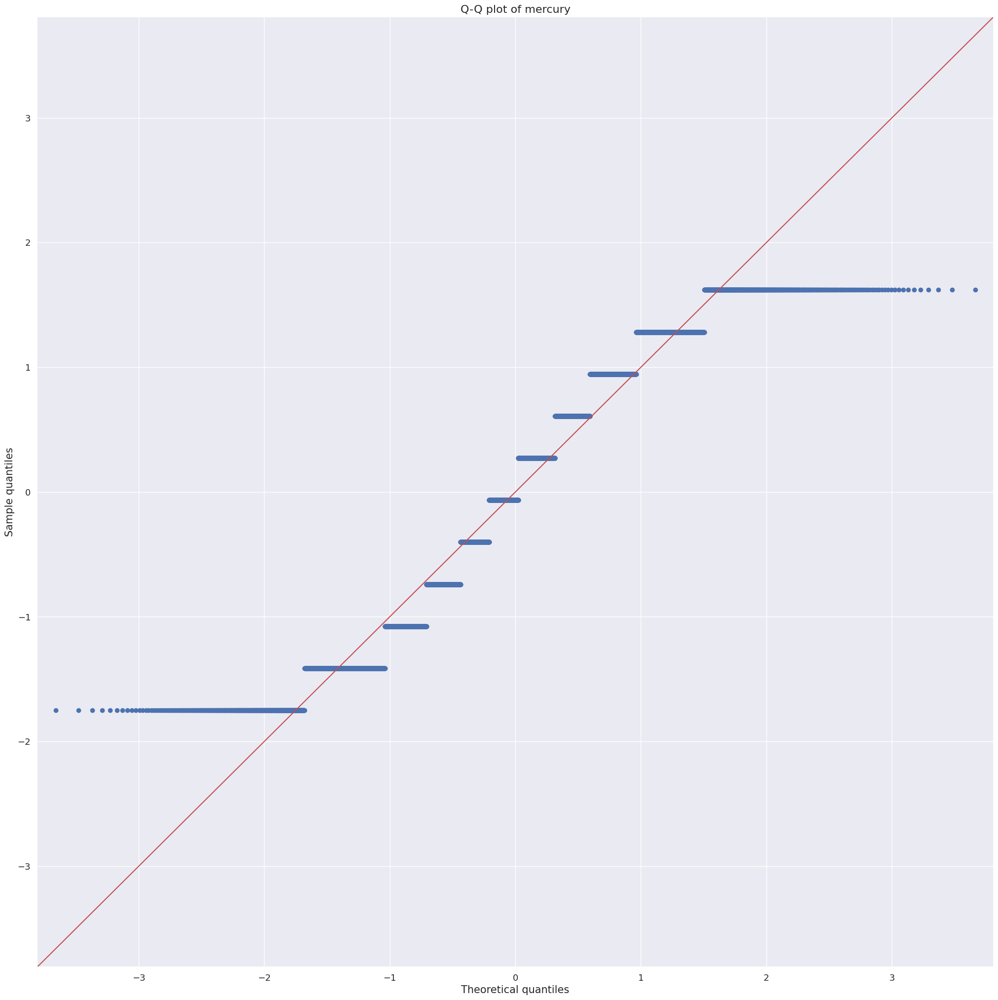

<Figure size 800x500 with 0 Axes>

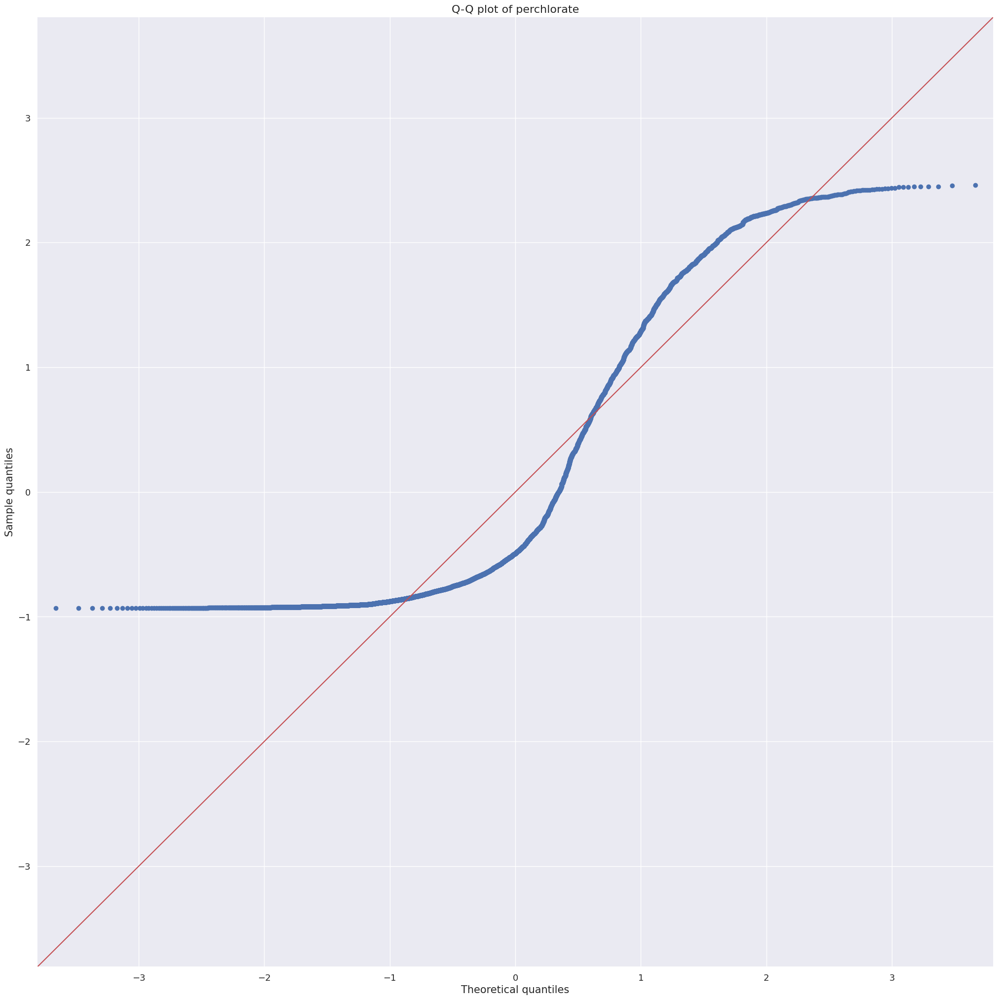

<Figure size 800x500 with 0 Axes>

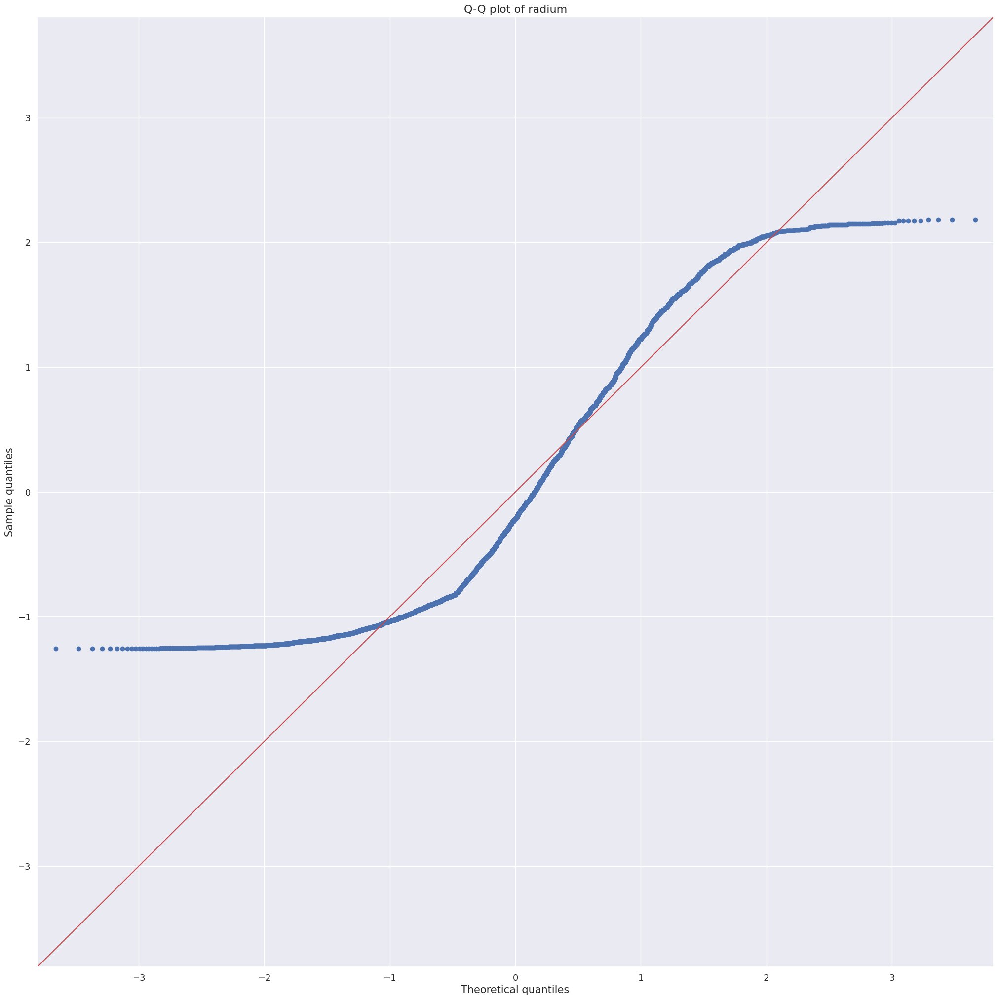

<Figure size 800x500 with 0 Axes>

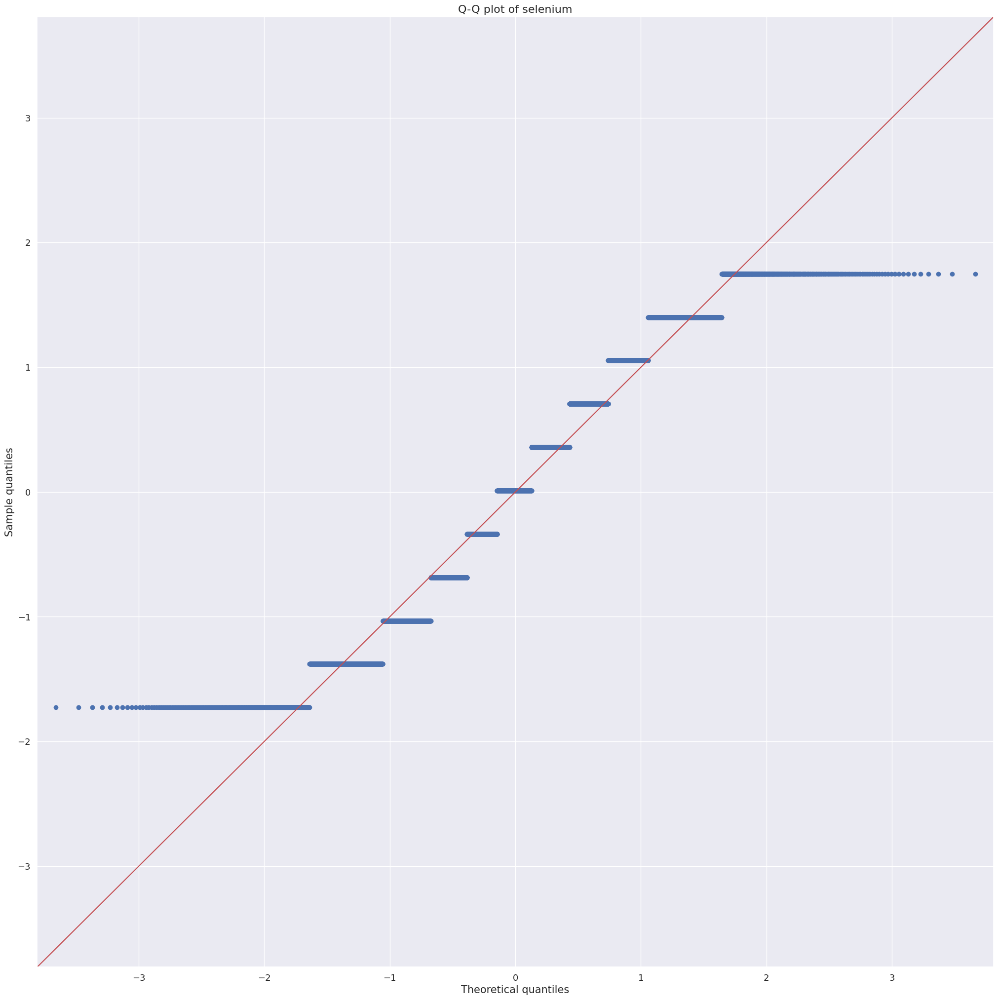

<Figure size 800x500 with 0 Axes>

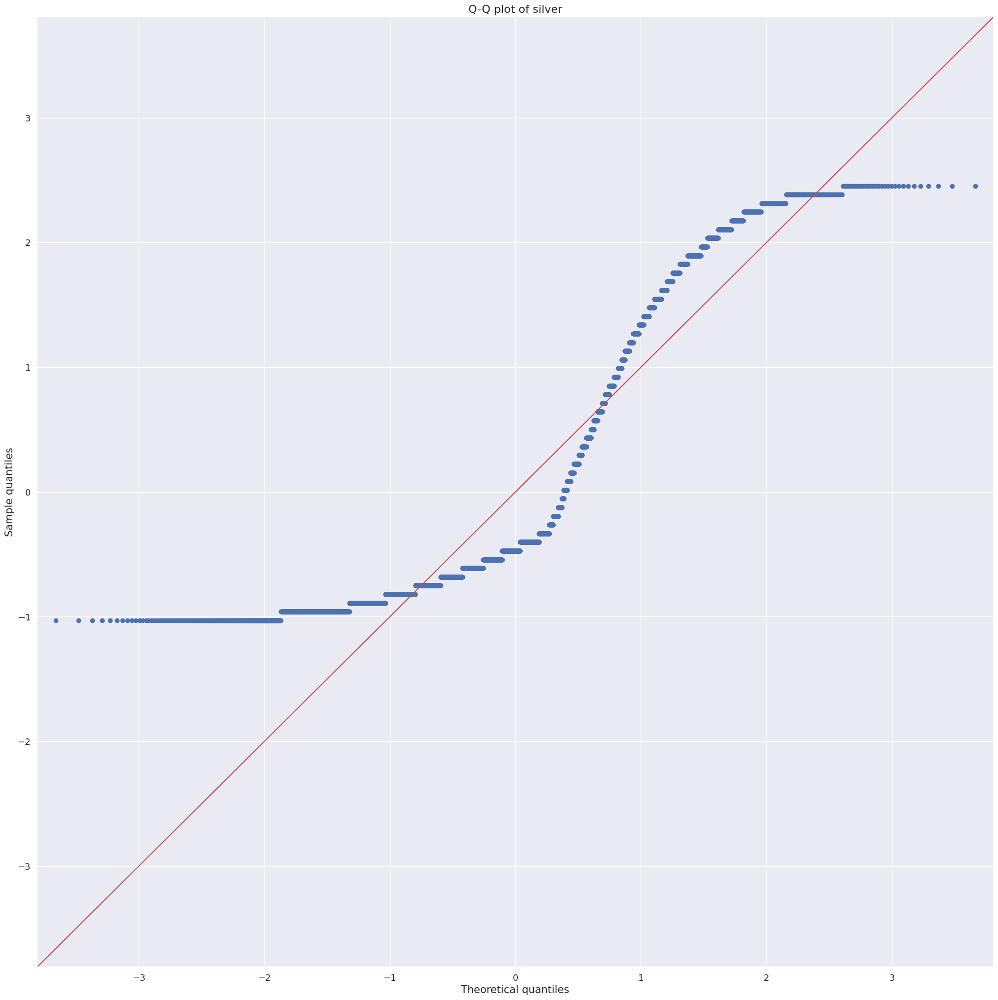

<Figure size 800x500 with 0 Axes>

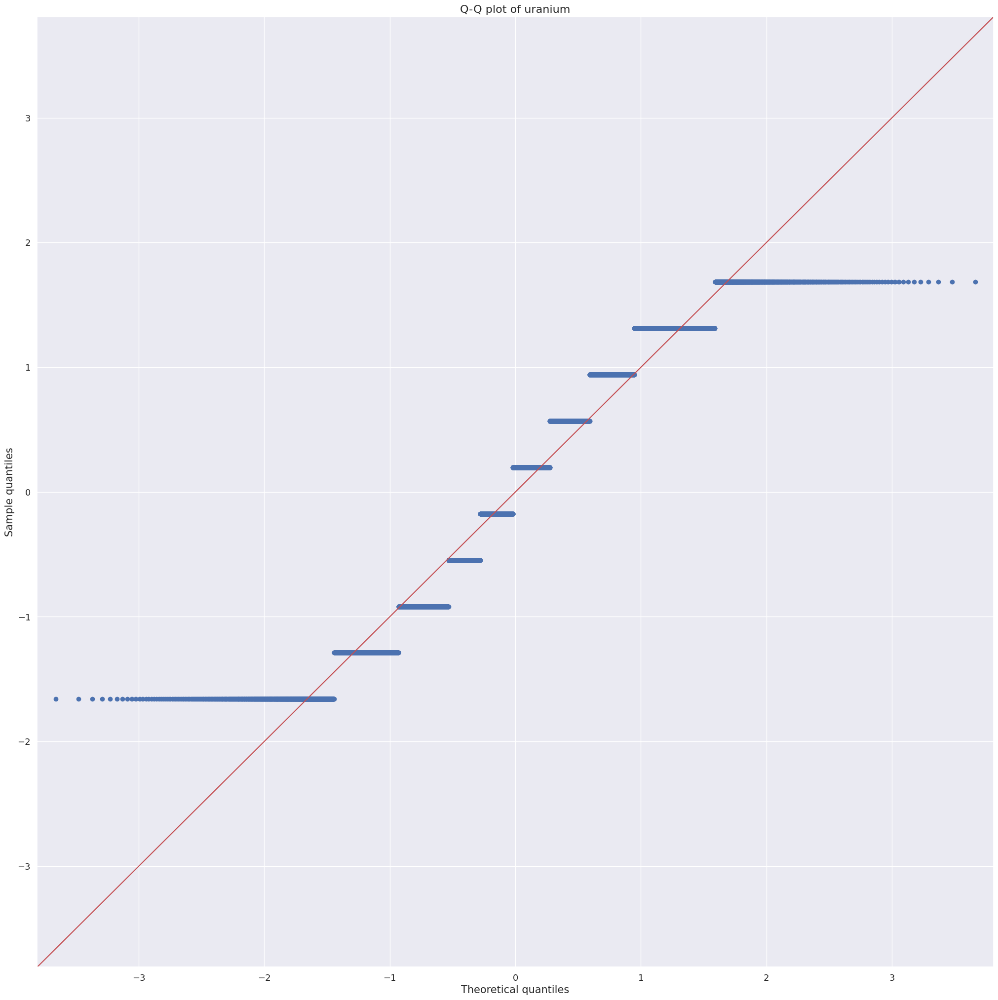

<Figure size 800x500 with 0 Axes>

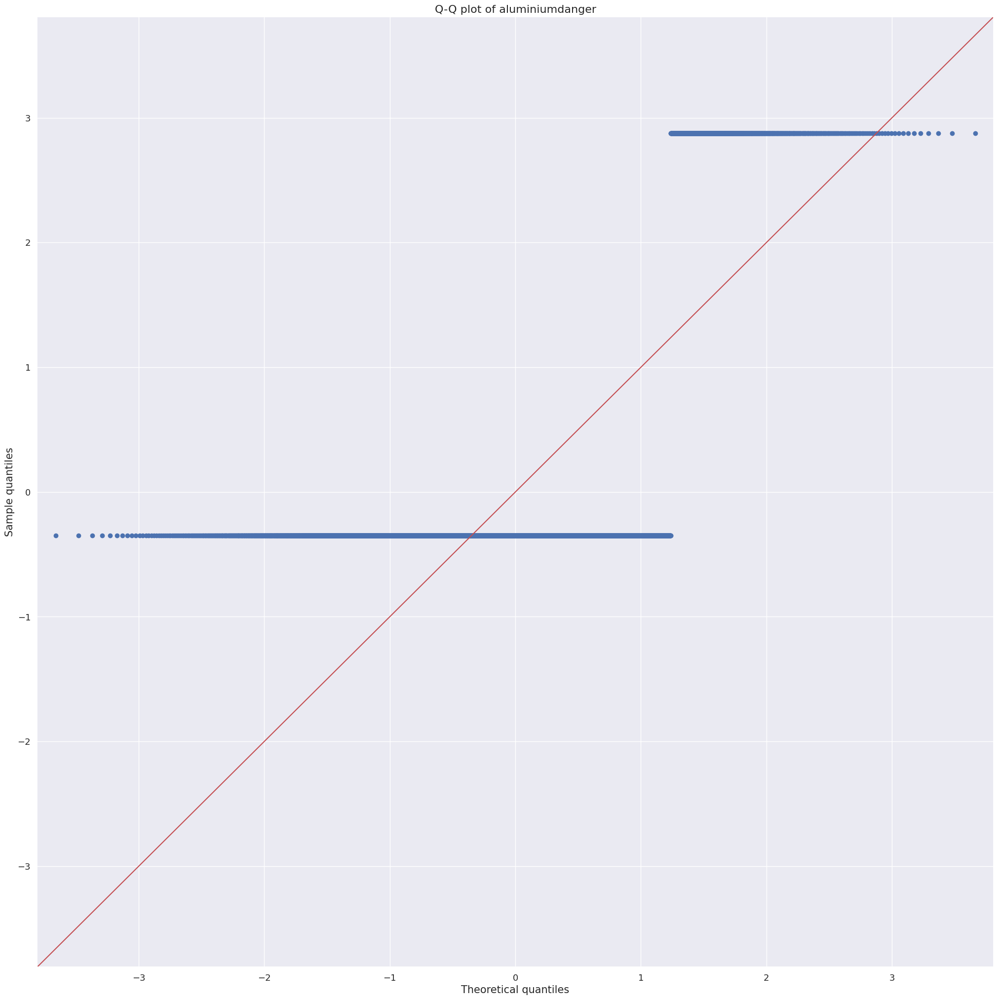

In [11]:
#Checking the distribution of Variables using QQPlot
from statsmodels.graphics.gofplots import qqplot
data_norm=df[['ammonia','arsenic','barium','cadmium','chloramine','chromium','copper','flouride','bacteria','viruses','lead','nitrates','nitrites','mercury','perchlorate','radium','selenium','silver','uranium','aluminiumdanger']]
for c in data_norm.columns[:]:
  plt.figure(figsize=(8,5))
  fig=qqplot(data_norm[c],line='45',fit='True')
  plt.xticks(fontsize=13)
  plt.yticks(fontsize=13)
  plt.xlabel("Theoretical quantiles",fontsize=15)
  plt.ylabel("Sample quantiles",fontsize=15)
  plt.title("Q-Q plot of {}".format(c),fontsize=16)
  plt.grid(True)
  plt.show()

Based on the QQPlot, not all the variables are following normal distribution

### **Q5 Which independent variables have missing data? How much?**


In [12]:
missing_list = df.columns[df.isna().any()].tolist() 
missing_count = []      
for i in missing_list:
  missing_count.append(sum(pd.isnull(df[str(i)])))

d = {'Missing_Column':missing_list,'Missing_Values':missing_count}
Missing_DF = pd.DataFrame(d)
Missing_DF["%_Missing"] = (Missing_DF['Missing_Values'] / df.shape[0]) * 100
Missing_DF

,Missing_Column,Missing_Values,%_Missing



### **Answer:**

There is no missing data in this dataset

### **Q9: Do ranges of predictor variable make sense?**

<Axes: >

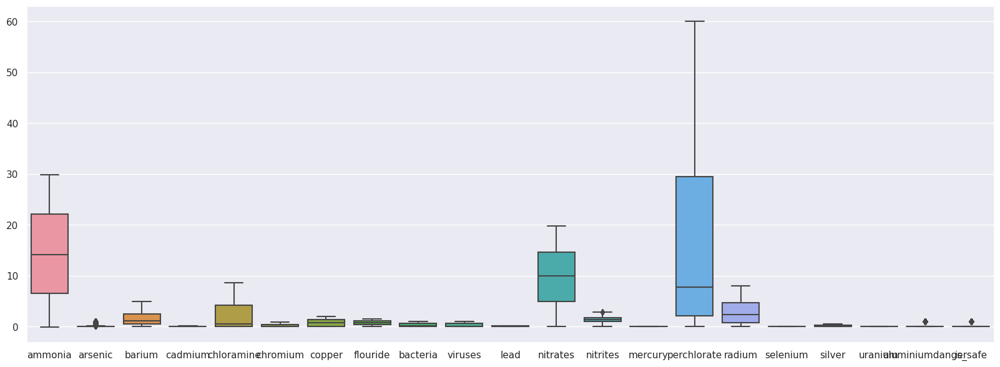

In [13]:
#Checking the Ranges of the predictor variables and dependent variable
plt.figure(figsize=(20,7))
sns.boxplot(data=df)

In [14]:
df.describe()

,ammonia,arsenic,barium,cadmium,chloramine,chromium,copper,flouride,bacteria,viruses,...,nitrates,nitrites,mercury,perchlorate,radium,selenium,silver,uranium,aluminiumdanger,is_safe
count,7999.000000,7999.000000,7999.000000,7999.000000,7999.000000,7999.000000,7999.000000,7999.000000,7999.000000,7999.000000,...,7999.000000,7999.000000,7999.000000,7999.000000,7999.000000,7999.000000,7999.000000,7999.000000,7999.000000,7999.000000
mean,14.275169,0.161445,1.567715,0.042806,2.176831,0.247226,0.805857,0.771565,0.319665,0.328583,...,9.818822,1.329961,0.005194,16.460299,2.920548,0.049685,0.147781,0.044673,0.107888,0.114014
std,8.879239,0.252590,1.216091,0.036049,2.567027,0.270640,0.653539,0.435373,0.329485,0.378096,...,5.541331,0.573219,0.002967,17.687474,2.323009,0.028770,0.143551,0.026904,0.310259,0.317848
min,-0.080000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,6.570000,0.030000,0.560000,0.008000,0.100000,0.050000,0.090000,0.405000,0.000000,0.002000,...,5.000000,1.000000,0.003000,2.170000,0.820000,0.020000,0.040000,0.020000,0.000000,0.000000
50%,14.130000,0.050000,1.190000,0.040000,0.530000,0.090000,0.750000,0.770000,0.220000,0.008000,...,9.930000,1.420000,0.005000,7.740000,2.410000,0.050000,0.080000,0.050000,0.000000,0.000000
75%,22.130000,0.100000,2.480000,0.070000,4.240000,0.440000,1.390000,1.160000,0.610000,0.700000,...,14.610000,1.760000,0.008000,29.480000,4.670000,0.070000,0.240000,0.070000,0.000000,0.000000
max,29.840000,1.050000,4.940000,0.130000,8.680000,0.900000,2.000000,1.500000,1.000000,1.000000,...,19.830000,2.930000,0.010000,60.010000,7.990000,0.100000,0.500000,0.090000,1.000000,1.000000


### **Answer**

No, some predictor have larger range, while some have max value as 60 and other has less than 0.05, we can check this from above df.describe() code. Also, given the above box plot, it's hard to visualize the data. Hence we will normalize the dataset using MinMax scaler

# Data Transforming, Feature Creation and Analysis. 

In [15]:
from sklearn import preprocessing

print(df.columns)


Index(['ammonia', 'arsenic', 'barium', 'cadmium', 'chloramine', 'chromium',
       'copper', 'flouride', 'bacteria', 'viruses', 'lead', 'nitrates',
       'nitrites', 'mercury', 'perchlorate', 'radium', 'selenium', 'silver',
       'uranium', 'aluminiumdanger', 'is_safe'],
      dtype='object')


In [16]:
# Normalizing the data in the columns because the value is too high when compared to other independent variable

from sklearn import preprocessing

print(df.columns)

x1 = df.drop(columns = ['is_safe'])

# Preparing for normalizing
min_max_scaler = preprocessing.MinMaxScaler()

# Transform the data to fit minmax processor
x_scaled = min_max_scaler.fit_transform(x1)

print(x_scaled)

target = df['is_safe']
df_scaled = pd.DataFrame(data = x_scaled, columns= df.drop(columns=['is_safe']).columns)
df_scaled['is_safe']=target

Index(['ammonia', 'arsenic', 'barium', 'cadmium', 'chloramine', 'chromium',
       'copper', 'flouride', 'bacteria', 'viruses', 'lead', 'nitrates',
       'nitrites', 'mercury', 'perchlorate', 'radium', 'selenium', 'silver',
       'uranium', 'aluminiumdanger', 'is_safe'],
      dtype='object')
[[0.30614973 0.03809524 0.57692308 ... 0.68       0.22222222 0.        ]
 [0.70989305 0.00952381 0.67004049 ... 0.54       0.55555556 0.        ]
 [0.47125668 0.03809524 0.11740891 ... 0.88       0.11111111 0.        ]
 ...
 [0.23161765 0.         0.12348178 ... 0.08       0.55555556 0.        ]
 [0.3368984  0.00952381 0.4048583  ... 0.         0.         0.        ]
 [0.23161765 0.00952381 0.1417004  ... 0.08       0.55555556 0.        ]]


In [17]:
#As the ranges were diferent. Below is the output after normalizing the dataset. 
data_norm.describe()

,ammonia,arsenic,barium,cadmium,chloramine,chromium,copper,flouride,bacteria,viruses,lead,nitrates,nitrites,mercury,perchlorate,radium,selenium,silver,uranium,aluminiumdanger
count,7999.000000,7999.000000,7999.000000,7999.000000,7999.000000,7999.000000,7999.000000,7999.000000,7999.000000,7999.000000,7999.000000,7999.000000,7999.000000,7999.000000,7999.000000,7999.000000,7999.000000,7999.000000,7999.000000,7999.000000
mean,14.275169,0.161445,1.567715,0.042806,2.176831,0.247226,0.805857,0.771565,0.319665,0.328583,0.099450,9.818822,1.329961,0.005194,16.460299,2.920548,0.049685,0.147781,0.044673,0.107888
std,8.879239,0.252590,1.216091,0.036049,2.567027,0.270640,0.653539,0.435373,0.329485,0.378096,0.058172,5.541331,0.573219,0.002967,17.687474,2.323009,0.028770,0.143551,0.026904,0.310259
min,-0.080000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,6.570000,0.030000,0.560000,0.008000,0.100000,0.050000,0.090000,0.405000,0.000000,0.002000,0.048000,5.000000,1.000000,0.003000,2.170000,0.820000,0.020000,0.040000,0.020000,0.000000
50%,14.130000,0.050000,1.190000,0.040000,0.530000,0.090000,0.750000,0.770000,0.220000,0.008000,0.102000,9.930000,1.420000,0.005000,7.740000,2.410000,0.050000,0.080000,0.050000,0.000000
75%,22.130000,0.100000,2.480000,0.070000,4.240000,0.440000,1.390000,1.160000,0.610000,0.700000,0.151000,14.610000,1.760000,0.008000,29.480000,4.670000,0.070000,0.240000,0.070000,0.000000
max,29.840000,1.050000,4.940000,0.130000,8.680000,0.900000,2.000000,1.500000,1.000000,1.000000,0.200000,19.830000,2.930000,0.010000,60.010000,7.990000,0.100000,0.500000,0.090000,1.000000


<Axes: >

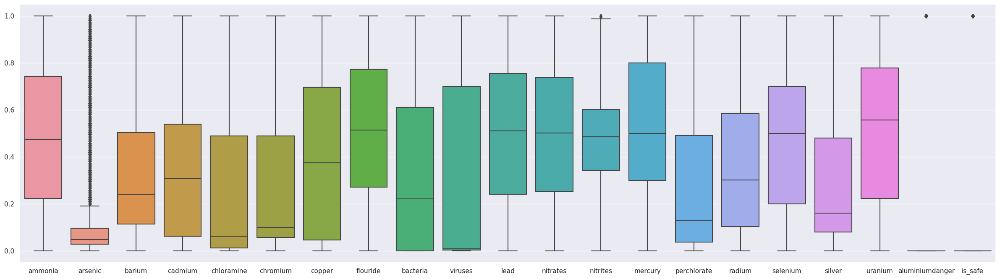

In [18]:
plt.figure(figsize=(30,8))
sns.boxplot(data=df_scaled)

### **Q4: FEATURE IMPORTANCE**

**1. Random Classifier**

In [19]:
from sklearn.model_selection import train_test_split
X = df_scaled.drop(columns = ['is_safe'])
y = df_scaled['is_safe']
X_train, X_test, y_train, y_test = train_test_split(X, y, stratify=y, random_state=42)

In [20]:
from sklearn.ensemble import RandomForestClassifier

feature_names = [f"feature {i}" for i in range(X.shape[1])]
forest = RandomForestClassifier(random_state=0)
forest.fit(X_train, y_train)

RandomForestClassifier(random_state=0)

In [21]:
from sklearn.ensemble import RandomForestClassifier

feature_names = [f"feature {i}" for i in range(X.shape[1])]
forest = RandomForestClassifier(random_state=0)
forest.fit(X_train, y_train)

RandomForestClassifier(random_state=0)

Text(0.5, 0, 'Feature Importance')

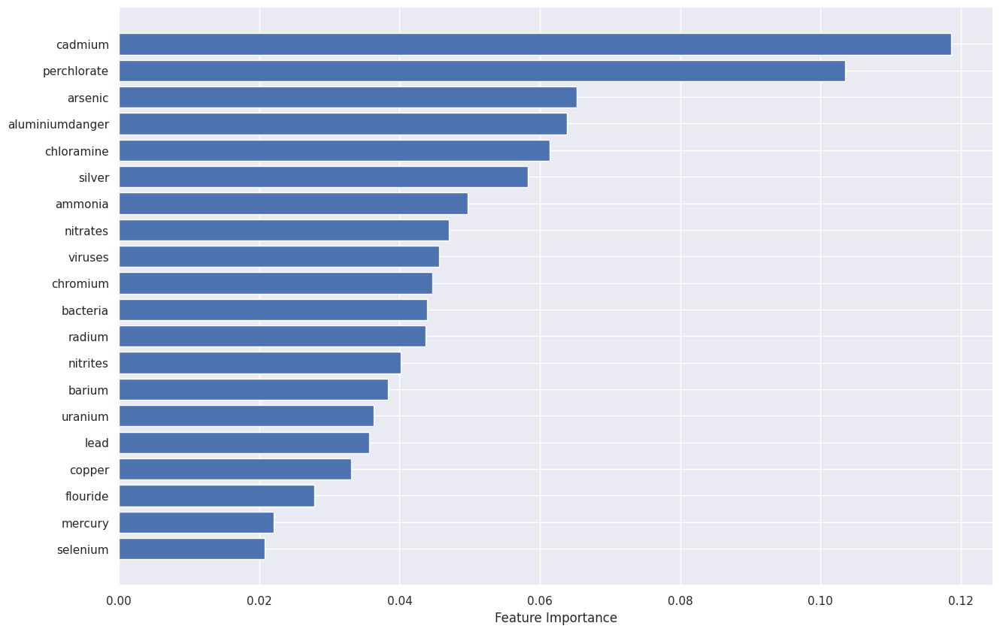

In [22]:
plt.figure(figsize=(15,10))
sort = forest.feature_importances_.argsort()
plt.barh(data_norm.columns[sort], forest.feature_importances_[sort])
plt.xlabel("Feature Importance")

**2. Correlation Matrix**

In [23]:
# Correlation matrix
df_scaled.corr()

,ammonia,arsenic,barium,cadmium,chloramine,chromium,copper,flouride,bacteria,viruses,...,nitrates,nitrites,mercury,perchlorate,radium,selenium,silver,uranium,aluminiumdanger,is_safe
ammonia,1.000000,0.046890,0.070177,-0.006488,0.105002,0.125002,0.016006,-0.028106,0.063693,0.106115,...,0.006423,-0.063560,0.020515,0.091145,0.050194,0.029890,0.075689,0.014555,0.040400,-0.022790
arsenic,0.046890,1.000000,0.362945,0.334682,0.356559,0.312475,-0.036444,0.003792,0.035688,0.011703,...,0.027554,0.305005,-0.015404,0.332279,0.218204,-0.007009,0.307837,0.001455,0.156814,-0.123311
barium,0.070177,0.362945,1.000000,-0.037803,0.446928,0.415972,0.065426,-0.018548,0.101259,-0.002276,...,-0.011331,0.312711,0.005987,0.462234,0.286569,0.035242,0.431606,-0.002440,0.214342,0.090912
cadmium,-0.006488,0.334682,-0.037803,1.000000,-0.144370,-0.157766,-0.109024,0.004880,-0.092431,0.021183,...,0.020194,-0.015682,-0.016174,-0.149344,-0.099259,0.010145,-0.155408,-0.005633,-0.077667,-0.256006
chloramine,0.105002,0.356559,0.446928,-0.144370,1.000000,0.555938,0.119059,0.004400,0.154510,0.003687,...,-0.001551,0.379685,-0.021472,0.588769,0.388806,0.011399,0.522447,-0.007658,0.260172,0.186784
chromium,0.125002,0.312475,0.415972,-0.157766,0.555938,1.000000,0.113043,-0.002284,0.142041,0.002430,...,-0.012793,0.335708,-0.022787,0.524532,0.315271,0.030539,0.510768,-0.005526,0.250624,0.182381
copper,0.016006,-0.036444,0.065426,-0.109024,0.119059,0.113043,1.000000,0.011683,0.149110,0.006292,...,0.002332,0.162093,0.017626,0.104564,0.026215,-0.003267,0.089333,0.006978,0.118346,0.029540
flouride,-0.028106,0.003792,-0.018548,0.004880,0.004400,-0.002284,0.011683,1.000000,0.014134,0.018418,...,-0.008140,-0.016669,-0.004400,-0.016191,0.007688,0.022629,0.014554,0.016792,-0.011812,0.006616
bacteria,0.063693,0.035688,0.101259,-0.092431,0.154510,0.142041,0.149110,0.014134,1.000000,0.618480,...,-0.033920,0.246252,-0.004471,0.147652,0.099298,-0.006971,0.148225,0.044839,-0.069326,-0.022021
viruses,0.106115,0.011703,-0.002276,0.021183,0.003687,0.002430,0.006292,0.018418,0.618480,1.000000,...,-0.044544,-0.091517,0.011416,0.003208,-0.020112,-0.035047,0.011861,0.058434,-0.062216,-0.096907


<Axes: >

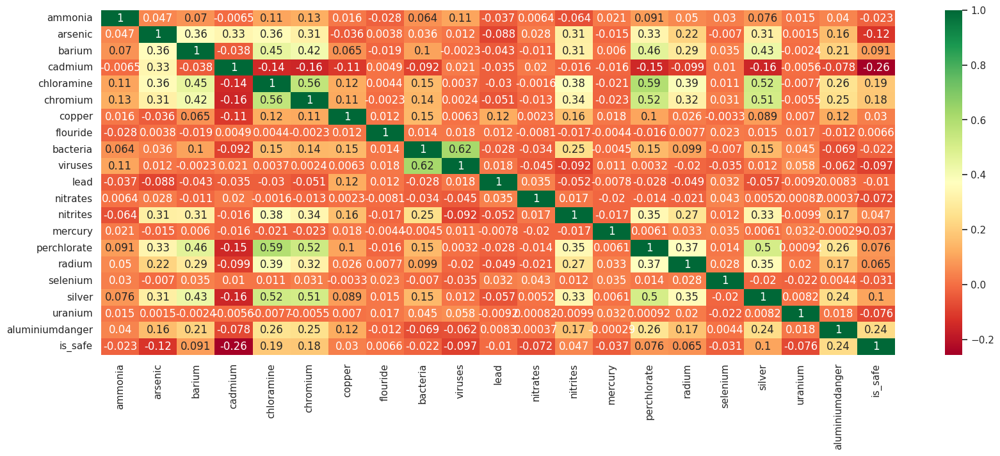

In [24]:
#the heat map of the correlation
plt.figure(figsize=(20,7))
sns.heatmap(df_scaled.corr(), annot=True, cmap='RdYlGn')

From the above we can see that viruses and bacteria are highly related so we will remove bacteria. Also, perchlorate and Chloramine, we will remove Chloramine.

**3. SHAP**

In [25]:
%%time
%time
explainer = shap.TreeExplainer(forest)
%time
shap_values = explainer.shap_values(X_train)

CPU times: user 3 µs, sys: 0 ns, total: 3 µs
Wall time: 6.68 µs
CPU times: user 5 µs, sys: 0 ns, total: 5 µs
Wall time: 9.78 µs
CPU times: user 2min 38s, sys: 847 ms, total: 2min 39s
Wall time: 2min 41s


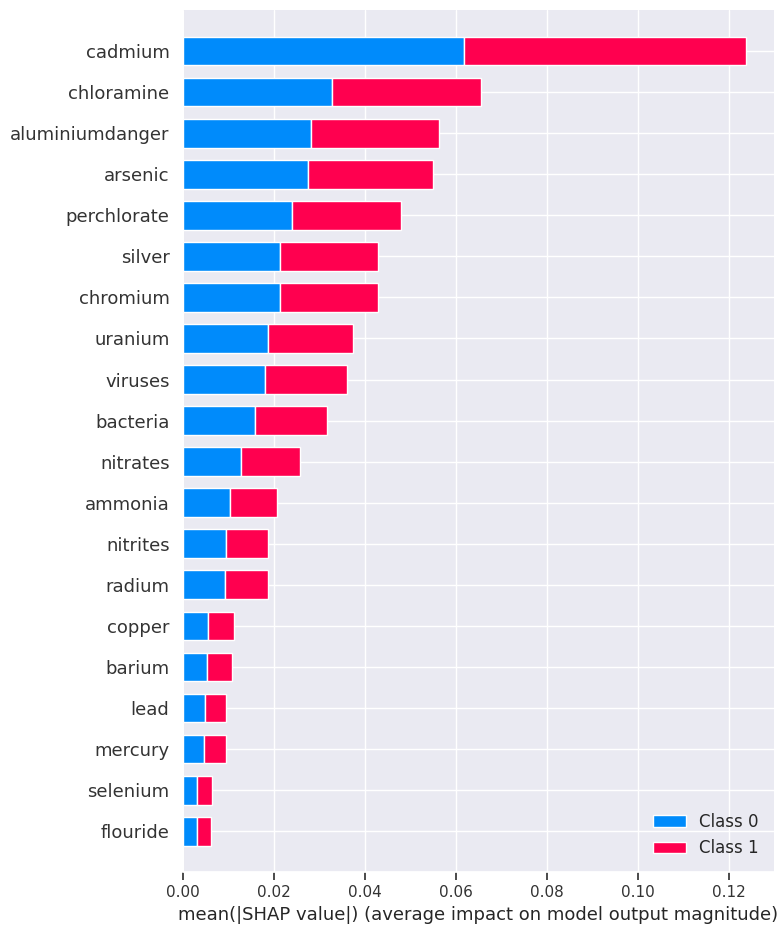

In [26]:
shap.summary_plot(shap_values, features=X_train, feature_names=X.columns, plot_type='bar')

### **Q7 Predictor Variable dependent on other predictor variable**

**Answer** : No, after looking at the correlation matrix we observe that columns which are highly correlated. So we can drop those similar predictor variables (features) .

In [27]:
df_scaled = df_scaled.drop(columns=['bacteria'])
df_scaled = df_scaled.drop(columns=['chloramine'])

In [28]:
df_scaled

,ammonia,arsenic,barium,cadmium,chromium,copper,flouride,viruses,lead,nitrates,nitrites,mercury,perchlorate,radium,selenium,silver,uranium,aluminiumdanger,is_safe
0,0.306150,0.038095,0.576923,0.053846,0.922222,0.085,0.033333,0.000,0.270,0.810893,0.385666,0.7,0.629062,0.848561,0.8,0.68,0.222222,0.0,1
1,0.709893,0.009524,0.670040,0.015385,0.755556,0.330,0.600000,0.650,0.500,0.101362,0.658703,0.3,0.537577,0.401752,0.8,0.54,0.555556,0.0,1
2,0.471257,0.038095,0.117409,0.061538,0.588889,0.010,0.660000,0.003,0.390,0.714070,0.378840,0.6,0.837860,0.884856,0.7,0.88,0.111111,0.0,0
3,0.381350,0.038095,0.599190,0.007692,0.033333,0.830,0.720000,0.710,0.080,0.071104,0.440273,0.4,0.151975,0.215269,0.2,0.90,0.555556,0.0,1
4,0.815842,0.028571,0.040486,0.046154,0.766667,0.285,0.406667,0.001,0.585,0.339889,0.378840,0.3,0.281620,0.301627,0.2,0.12,0.222222,0.0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7994,0.262701,0.000000,0.394737,0.307692,0.033333,0.015,0.913333,0.000,0.985,0.720625,0.341297,0.5,0.059490,0.266583,0.9,0.12,0.333333,0.0,1
7995,0.812166,0.019048,0.119433,0.076923,0.022222,0.010,0.986667,0.000,0.155,0.517902,0.341297,0.1,0.024663,0.138924,0.9,0.20,0.888889,0.0,1
7996,0.231618,0.000000,0.123482,0.230769,0.055556,0.010,0.606667,0.000,0.910,0.802824,0.341297,0.0,0.022496,0.605757,0.0,0.08,0.555556,0.0,1
7997,0.336898,0.009524,0.404858,0.000000,0.000000,0.045,0.000000,0.000,0.000,0.000000,0.000000,0.0,0.000000,0.000000,0.0,0.00,0.000000,0.0,1


## Identifying Predictor Significance

### **Q8 Which predictor variables are the most important?**

**Answer :** By looking at random forest classifier, correlation and **SHAP**, we can see that aluminium_danger, perchlorate and cadmium are the most important. 

In [29]:
pip install eli5

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 216.2/216.2 KB 5.6 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for eli5: filename=eli5-0.13.0-py2.py3-none-any.whl size=107747 sha256=c05e9cef101dea43647a7415459629f61f064739ba7d64f4221e4dfb8b7c624d
  Stored in directory: /root/.cache/pip/wheels/7b/26/a5/8460416695a992a2966b41caa5338e5e7fcea98c9d032d055c
Successfully built eli5


### **Q6: Do the training and test sets have the same data?**

Check if the training and testing dataset is the same distribution

In [30]:
def check_same_data(X_train, X_test):
    # Convert data to pandas DataFrames if necessary
    X_train = pd.DataFrame(X_train) if not isinstance(X_train, pd.DataFrame) else X_train
    X_test = pd.DataFrame(X_test) if not isinstance(X_test, pd.DataFrame) else X_test

    # Check if the number of columns in the training and test data is the same
    if X_train.shape[1] != X_test.shape[1]:
        return False

    # Check if the columns in the training and test data are the same
    for col in X_train.columns:
        if col not in X_test.columns:
            return False

    # Calculate the mean and standard deviation of each column in the training data
    train_mean = X_train.mean()
    train_std = X_train.std()

    # Calculate the mean and standard deviation of each column in the test data
    test_mean = X_test.mean()
    test_std = X_test.std()

    # Check if the mean and standard deviation of each column in the training and test data are the same
    for col in X_train.columns:
        if not np.isclose(train_mean[col], test_mean[col], rtol=1e-5) or not np.isclose(train_std[col], test_std[col], rtol=1e-5):
            return False

    return True

In [31]:
result = check_same_data(X_train, X_test)

if result:
    print("The training and test data have the same data.")
else:
    print("The training and test data do not have the same data.")

The training and test data do not have the same data.


Above code checks, all the rows in testing dataset if it exists in the training dataset. The result signifies that every data point in Training Data and Testing Data are Unique, hence, they are not the same.

### **Q7  In the predictor variables independent of all the other predictor variables?**

**Answer :** No, The independent variables are dependent to other predictor variables.

### **Q10 What are the distributions of the predictor variables?**
**Answer :** By examining the distribution of all the numerical data, we can observe the distribution of predictor variables since they are all numerical.

### **Q11 Remove outliers and keep outliers (does if have an effect of the final predictive model)?**

## Removing Outliers by filtering data outside the inter quartile range


In [32]:
numeric_df=pd.DataFrame([df_scaled.arsenic,df_scaled.nitrites]).transpose()

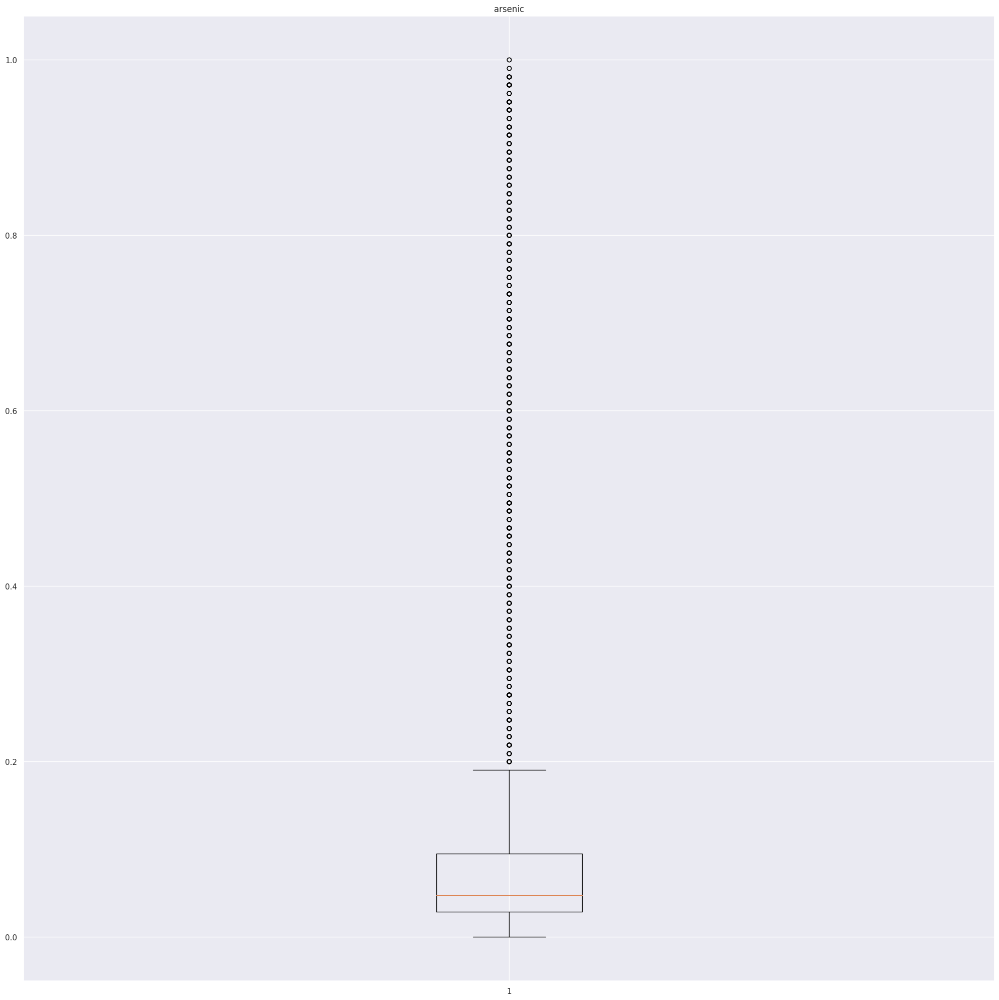

<Figure size 1000x700 with 0 Axes>



The Outliers are :  [0.2952381  0.33333333 0.45714286 ... 0.28571429 0.6        0.61904762]


#################################################################################################



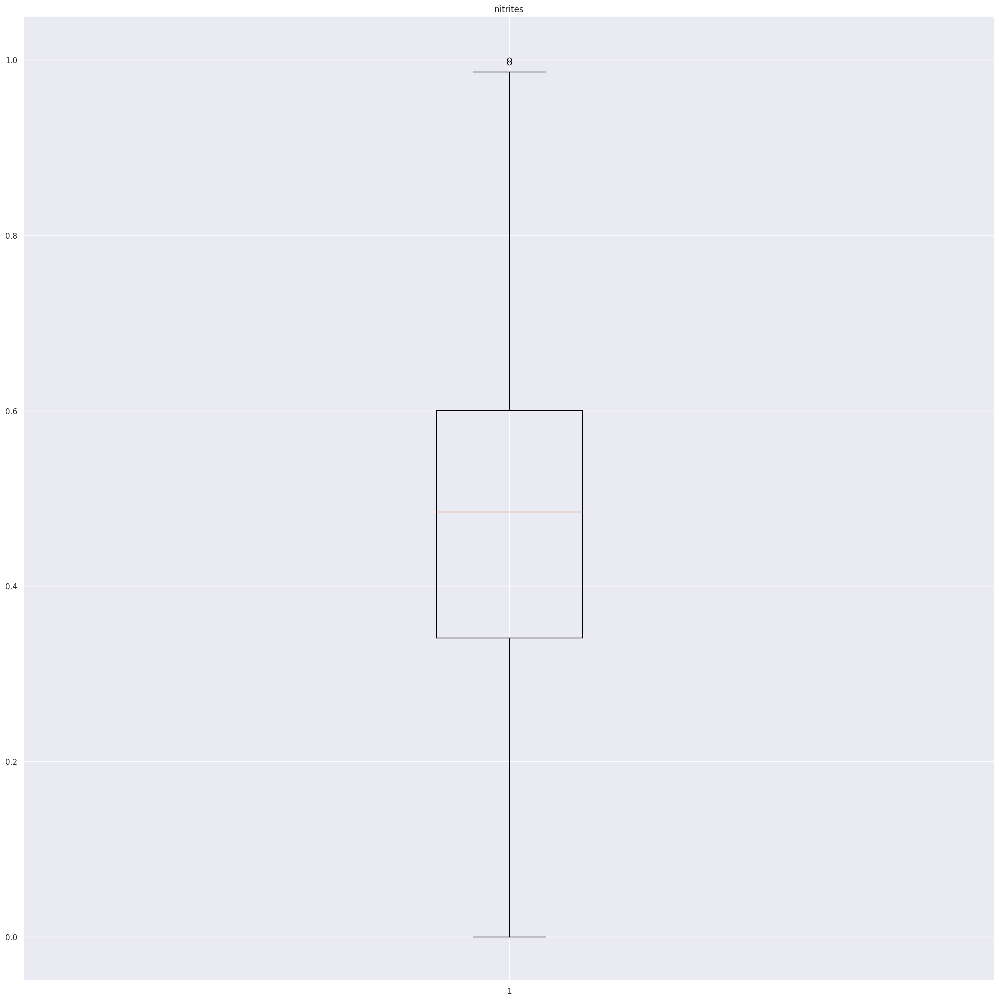

<Figure size 1000x700 with 0 Axes>



The Outliers are :  [0.99658703 1.        ]


#################################################################################################



In [33]:
#finding the outlier in data 

for i in numeric_df.columns:
  plt.title(i)
  plt.boxplot(numeric_df[i])
  fig = plt.figure(figsize =(10, 7))
  
  plt.show()
  
  q1 = np.quantile(numeric_df[i], 0.25)
 
  # finding the 3rd quartile
  q3 = np.quantile(numeric_df[i], 0.75)
  med = np.median(numeric_df[i])
 
  # finding the iqr region
  iqr = q3-q1
 
  # finding upper and lower whiskers
  upper_bound = q3+(1.5*iqr)
  lower_bound = q1-(1.5*iqr)
  outliers = numeric_df[i][(numeric_df[i] <= lower_bound) | (numeric_df[i] >= upper_bound)]
  print("\n")
  print('The Outliers are : ',np.array(outliers))
  print("\n")

  print("#################################################################################################\n")


**Removing Outliers**

In [34]:
cols = df_scaled.columns[:-1].values
Q1 = df_scaled[cols].quantile(0.25)
Q3 = df_scaled[cols].quantile(0.75)
IQR = Q3 - Q1    #IQR is interquartile range. 
print('InterQuartile Range\n',IQR)
# filter = (df['AVG'] >= Q1 - 1.5 * IQR) & (df['AVG'] <= Q3 + 1.5 *IQR)
# IQR['Solidity']

rm_outlier_df = df_scaled
for col in cols:
  print(col)
  filter = (rm_outlier_df[{col}] >= Q1[{col}] - 1.5 * IQR[{col}]) & (rm_outlier_df[{col}] <= Q3[{col}] + 1.5 *IQR[{col}])
  rm_outlier_df = rm_outlier_df.loc[filter[col]]
print('df_scaled shape',df_scaled.shape)

print('rm_outlier_df',rm_outlier_df.shape)

InterQuartile Range
 ammonia            0.520053
arsenic            0.066667
barium             0.388664
cadmium            0.476923
chromium           0.433333
copper             0.650000
flouride           0.503333
viruses            0.698000
lead               0.515000
nitrates           0.484619
nitrites           0.259386
mercury            0.500000
perchlorate        0.455091
radium             0.481852
selenium           0.500000
silver             0.400000
uranium            0.555556
aluminiumdanger    0.000000
dtype: float64
ammonia
arsenic
barium
cadmium
chromium
copper
flouride
viruses
lead
nitrates
nitrites
mercury
perchlorate
radium
selenium
silver
uranium
aluminiumdanger
df_scaled shape (7999, 19)
rm_outlier_df (5861, 19)


In [35]:
rm_outlier_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 5861 entries, 0 to 7998
Data columns (total 19 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   ammonia          5861 non-null   float64
 1   arsenic          5861 non-null   float64
 2   barium           5861 non-null   float64
 3   cadmium          5861 non-null   float64
 4   chromium         5861 non-null   float64
 5   copper           5861 non-null   float64
 6   flouride         5861 non-null   float64
 7   viruses          5861 non-null   float64
 8   lead             5861 non-null   float64
 9   nitrates         5861 non-null   float64
 10  nitrites         5861 non-null   float64
 11  mercury          5861 non-null   float64
 12  perchlorate      5861 non-null   float64
 13  radium           5861 non-null   float64
 14  selenium         5861 non-null   float64
 15  silver           5861 non-null   float64
 16  uranium          5861 non-null   float64
 17  aluminiumdange

## **Q12 Removing Data randomly**

1% Data Removal

In [36]:
p = 0.01
mask = np.random.choice([True, False], size=df_scaled.shape, p=[p,1-p])
nan_1p_df = df_scaled.mask(mask)

In [37]:
nan_1p_df.info()
#We can see 1% data is made null as non null values are not same as total entries

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7999 entries, 0 to 7998
Data columns (total 19 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   ammonia          7915 non-null   float64
 1   arsenic          7915 non-null   float64
 2   barium           7908 non-null   float64
 3   cadmium          7929 non-null   float64
 4   chromium         7916 non-null   float64
 5   copper           7928 non-null   float64
 6   flouride         7924 non-null   float64
 7   viruses          7909 non-null   float64
 8   lead             7939 non-null   float64
 9   nitrates         7909 non-null   float64
 10  nitrites         7931 non-null   float64
 11  mercury          7915 non-null   float64
 12  perchlorate      7925 non-null   float64
 13  radium           7922 non-null   float64
 14  selenium         7921 non-null   float64
 15  silver           7920 non-null   float64
 16  uranium          7934 non-null   float64
 17  aluminiumdange

### 5% Data Removal

In [38]:
p = 0.05
mask = np.random.choice([True, False], size=df_scaled.shape, p=[p,1-p])
nan_5p_df = df_scaled.mask(mask)
nan_5p_df.info()
#We can see 5% data is made null as non null values are not same as total entries

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7999 entries, 0 to 7998
Data columns (total 19 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   ammonia          7622 non-null   float64
 1   arsenic          7581 non-null   float64
 2   barium           7552 non-null   float64
 3   cadmium          7585 non-null   float64
 4   chromium         7596 non-null   float64
 5   copper           7562 non-null   float64
 6   flouride         7594 non-null   float64
 7   viruses          7613 non-null   float64
 8   lead             7597 non-null   float64
 9   nitrates         7631 non-null   float64
 10  nitrites         7570 non-null   float64
 11  mercury          7601 non-null   float64
 12  perchlorate      7588 non-null   float64
 13  radium           7594 non-null   float64
 14  selenium         7574 non-null   float64
 15  silver           7603 non-null   float64
 16  uranium          7582 non-null   float64
 17  aluminiumdange

10% Data removal

In [39]:
p = 0.1
mask = np.random.choice([True, False], size=df_scaled.shape, p=[p,1-p])
nan_10p_df = df_scaled.mask(mask)
print(nan_10p_df.info())
#We can see 10% data is made null as non null values are not same as total entries


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7999 entries, 0 to 7998
Data columns (total 19 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   ammonia          7194 non-null   float64
 1   arsenic          7178 non-null   float64
 2   barium           7203 non-null   float64
 3   cadmium          7199 non-null   float64
 4   chromium         7195 non-null   float64
 5   copper           7180 non-null   float64
 6   flouride         7219 non-null   float64
 7   viruses          7181 non-null   float64
 8   lead             7219 non-null   float64
 9   nitrates         7211 non-null   float64
 10  nitrites         7255 non-null   float64
 11  mercury          7187 non-null   float64
 12  perchlorate      7192 non-null   float64
 13  radium           7192 non-null   float64
 14  selenium         7197 non-null   float64
 15  silver           7201 non-null   float64
 16  uranium          7192 non-null   float64
 17  aluminiumdange

### **Data Imputation**

#### 1. With Mean values


In [40]:
nan_10p_df_mean = nan_10p_df.fillna(nan_10p_df.mean())
nan_1p_df_mean = nan_1p_df.fillna(nan_1p_df.mean())
nan_5p_df_mean = nan_5p_df.fillna(nan_5p_df.mean())


#### 2. Dropping these Nan values

In [41]:
nan_10p_df_drop = nan_10p_df.dropna()
print('nan_10p_df_drop shape:',nan_10p_df_drop.shape)
nan_1p_df_drop = nan_1p_df.dropna()
print('nan_1p_df_drop shape:',nan_1p_df_drop.shape)
nan_5p_df_drop = nan_5p_df.dropna()
print('nan_5p_df_drop shape:',nan_5p_df_drop.shape)


nan_10p_df_drop shape: (1039, 19)
nan_1p_df_drop shape: (6633, 19)
nan_5p_df_drop shape: (2938, 19)


#### 3. Fill with KNN

In [42]:
from sklearn.impute import KNNImputer

imputer = KNNImputer(n_neighbors=5, weights='uniform', metric='nan_euclidean')
# fit on the dataset

def impute_knn(impute_df,imputer):

  X = impute_df
  imputer.fit(X)
  Xtrans = imputer.transform(X)

  res_df = pd.DataFrame(data=Xtrans, columns = impute_df.columns[:])

  return res_df

nan_1p_df_knn = impute_knn(nan_1p_df, imputer)
nan_5p_df_knn = impute_knn(nan_5p_df, imputer)
nan_10p_df_knn = impute_knn(nan_10p_df, imputer)

Reference: https://machinelearningmastery.com/knn-imputation-for-missing-values-in-machine-learning/

#### Check how well imputer mean

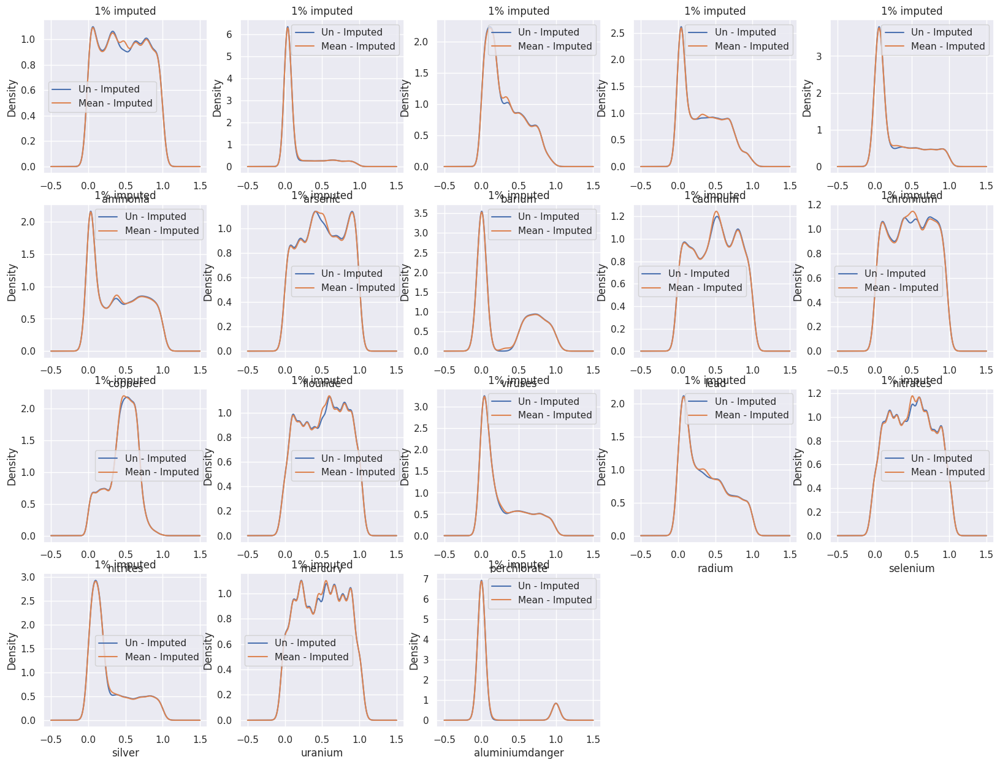

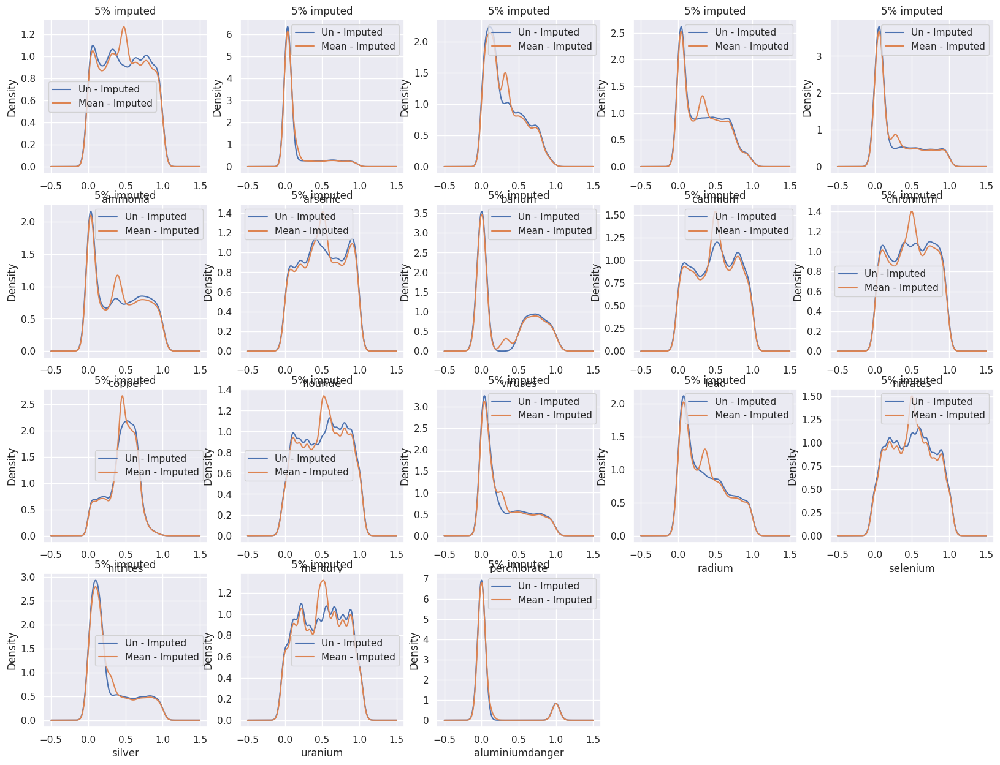

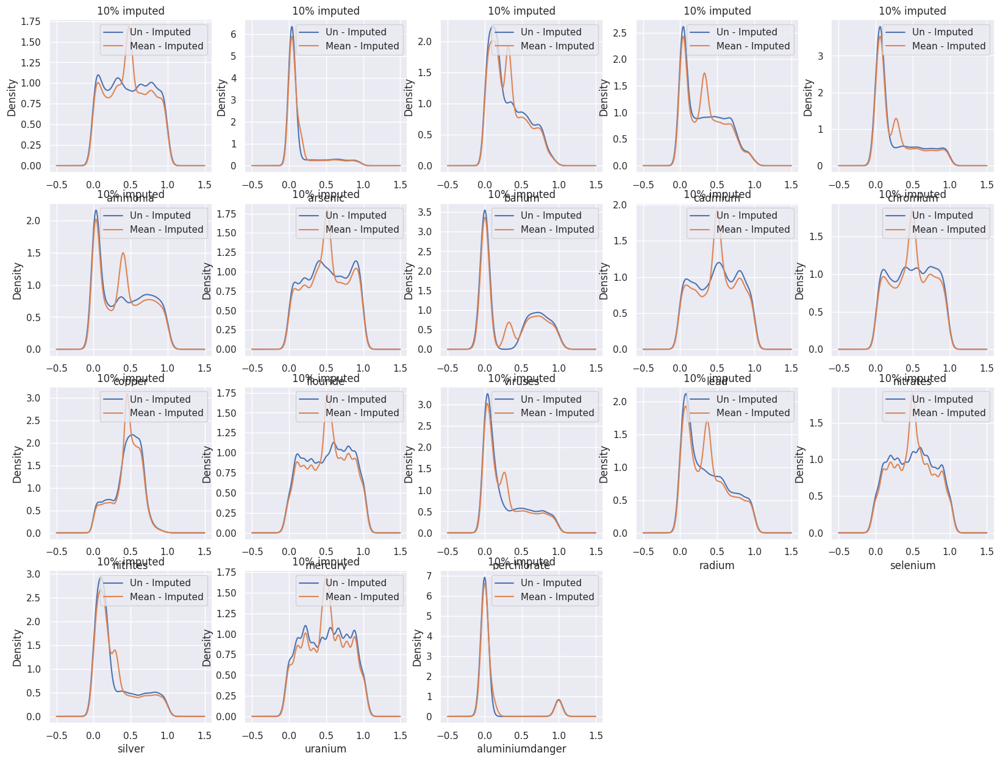

In [43]:
#1% data

plt.figure(figsize=(20,15))

i = 0
for col in cols[:]:
  plt.subplot(4,5,i+1)
  i+=1
  df_scaled[col].plot(kind="kde")
  nan_1p_df_mean[col].plot(kind="kde")
  plt.title('1% imputed')
  plt.legend(["Un - Imputed", "Mean - Imputed"])
  plt.xlabel(f"{col}")
  


#5% data
plt.figure(figsize=(20,15))

i = 0
for col in cols[:]:
  plt.subplot(4,5,i+1)
  i+=1
  df_scaled[col].plot(kind="kde")
  nan_5p_df_mean[col].plot(kind="kde")
  plt.title('5% imputed')
  plt.legend(["Un - Imputed", "Mean - Imputed"])
  plt.xlabel(f"{col}")
  

#10% data
plt.figure(figsize=(20,15))

i = 0
for col in cols[:]:
  plt.subplot(4,5,i+1)
  i+=1
  df_scaled[col].plot(kind="kde")
  nan_10p_df_mean[col].plot(kind="kde")
  plt.title('10% imputed')
  plt.legend(["Un - Imputed", "Mean - Imputed"])
  plt.xlabel(f"{col}")
  

#### Check how well imputer drop

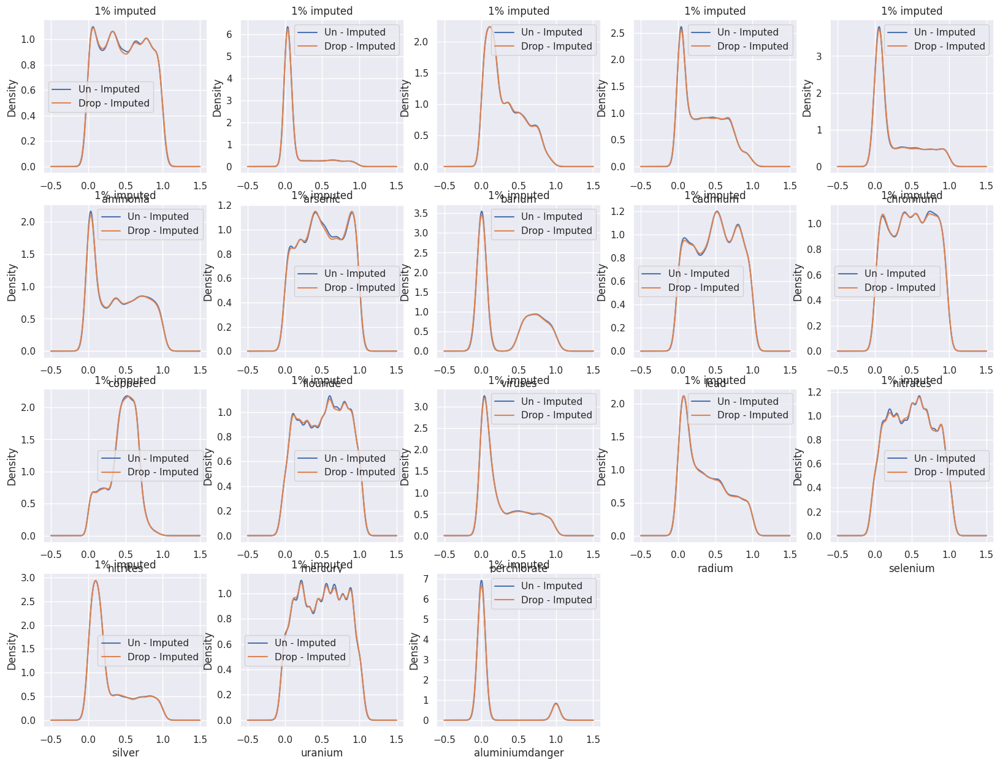

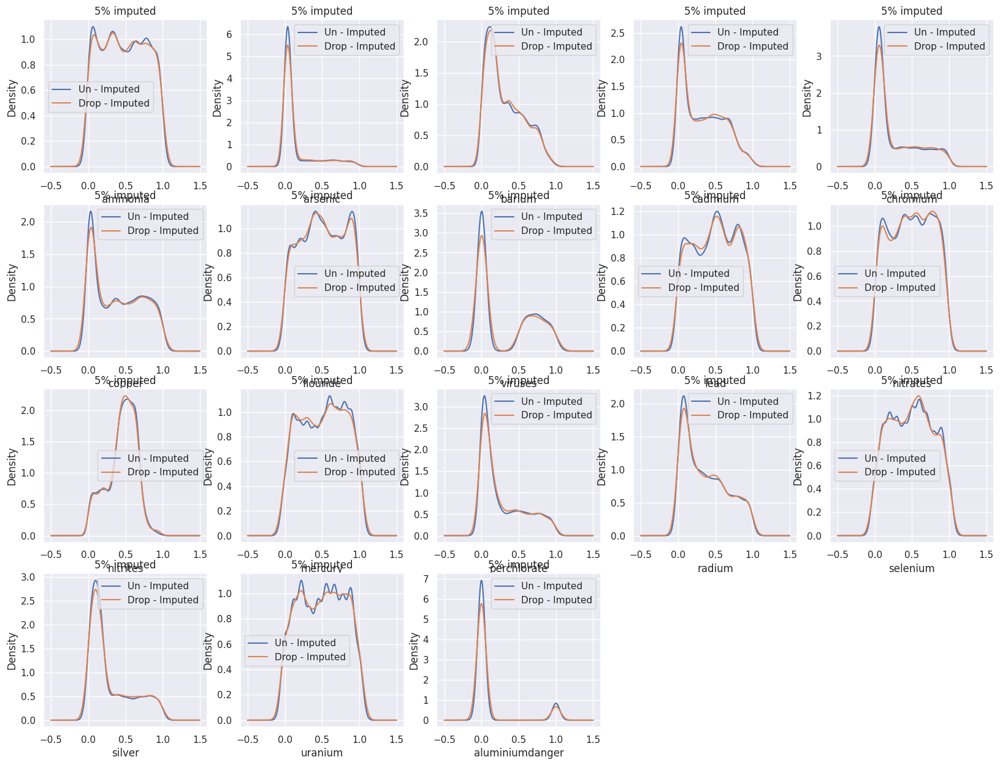

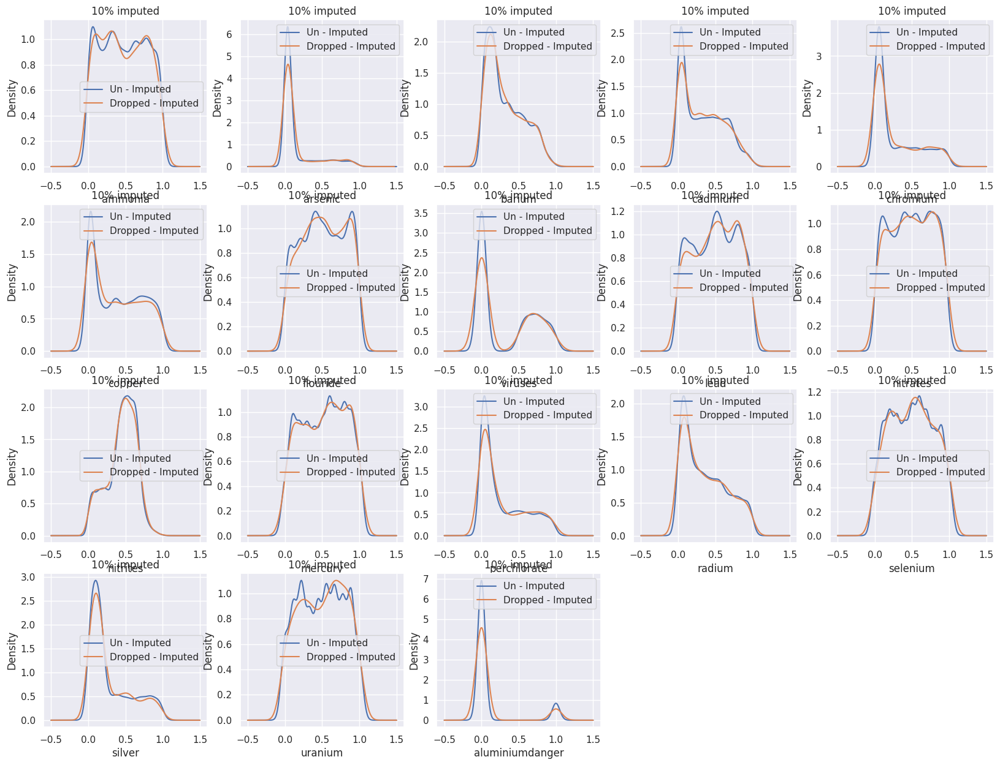

In [44]:
#1% data

plt.figure(figsize=(20,15))

i = 0
for col in cols[:]:
  plt.subplot(4,5,i+1)
  i+=1
  df_scaled[col].plot(kind="kde")
  nan_1p_df_drop[col].plot(kind="kde")
  plt.title('1% imputed')
  plt.legend(["Un - Imputed", "Drop - Imputed"])
  plt.xlabel(f"{col}")
  


#5% data
plt.figure(figsize=(20,15))

i = 0
for col in cols[:]:
  plt.subplot(4,5,i+1)
  i+=1
  df_scaled[col].plot(kind="kde")
  nan_5p_df_drop[col].plot(kind="kde")
  plt.title('5% imputed')
  plt.legend(["Un - Imputed", "Drop - Imputed"])
  plt.xlabel(f"{col}")
  

#10% data
plt.figure(figsize=(20,15))

i = 0
for col in cols[:]:
  plt.subplot(4,5,i+1)
  i+=1
  df_scaled[col].plot(kind="kde")
  nan_10p_df_drop[col].plot(kind="kde")
  plt.title('10% imputed')
  plt.legend(["Un - Imputed", "Dropped - Imputed"])
  plt.xlabel(f"{col}")
  

#### Checking how well impute : KNN

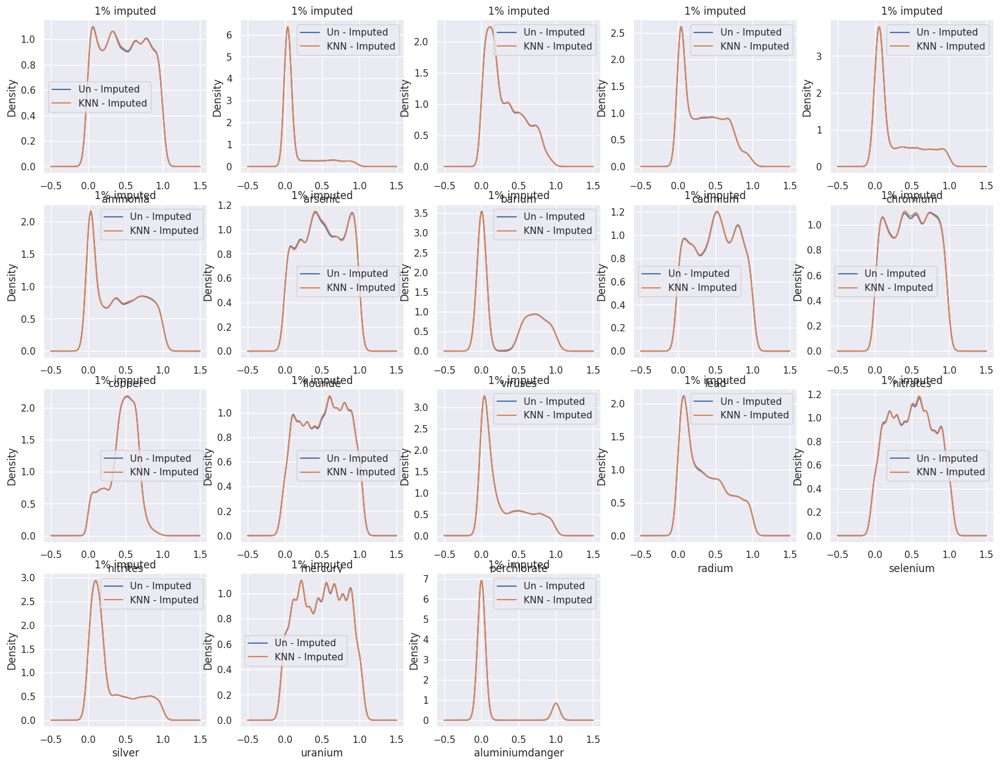

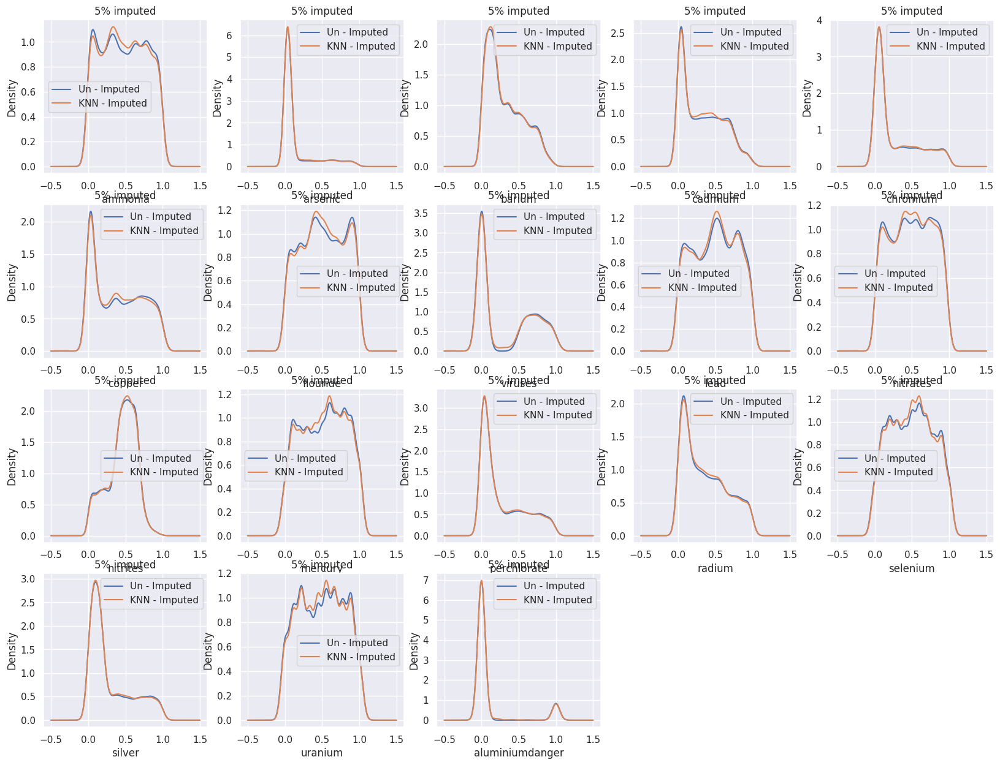

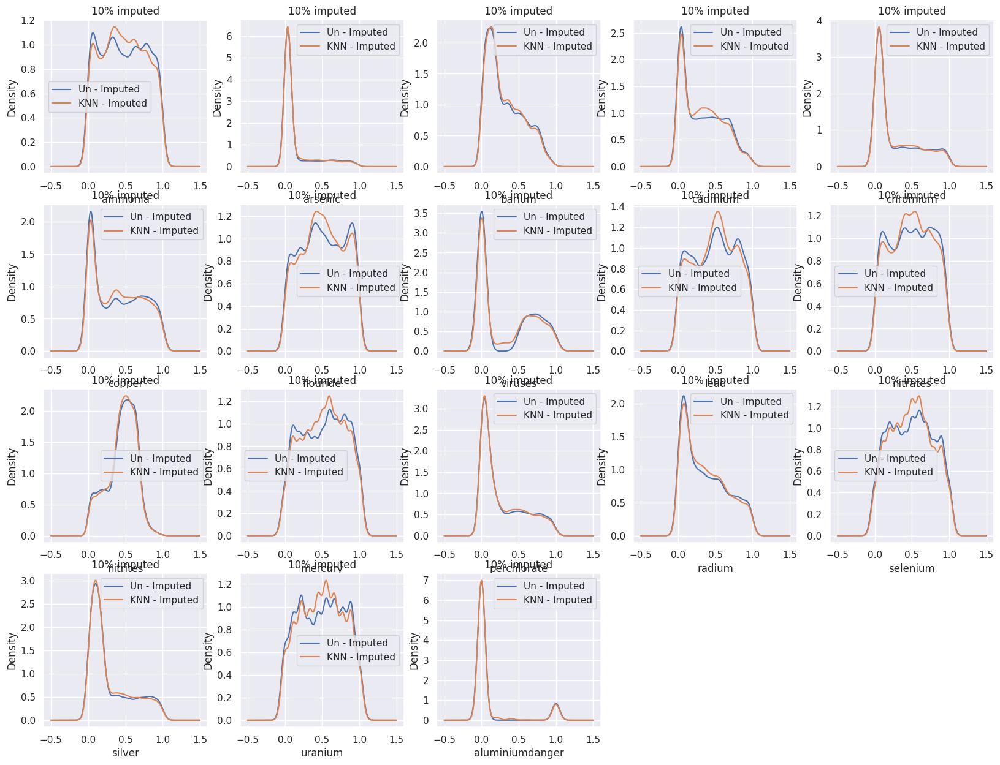

In [45]:

#1% data

plt.figure(figsize=(20,15))

i = 0
for col in cols[:]:
  plt.subplot(4,5,i+1)
  i+=1
  df_scaled[col].plot(kind="kde")
  nan_1p_df_knn[col].plot(kind="kde")
  plt.title('1% imputed')
  plt.legend(["Un - Imputed", "KNN - Imputed"])
  plt.xlabel(f"{col}")
  


#5% data
plt.figure(figsize=(20,15))

i = 0
for col in cols[:]:
  plt.subplot(4,5,i+1)
  i+=1
  df_scaled[col].plot(kind="kde")
  nan_5p_df_knn[col].plot(kind="kde")
  plt.title('5% imputed')
  plt.legend(["Un - Imputed", "KNN - Imputed"])
  plt.xlabel(f"{col}")
  


plt.figure(figsize=(20,15))

i = 0
for col in cols[:]:
  plt.subplot(4,5,i+1)
  i+=1
  df_scaled[col].plot(kind="kde")
  nan_10p_df_knn[col].plot(kind="kde")
  plt.title('10% imputed')
  plt.legend(["Un - Imputed", "KNN - Imputed"])
  plt.xlabel(f"{col}")
  


1. If we examine the distribution of imputed data, we can see that when the level of imputation is low, such as 1%, any method will suffice for my dataset. However, as the level increases to 5% and 10%, using the mean to substitute values results in significant variance.
2. **Eliminating** the missing data does not have a considerable impact on the distribution, but it leads to a loss of valuable training data, which is evident from the shape of the imputed dataframe.
3. For this dataset, KNN performs the best when replacing values, as compared to the original data. Therefore, we should employ KNN for imputation in this dataset.


Reference: https://github.com/aiskunks/YouTube/blob/main/A_Crash_Course_in_Statistical_Learning/ML_Data_Cleaning_and_Feature_Selection/ML_Data_Cleaning_and_Feature_Selection_Wine_Quality.ipynb

In [46]:
# model training
data = df_scaled
X = data.drop(columns=["is_safe"])
y = data['is_safe']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)
clf = RandomForestClassifier()
clf.fit(X_train, y_train)

RandomForestClassifier()

In [47]:
clf.score(X_test, y_test)

0.9108333333333334

###**Answer**: From the above score we can see that Accuracy is 91%.

### Testing accuracy without outliers

In [48]:
# rm_outlier_df
# After removing outliers Model traing

data_df = rm_outlier_df

X = data_df.drop(columns=["is_safe"])
y = data_df['is_safe']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)
clf = RandomForestClassifier()# SVC(gamma='auto')
clf.fit(X_train, y_train)

RandomForestClassifier()

In [49]:
clf.score(X_test, y_test)

0.8828880045480386

In [50]:
!pip install shap

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [51]:
import pandas as pd
import shap
from sklearn.model_selection import train_test_split
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import OrdinalEncoder, StandardScaler, OneHotEncoder
from sklearn_pandas import DataFrameMapper
from sklearn.impute import SimpleImputer
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_absolute_error
from sklearn.ensemble import RandomForestRegressor
import statsmodels.api as sm
import numpy as np
import matplotlib.pyplot as plt

In [52]:
pandas_df = pd.read_csv("https://raw.githubusercontent.com/ParvatiSohani/DSEM_1/main/waterQuality1.csv") 

From the Above Matrix we can conclude a few things

1. Viruses and Bacteria are highly correlated perchlorate and chloramine are highly correlated.

2. Bacteria and viruses are highly correlated.

In [53]:
x = pandas_df.drop('is_safe',axis=1)

In [54]:
y = pandas_df['is_safe']

In [55]:
X_train, X_test, y_train, y_test = train_test_split(x, y, test_size=0.1, shuffle=False)

## **Linear Regression**

In [56]:
numerical_features = [c for c in X_train.columns]
#cat = [([c], [OrdinalEncoder()]) for c in catagorical_features]
num = [([n], [SimpleImputer(), StandardScaler()]) for n in numerical_features]
mapper = DataFrameMapper(num , df_out=True)
preprocessed_X_train = mapper.fit_transform(X_train)
preprocessed_X_train = sm.add_constant(preprocessed_X_train)
reg = sm.OLS(y_train, preprocessed_X_train).fit()

In [57]:
from sklearn.metrics import mean_absolute_error

def evaluate(X, y, transformer=None, model=None, transform=False):
    if transform and transformer is not None:
        X = transformer.transform(X)
        X = sm.add_constant(X, has_constant='add') 
    y_pred = model.predict(X)
    return mean_absolute_error(y, y_pred) if len(y) == len(y_pred) else None

In [58]:
train_mae = evaluate(X_train, y_train,mapper, model=reg, transform=True)
test_mae = evaluate(X_test, y_test, mapper, model=reg, transform=True)
if train_mae is not None and test_mae is not None:
    print(f"train MAE = {round(train_mae, 3)}, test MAE = {round(test_mae, 3)} ")
else:
    print("Error: target variables have different lengths.")

train MAE = 0.199, test MAE = 0.138 


In [59]:
reg.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                is_safe   R-squared:                       0.182
Model:                            OLS   Adj. R-squared:                  0.180
Method:                 Least Squares   F-statistic:                     80.12
Date:                Mon, 10 Apr 2023   Prob (F-statistic):          5.31e-295
Time:                        01:53:23   Log-Likelihood:                -1517.6
No. Observations:                7199   AIC:                             3077.
Df Residuals:                    7178   BIC:                             3222.
Df Model:                          20                                         
Covariance Type:            nonrobust                                         
===================================================================================
                      coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------
const               0.1247      0.004     35.374      0.000       0.118       0.132
ammonia            -0.0186      0.004     -5.239      0.000      -0.026      -0.012
arsenic            -0.0568      0.005    -12.619      0.000      -0.066      -0.048
barium              0.0137      0.004      3.187      0.001       0.005       0.022
cadmium            -0.0559      0.004    -13.579      0.000      -0.064      -0.048
chloramine          0.0494      0.005     10.109      0.000       0.040       0.059
chromium            0.0381      0.005      8.316      0.000       0.029       0.047
copper             -0.0157      0.004     -4.221      0.000      -0.023      -0.008
flouride            0.0037      0.004      1.055      0.291      -0.003       0.011
bacteria            0.0061      0.005      1.208      0.227      -0.004       0.016
viruses            -0.0330      0.005     -6.946      0.000      -0.042      -0.024
lead               -0.0055      0.004     -1.541      0.123      -0.013       0.002
nitrates           -0.0234      0.004     -6.612      0.000      -0.030      -0.016
nitrites            0.0099      0.005      2.105      0.035       0.001       0.019
mercury            -0.0086      0.004     -2.429      0.015      -0.016      -0.002
perchlorate        -0.0395      0.005     -8.327      0.000      -0.049      -0.030
radium             -0.0032      0.004     -0.793      0.428      -0.011       0.005
selenium           -0.0116      0.004     -3.269      0.001      -0.019      -0.005
silver             -0.0130      0.005     -2.865      0.004      -0.022      -0.004
uranium            -0.0254      0.004     -7.174      0.000      -0.032      -0.018
aluminiumdanger     0.0678      0.004     17.935      0.000       0.060       0.075
==============================================================================
Omnibus:                     2184.465   Durbin-Watson:                   1.513
Prob(Omnibus):                  0.000   Jarque-Bera (JB):             5258.514
Skew:                           1.713   Prob(JB):                         0.00
Kurtosis:                       5.406   Cond. No.                         3.83
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

***Observation***


The table indicates that the p-values of variables such as cadmium, perchlorate, ammonia, arsenic, barium, and others, are equal or close to 0, which suggests that they are important features. 

However, to rank these features and gain a better understanding of their importance, we can conduct a Shap analysis

**RANDOM FOREST**

In [60]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.pipeline import Pipeline
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_absolute_error

# Split the data into training and test sets
X_train, X_test, y_train, y_test = train_test_split(x, y, test_size=0.1, shuffle=False)

# Define the numerical features and preprocessing pipeline
numerical_features = [c for c in X_train.columns]
preprocessor = Pipeline([
    ('imputer', SimpleImputer()),
    ('scaler', StandardScaler())
])

In [61]:
# Define the random forest regression model and the overall pipeline
model = RandomForestRegressor()
pipeline = Pipeline([
    ('preprocess', preprocessor),
    ('reg', model)
])

# Fit the pipeline to the training data
pipeline.fit(X_train[numerical_features], y_train)

Pipeline(steps=[('preprocess',
                 Pipeline(steps=[('imputer', SimpleImputer()),
                                 ('scaler', StandardScaler())])),
                ('reg', RandomForestRegressor())])

In [62]:
# Evaluate the model on the training and test sets
train_mae = mean_absolute_error(y_train, pipeline.predict(X_train[numerical_features]))
test_mae = mean_absolute_error(y_test, pipeline.predict(X_test[numerical_features]))
print(f"train MAE = {round(train_mae, 3)}, test MAE = {round(test_mae, 3)} ")

train MAE = 0.055, test MAE = 0.069 


Text(0.5, 1.0, 'Numerical Feature Importances')

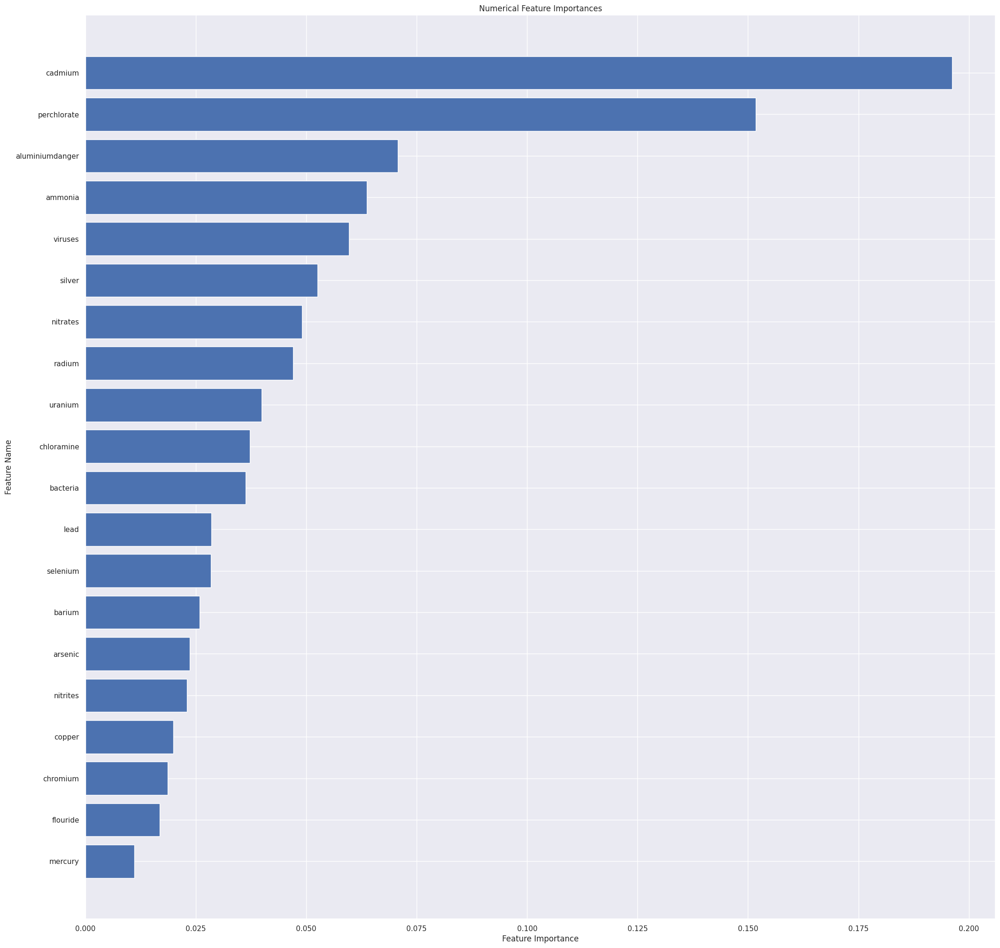

In [63]:
numerical_features = X_train.select_dtypes(include=['float64', 'int64']).columns

# Train a random forest regression model
reg = RandomForestRegressor()
reg.fit(X_train[numerical_features], y_train)

# Calculate feature importances
feature_importances = reg.feature_importances_
sorted_idx = feature_importances.argsort()
result = sorted(zip(numerical_features, feature_importances), key=lambda x: x[1], reverse=False)

plt.barh([x[0] for x in result], [x[1] for x in result])
plt.xlabel('Feature Importance')
plt.ylabel('Feature Name')
plt.title('Numerical Feature Importances')


In [64]:
from sklearn.tree import export_graphviz
from matplotlib.pyplot import figure
import pydot
import matplotlib.image as mpimg
tree_model = RandomForestRegressor(max_depth=3, random_state=0, n_estimators=10)
tree_model.fit(X_train, y_train)

RandomForestRegressor(max_depth=3, n_estimators=10, random_state=0)

In this decision tree, every internal node represents a specific condition, and each leaf has an associated value that needs to be predicted. Moreover, we have also included the value of the mean response variables for each region at every internal node.

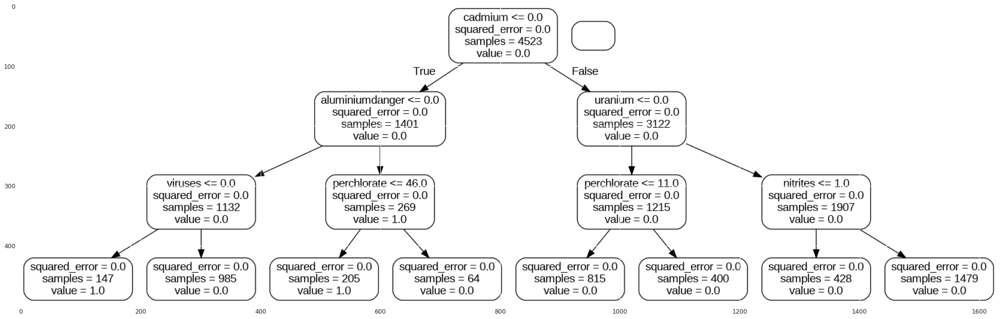

In [65]:
# Visualization of Nodes for the purpose of explainability
figure(figsize=(32, 24), dpi=80)
tree = tree_model.estimators_[0]
export_graphviz(
    tree,
    out_file="tree.dot",
    feature_names=list(X_train.columns),
    rounded=True,
    precision=0,
)
(graph,) = pydot.graph_from_dot_file("tree.dot")
graph.write_png("tree.png")
img = mpimg.imread("tree.png")
imgplot = plt.imshow(img)
plt.show()

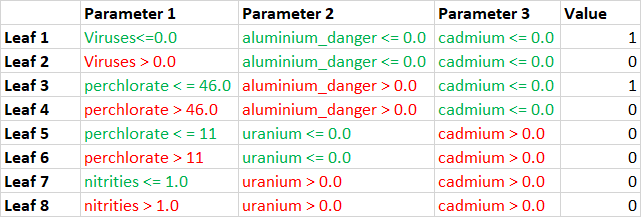

Please refer to the above table to understand how the tree nodes works

The first leaf gets gains from all parameters as the condition satisfied for all 3 parameters 

The second leaf gets gains from parameters 2, and 3 but not from parameters 1. Similarly, the red marked cells are the losses incurred and Green marked cells are the gains incurred from the parameters which give us output as values for this specific decision tree.

***Observations***

It is clear from the above plot that Cadmium and then perchlorate are the most important features for predicting water quality
Features such as alumium danger and ammonia are also some other important features

## **AUTO ML**

In [66]:
##Installing all the required libraries for AUTOML
!pip install requests
!pip install tabulate
!pip install "colorama>=0.3.8"
!pip install future
!pip install h2o

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 177.6/177.6 MB 5.0 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for h2o: filename=h2o-3.40.0.3-py2.py3-none-any.whl size=177694727 sha256=4e6b1b362d18b1e9323565e80600f600271010cd8e49910eac960dd7f80e85f2
  Stored in directory: /root/.cache/pip/wheels/9a/54/b6/c9ab3e71309ef0000bbe39e715020dc151bbfc557784b7f4c9
Successfully built h2o


In [67]:
import h2o
from h2o.automl import H2OAutoML
from h2o.estimators.gbm import H2OGradientBoostingEstimator
from h2o.grid.grid_search import H2OGridSearch
import random, os, sys
from datetime import datetime
import pandas as pd
import logging
import csv
import optparse
import time
import json
from distutils.util import strtobool
import psutil
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.pyplot import figure
import numpy as np
import pandas as pd
import matplotlib.pylab as plt
import seaborn as sns
from scipy.stats import pearsonr
from statsmodels.stats.outliers_influence import variance_inflation_factor
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import GridSearchCV

sns.set(rc={"figure.figsize": (16, 8)})

In [68]:
# Setting up maximum runtime for the AutoML
min_mem_size = 6
run_time = 222

In [69]:
pct_memory = 0.5
virtual_memory = psutil.virtual_memory()
min_mem_size = int(round(int(pct_memory * virtual_memory.available) / 1073741824, 0))
print(min_mem_size)

5


In [70]:
# 65535 Highest port no
# Start the H2O server on a random port
port_no = random.randint(5555, 55555)
#  h2o.init(strict_version_check=False,min_mem_size_GB=min_mem_size,port=port_no) # start h2o
try:
    h2o.init(
        strict_version_check=False, min_mem_size_GB=min_mem_size, port=port_no
    )  # start h2o
except:
    logging.critical("h2o.init")
    h2o.download_all_logs(dirname=logs_path, filename=logfile)
    h2o.cluster().shutdown()
    sys.exit(2)

Checking whether there is an H2O instance running at http://localhost:44152..... not found.
Attempting to start a local H2O server...
  Java Version: openjdk version "11.0.18" 2023-01-17; OpenJDK Runtime Environment (build 11.0.18+10-post-Ubuntu-0ubuntu120.04.1); OpenJDK 64-Bit Server VM (build 11.0.18+10-post-Ubuntu-0ubuntu120.04.1, mixed mode, sharing)
  Starting server from /usr/local/lib/python3.9/dist-packages/h2o/backend/bin/h2o.jar
  Ice root: /tmp/tmpe_o03udh
  JVM stdout: /tmp/tmpe_o03udh/h2o_unknownUser_started_from_python.out
  JVM stderr: /tmp/tmpe_o03udh/h2o_unknownUser_started_from_python.err
  Server is running at http://127.0.0.1:44152
Connecting to H2O server at http://127.0.0.1:44152 ... successful.


H2O_cluster_uptime:,07 secs
H2O_cluster_timezone:,Etc/UTC
H2O_data_parsing_timezone:,UTC
H2O_cluster_version:,3.40.0.3
H2O_cluster_version_age:,5 days
H2O_cluster_name:,H2O_from_python_unknownUser_2rntox
H2O_cluster_total_nodes:,1
H2O_cluster_free_memory:,5 Gb
H2O_cluster_total_cores:,2
H2O_cluster_allowed_cores:,2
H2O_cluster_status:,"locked, healthy"


In [71]:
df = h2o.H2OFrame(
    pandas_df
)

Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%


In [72]:
pct_rows = 0.80  # Setting up the data split between training and test dataset.
df_train, df_test = df.split_frame([pct_rows])

In [73]:
print(df_train.shape)
print(df_test.shape)

(6383, 21)
(1616, 21)


In [74]:
df_train.head()

ammonia,arsenic,barium,cadmium,chloramine,chromium,copper,flouride,bacteria,viruses,lead,nitrates,nitrites,mercury,perchlorate,radium,selenium,silver,uranium,aluminiumdanger,is_safe
9.08,0.04,2.85,0.007,0.35,0.83,0.17,0.05,0.2,0,0.054,16.08,1.13,0.007,37.75,6.78,0.08,0.34,0.02,0,1
21.16,0.01,3.31,0.002,5.28,0.68,0.66,0.9,0.65,0.65,0.1,2.01,1.93,0.003,32.26,3.21,0.08,0.27,0.05,0,1
14.02,0.04,0.58,0.008,4.24,0.53,0.02,0.99,0.05,0.003,0.078,14.16,1.11,0.006,50.28,7.07,0.07,0.44,0.01,0,0
11.33,0.04,2.96,0.001,7.23,0.03,1.66,1.08,0.71,0.71,0.016,1.41,1.29,0.004,9.12,1.72,0.02,0.45,0.05,0,1
24.33,0.03,0.2,0.006,2.67,0.69,0.57,0.61,0.13,0.001,0.117,6.74,1.11,0.003,16.9,2.41,0.02,0.06,0.02,0,1
14.47,0.03,2.88,0.003,0.8,0.43,1.38,0.11,0.67,0.67,0.135,9.75,1.89,0.006,27.17,5.42,0.08,0.19,0.02,0,1
5.6,0.01,1.35,0.004,1.28,0.62,1.88,0.33,0.13,0.007,0.021,18.6,1.78,0.007,45.34,2.84,0.1,0.24,0.08,0,0
19.87,0.04,0.66,0.001,6.22,0.1,1.86,0.86,0.16,0.005,0.197,13.65,1.81,0.001,53.35,7.24,0.08,0.08,0.07,1,0
24.58,0.01,0.71,0.005,3.14,0.77,1.45,0.98,0.35,0.002,0.167,14.66,1.84,0.004,23.43,4.99,0.08,0.25,0.08,0,1
21.96,0.04,0.84,0.002,0.1,0.76,0.17,0.58,0.52,0.52,0.011,18.4,1.49,0.009,21.52,1.3,0.08,0.48,0.08,0,1


In [75]:
X = df.columns
print(X)

['ammonia', 'arsenic', 'barium', 'cadmium', 'chloramine', 'chromium', 'copper', 'flouride', 'bacteria', 'viruses', 'lead', 'nitrates', 'nitrites', 'mercury', 'perchlorate', 'radium', 'selenium', 'silver', 'uranium', 'aluminiumdanger', 'is_safe']


In [76]:
# Set target and predictor variables
Y = "is_safe"
X.remove(Y)  # Removing the result frm our predictors data
print(X)

['ammonia', 'arsenic', 'barium', 'cadmium', 'chloramine', 'chromium', 'copper', 'flouride', 'bacteria', 'viruses', 'lead', 'nitrates', 'nitrites', 'mercury', 'perchlorate', 'radium', 'selenium', 'silver', 'uranium', 'aluminiumdanger']


In [77]:
aml = H2OAutoML(max_runtime_secs=run_time, seed=1)  # Setting of AutoML

In [78]:
aml.train(x=X, y=Y, training_frame=df_train)

AutoML progress: |
01:55:30.934: _response param, We have detected that your response column has only 2 unique values (0/1). If you wish to train a binary model instead of a regression model, convert your target column to categorical before training.

██████
01:55:51.51: _response param, We have detected that your response column has only 2 unique values (0/1). If you wish to train a binary model instead of a regression model, convert your target column to categorical before training.

██
01:55:56.604: _response param, We have detected that your response column has only 2 unique values (0/1). If you wish to train a binary model instead of a regression model, convert your target column to categorical before training.

███████
01:56:23.104: _response param, We have detected that your response column has only 2 unique values (0/1). If you wish to train a binary model instead of a regression model, convert your target column to categorical before training.


01:56:23.926: _response param, 

key,value
Stacking strategy,cross_validation
Number of base models (used / total),5/27
# GBM base models (used / total),4/10
# XGBoost base models (used / total),0/11
# DRF base models (used / total),0/2
# GLM base models (used / total),0/1
# DeepLearning base models (used / total),1/3
Metalearner algorithm,GLM
Metalearner fold assignment scheme,Random
Metalearner nfolds,5


In [79]:
print(
    aml.leaderboard
)

model_id                                                    rmse        mse       mae     rmsle    mean_residual_deviance
StackedEnsemble_AllModels_3_AutoML_1_20230410_15530     0.223266  0.0498475  0.112774  0.157964                 0.0498475
StackedEnsemble_AllModels_2_AutoML_1_20230410_15530     0.224524  0.050411   0.114012  0.158897                 0.050411
StackedEnsemble_AllModels_1_AutoML_1_20230410_15530     0.225826  0.0509973  0.116455  0.159999                 0.0509973
StackedEnsemble_BestOfFamily_3_AutoML_1_20230410_15530  0.226064  0.0511049  0.115526  0.159933                 0.0511049
StackedEnsemble_BestOfFamily_4_AutoML_1_20230410_15530  0.226113  0.0511272  0.115486  0.15996                  0.0511272
StackedEnsemble_BestOfFamily_2_AutoML_1_20230410_15530  0.226196  0.0511644  0.114933  0.160002                 0.0511644
GBM_5_AutoML_1_20230410_15530                           0.226756  0.0514184  0.116002  0.159267                 0.0514184
GBM_2_AutoML_1_20230410_1

In [80]:
model_index = 0
glm_index = 0
glm_model = ""
aml_leaderboard_df = aml.leaderboard.as_data_frame()
models_dict = {}
for m in aml_leaderboard_df["model_id"]:
    models_dict[m] = model_index
    if "StackedEnsemble" not in m:
        break
    model_index = model_index + 1

for m in aml_leaderboard_df["model_id"]:
    if "GLM" in m:
        models_dict[m] = glm_index
        break
    glm_index = glm_index + 1
models_dict

{'StackedEnsemble_AllModels_3_AutoML_1_20230410_15530': 0,
 'StackedEnsemble_AllModels_2_AutoML_1_20230410_15530': 1,
 'StackedEnsemble_AllModels_1_AutoML_1_20230410_15530': 2,
 'StackedEnsemble_BestOfFamily_3_AutoML_1_20230410_15530': 3,
 'StackedEnsemble_BestOfFamily_4_AutoML_1_20230410_15530': 4,
 'StackedEnsemble_BestOfFamily_2_AutoML_1_20230410_15530': 5,
 'GBM_5_AutoML_1_20230410_15530': 6,
 'GLM_1_AutoML_1_20230410_15530': 30}

In [81]:
print(model_index)
best_model = h2o.get_model(aml.leaderboard[model_index, "model_id"])

6


In [82]:
best_model.algo

'gbm'

In [83]:
model_index = 0
glm_index = 0
glm_model = ""
aml_leaderboard_df = aml.leaderboard.as_data_frame()
models_dict = {}
for m in aml_leaderboard_df["model_id"]:
    models_dict[m] = model_index
    if "StackedEnsemble" not in m:
        break
    model_index = model_index + 1

for m in aml_leaderboard_df["model_id"]:
    if "GLM" in m:
        models_dict[m] = glm_index
        break
    glm_index = glm_index + 1
models_dict

{'StackedEnsemble_AllModels_3_AutoML_1_20230410_15530': 0,
 'StackedEnsemble_AllModels_2_AutoML_1_20230410_15530': 1,
 'StackedEnsemble_AllModels_1_AutoML_1_20230410_15530': 2,
 'StackedEnsemble_BestOfFamily_3_AutoML_1_20230410_15530': 3,
 'StackedEnsemble_BestOfFamily_4_AutoML_1_20230410_15530': 4,
 'StackedEnsemble_BestOfFamily_2_AutoML_1_20230410_15530': 5,
 'GBM_5_AutoML_1_20230410_15530': 6,
 'GLM_1_AutoML_1_20230410_15530': 30}

In [84]:
print(model_index)
best_model = h2o.get_model(aml.leaderboard[model_index, "model_id"])

6


In [85]:
best_model.algo

'gbm'

In [86]:
import matplotlib.pyplot as plt

%matplotlib inline

import warnings
import matplotlib.cbook

warnings.filterwarnings("ignore", category=matplotlib.cbook.mplDeprecation)

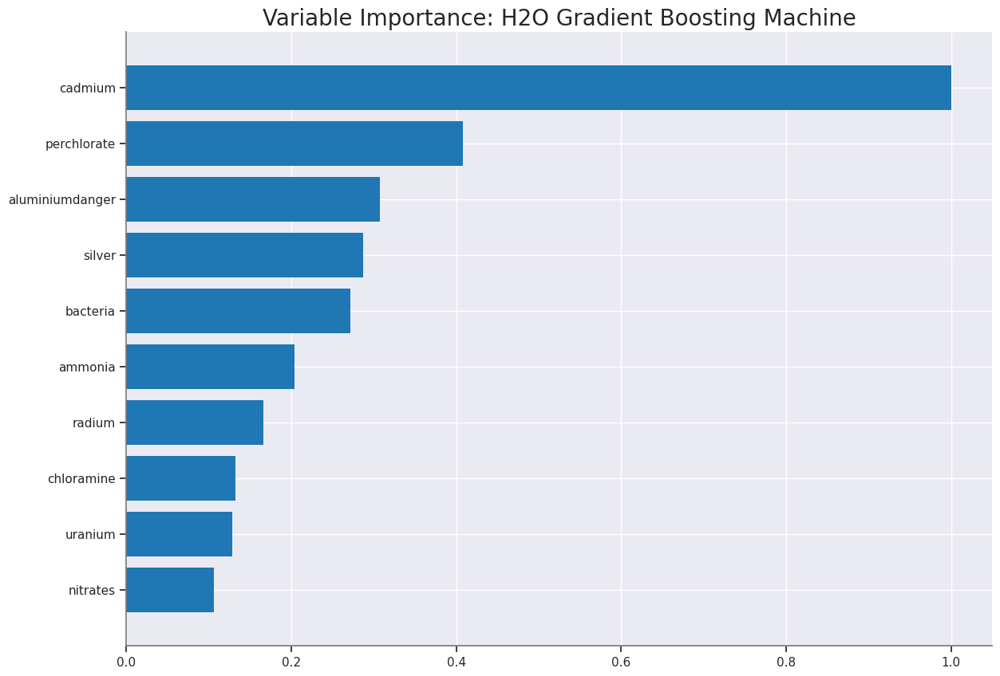

<Figure size 1600x800 with 0 Axes>

In [87]:
if best_model.algo in [
    "gbm",
    "drf",
    "xrt",
    "xgboost",
]:  # Importance of all the variables in GBM algorithm.
    best_model.varimp_plot()

The above graph is a variable Importance Graph on the H20's Distributed Random Forest Model

We can Interpret that Cadmium is the Most Important Variable among all with importance of 1.0 (Think as if this Importance is scaled to 100%) Perchlorate is 0.4 (Think as if it is 40% Important)

30
glm


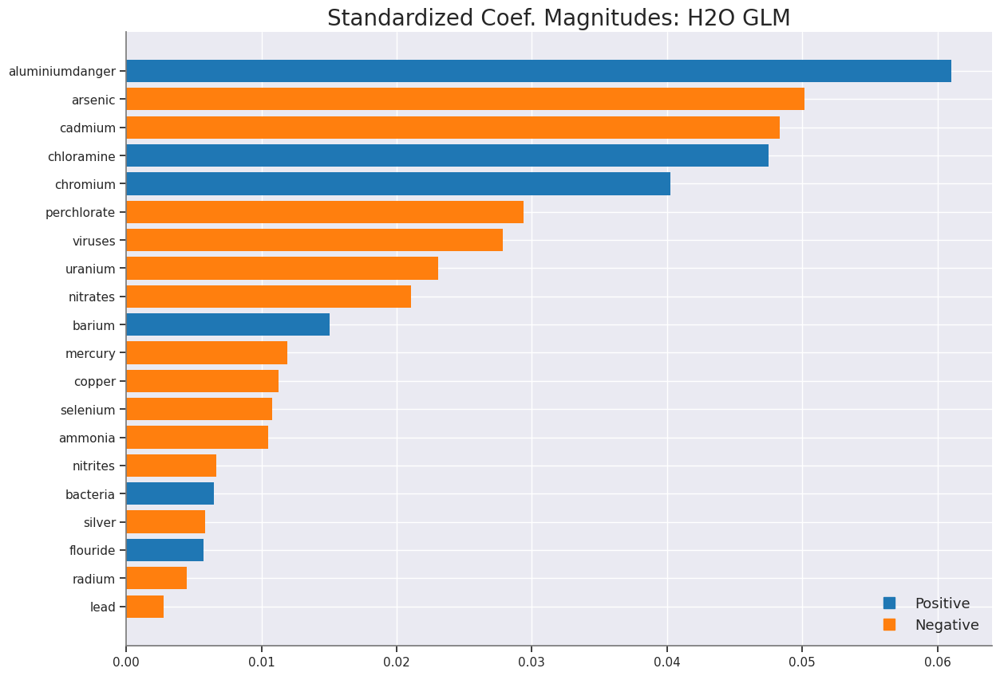

In [88]:
if glm_index is not 0:
    print(glm_index)
    glm_model = h2o.get_model(aml.leaderboard[glm_index, "model_id"])
    print(glm_model.algo)
    glm_model.std_coef_plot()

In [89]:
print(best_model.rmse(train=True))

0.18349969404425903


In [90]:
def model_performance_stats(perf):
    d = {}
    try:
        d["mse"] = perf.mse()
    except:
        pass
    try:
        d["rmse"] = perf.rmse()
    except:
        pass
    try:
        d["null_degrees_of_freedom"] = perf.null_degrees_of_freedom()
    except:
        pass
    try:
        d["residual_degrees_of_freedom"] = perf.residual_degrees_of_freedom()
    except:
        pass
    try:
        d["residual_deviance"] = perf.residual_deviance()
    except:
        pass
    try:
        d["null_deviance"] = perf.null_deviance()
    except:
        pass
    try:
        d["aic"] = perf.aic()
    except:
        pass
    try:
        d["logloss"] = perf.logloss()
    except:
        pass
    try:
        d["auc"] = perf.auc()
    except:
        pass
    try:
        d["gini"] = perf.gini()
    except:
        pass
    return d    

In [91]:
mod_perf = best_model.model_performance(df_test)
stats_test = {}
stats_test = model_performance_stats(mod_perf)
stats_test

{'mse': 0.04392801152703958,
 'rmse': 0.2095901035999543,
 'null_degrees_of_freedom': None,
 'residual_degrees_of_freedom': None,
 'residual_deviance': None,
 'null_deviance': None}

In [92]:
predictions = best_model.predict(df_test)

gbm prediction progress: |███████████████████████████████████████████████████████| (done) 100%


In [93]:
y_pred = h2o.as_list(
    predictions
)  # Predictions on Test Dataset using the best model from the leaderboard.
print(y_pred)

       predict
0     0.244440
1     0.388677
2     0.574835
3     0.253446
4     0.719245
...        ...
1611  0.084333
1612  0.246810
1613  0.327890
1614  0.192519
1615  0.418630

[1616 rows x 1 columns]


In [103]:
y_test = h2o.as_list(df_test[Y])  # Real Answers
y_test

,is_safe
0,1
1,0
2,1
3,1
4,1
...,...
1611,0
1612,0
1613,0
1614,0


In [95]:
print(X)

['ammonia', 'arsenic', 'barium', 'cadmium', 'chloramine', 'chromium', 'copper', 'flouride', 'bacteria', 'viruses', 'lead', 'nitrates', 'nitrites', 'mercury', 'perchlorate', 'radium', 'selenium', 'silver', 'uranium', 'aluminiumdanger']


**Regularization**

There are two models used - Ridge and  Lasso regularization to verify the overfitting of model and evaluate the performance.

In [97]:
from h2o.estimators.glm import H2OGeneralizedLinearEstimator

water_glm = H2OGeneralizedLinearEstimator(
    family="gaussian", lambda_=0, compute_p_values=True, nfolds=5
)  # Elastic Net Regularization
water_glm_regularization_ridge = H2OGeneralizedLinearEstimator(
    family="gaussian", alpha=0, nfolds=5
)  # RIDGE Regularization
water_glm_regularization_lasso = H2OGeneralizedLinearEstimator(
    family="gaussian", alpha=1, nfolds=5
)  # LASSO Regularization
water_glm_regularization_lamba_search = H2OGeneralizedLinearEstimator(
    lambda_search=True
)  # Lambda Search

In [102]:
water_glm.train(x=X, y=Y, training_frame=df_train)

glm Model Build progress: |██████████████████████████████████████████████████████| (done) 100%


,family,link,regularization,number_of_predictors_total,number_of_active_predictors,number_of_iterations,training_frame
,gaussian,identity,None,20,20,1,py_2_sid_9cde
,mean,sd,cv_1_valid,cv_2_valid,cv_3_valid,cv_4_valid,cv_5_valid
mae,0.1873899,0.0133335,0.1786252,0.1918354,0.1743157,0.2081769,0.1839965
mean_residual_deviance,0.0854788,0.0118284,0.0796843,0.0894438,0.0722363,0.1035361,0.0824934
mse,0.0854788,0.0118284,0.0796843,0.0894438,0.0722363,0.1035361,0.0824934
null_deviance,129.73035,13.426553,129.02457,130.56714,109.32645,146.86954,132.86407
r2,0.1589443,0.0293632,0.1888681,0.1401388,0.1610840,0.1198558,0.1847750
residual_deviance,108.9538960,13.5160675,104.62551,112.25197,91.08991,128.4883,108.31378
rmse,0.2918221,0.0199570,0.2822841,0.2990716,0.2687680,0.3217702,0.2872166
rmsle,0.2071348,0.0127651,0.1993199,0.2123079,0.1942451,0.2266734,0.2031275


**Lasso Regularization**

In [104]:
water_glm_regularization_lasso.train(x=X, y=Y, training_frame=df_train)

glm Model Build progress: |██████████████████████████████████████████████████████| (done) 100%


,family,link,regularization,number_of_predictors_total,number_of_active_predictors,number_of_iterations,training_frame
,gaussian,identity,Lasso (lambda = 7.886E-5 ),20,20,1,py_2_sid_9cde
,mean,sd,cv_1_valid,cv_2_valid,cv_3_valid,cv_4_valid,cv_5_valid
mae,0.1871075,0.0022499,0.1871558,0.1836864,0.1899620,0.1877273,0.1870060
mean_residual_deviance,0.0852835,0.0028370,0.0820492,0.0840182,0.0897552,0.0850374,0.0855578
mse,0.0852835,0.0028370,0.0820492,0.0840182,0.0897552,0.0850374,0.0855578
null_deviance,129.61948,5.9101815,123.6620250,137.41295,134.17387,125.3449,127.50361
r2,0.1593401,0.0267080,0.1657656,0.2012016,0.1336186,0.1395897,0.1565248
residual_deviance,108.8940050,4.7609406,103.13579,109.72775,116.2329250,107.82747,107.54611
rmse,0.2920014,0.0048350,0.2864423,0.2898589,0.2995916,0.2916118,0.2925026
rmsle,0.2071494,0.0034291,0.2046942,0.2034847,0.2123486,0.2078562,0.2073631


Both the regularization appears to have increased the MSE, RMSE, MAE, and RMSLE values compared to the non-regularized models, indicating worse performance.

In [105]:
lambda_search = water_glm_regularization_lamba_search.train(
    x=X, y=Y, training_frame=df_train
)

glm Model Build progress: |██████████████████████████████████████████████████████| (done) 100%


In [106]:
lambda_search

Model Details
=============
H2OGeneralizedLinearEstimator : Generalized Linear Modeling
Model Key: GLM_model_python_1681091709782_26


GLM Model: summary
    family    link      regularization                                 lambda_search                                                                 number_of_predictors_total    number_of_active_predictors    number_of_iterations    training_frame
--  --------  --------  ---------------------------------------------  ----------------------------------------------------------------------------  ----------------------------  -----------------------------  ----------------------  ----------------
    gaussian  identity  Elastic Net (alpha = 0.5, lambda = 0.001372 )  nlambda = 100, lambda.max = 0.1577, lambda.min = 0.001372, lambda.1se = -1.0  20                            20                             52                      py_2_sid_9cde

ModelMetricsRegressionGLM: glm
** Reported on train data. **

MSE: 0.08466836374605195
RMSE: 0.29097828741342874
MAE: 0.18579325256225412
RMSLE: 0.20597413053379385
Mean Residual Deviance: 0.08466836374605195
R^2: 0.16606064881299853
Null degrees of freedom: 6382
Residual degrees of freedom: 6362
Null deviance: 648.0545198183929
Residual deviance: 540.4381657910496
AIC: 2398.4576980903807

Scoring History: 
     timestamp            duration    iteration    lambda    predictors    deviance_train       alpha    iterations    training_rmse        training_deviance    training_mae         training_r2
---  -------------------  ----------  -----------  --------  ------------  -------------------  -------  ------------  -------------------  -------------------  -------------------  -------------------
     2023-04-10 02:38:02  0.000 sec   1            .16E0     1             0.10152820301085184  0.5
     2023-04-10 02:38:02  0.022 sec   2            .14E0     2             0.10053987722508595  0.5
     2023-04-10 02:38:02  0.025 sec   3            .13E0     3             0.09914437544003832  0.5
     2023-04-10 02:38:02  0.033 sec   4            .12E0     3             0.09784382972369961  0.5
     2023-04-10 02:38:02  0.048 sec   5            .11E0     3             0.09674824095837652  0.5
     2023-04-10 02:38:02  0.052 sec   6            .99E-1    3             0.09582644857569081  0.5
     2023-04-10 02:38:02  0.056 sec   7            .9E-1     4             0.09493051749295241  0.5
     2023-04-10 02:38:02  0.059 sec   8            .82E-1    5             0.0940901198882067   0.5
     2023-04-10 02:38:02  0.062 sec   9            .75E-1    5             0.09338276218986018  0.5
     2023-04-10 02:38:02  0.077 sec   10           .68E-1    5             0.09279164073436731  0.5
---  ---                  ---         ---          ---       ---           ---                  ---      ---           ---                  ---                  ---                  ---
     2023-04-10 02:38:03  0.336 sec   43           .32E-2    21            0.08474162516772167  0.5
     2023-04-10 02:38:03  0.342 sec   44           .29E-2    21            0.08472637249287006  0.5
     2023-04-10 02:38:03  0.345 sec   45           .26E-2    21            0.08471363994628597  0.5
     2023-04-10 02:38:03  0.352 sec   46           .24E-2    21            0.08470305251283695  0.5
     2023-04-10 02:38:03  0.360 sec   47           .22E-2    21            0.08469425793482468  0.5
     2023-04-10 02:38:03  0.364 sec   48           .2E-2     21            0.08468733812200376  0.5
     2023-04-10 02:38:03  0.376 sec   49           .18E-2    21            0.08468114975348622  0.5
     2023-04-10 02:38:03  0.385 sec   50           .17E-2    21            0.08467608391693025  0.5
     2023-04-10 02:38:03  0.389 sec   51           .15E-2    21            0.08467187627658138  0.5
     2023-04-10 02:38:03  0.393 sec   52           .14E-2    21            0.08466836374605287  0.5      52            0.29097828741342874  0.08466836374605195  0.18579325256225412  0.16606064881299853
[5

In [107]:
coeff_table = water_glm._model_json["output"]["coefficients_table"]

In [108]:
coeff_table.as_data_frame() 

,names,coefficients,std_error,z_value,p_value,standardized_coefficients
0,Intercept,0.304673,0.020426,14.915815,1.770522e-49,0.114680
1,ammonia,-0.001221,0.000421,-2.898351,3.764122e-03,-0.010841
2,arsenic,-0.205666,0.018412,-11.170341,1.052119e-28,-0.051890
3,barium,0.012989,0.003667,3.542320,3.994660e-04,0.015728
4,cadmium,-1.346961,0.116478,-11.564110,1.265673e-30,-0.048758
5,chloramine,0.019488,0.002022,9.640136,7.628335e-22,0.049907
6,chromium,0.154598,0.017929,8.622942,8.142358e-18,0.041733
7,copper,-0.018509,0.005840,-3.169288,1.535370e-03,-0.012112
8,flouride,0.013469,0.008400,1.603386,1.088990e-01,0.005867
9,bacteria,0.024024,0.015846,1.516104,1.295427e-01,0.007948


# Leaderboard

> Leaderboard shows models with their metrics. When provided with H2OAutoML object, the leaderboard shows 5-fold cross-validated metrics by default (depending on the H2OAutoML settings), otherwise it shows metrics computed on the frame. At most 20 models are shown by default.

model_id,rmse,mse,mae,rmsle,mean_residual_deviance,training_time_ms,predict_time_per_row_ms,algo
StackedEnsemble_AllModels_2_AutoML_1_20230410_15530,0.205381,0.0421814,0.100743,0.145999,0.0421814,899,0.037461,StackedEnsemble
StackedEnsemble_AllModels_1_AutoML_1_20230410_15530,0.205488,0.0422255,0.102633,0.146551,0.0422255,480,0.025979,StackedEnsemble
StackedEnsemble_BestOfFamily_2_AutoML_1_20230410_15530,0.205693,0.0423095,0.101597,0.146468,0.0423095,409,0.014273,StackedEnsemble
StackedEnsemble_AllModels_3_AutoML_1_20230410_15530,0.206031,0.0424489,0.100644,0.146404,0.0424489,902,0.050979,StackedEnsemble
GBM_2_AutoML_1_20230410_15530,0.206498,0.0426416,0.102144,0.145916,0.0426416,805,0.010933,GBM
StackedEnsemble_BestOfFamily_3_AutoML_1_20230410_15530,0.208549,0.0434926,0.102894,0.147883,0.0434926,588,0.014845,StackedEnsemble
StackedEnsemble_BestOfFamily_4_AutoML_1_20230410_15530,0.208549,0.0434928,0.10289,0.147881,0.0434928,424,0.015762,StackedEnsemble
GBM_5_AutoML_1_20230410_15530,0.20959,0.043928,0.103325,0.147442,0.043928,685,0.01092,GBM
GBM_3_AutoML_1_20230410_15530,0.212375,0.045103,0.105093,0.150615,0.045103,1252,0.013212,GBM
GBM_grid_1_AutoML_1_20230410_15530_model_2,0.212595,0.0451967,0.114254,0.149705,0.0451967,1247,0.013706,GBM


# Residual Analysis

> Residual Analysis plots the fitted values vs residuals on a test dataset. Ideally, residuals should be randomly distributed. Patterns in this plot can indicate potential problems with the model selection, e.g., using simpler model than necessary, not accounting for heteroscedasticity, autocorrelation, etc. Note that if you see "striped" lines of residuals, that is an artifact of having an integer valued (vs a real valued) response variable.

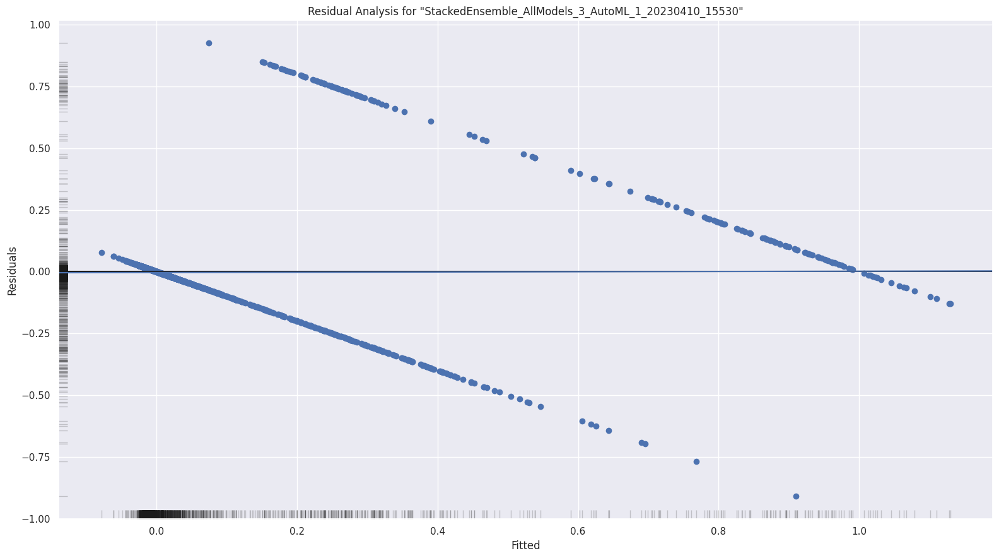

# Learning Curve Plot

> Learning curve plot shows the loss function/metric dependent on number of iterations or trees for tree-based algorithms. This plot can be useful for determining whether the model overfits.

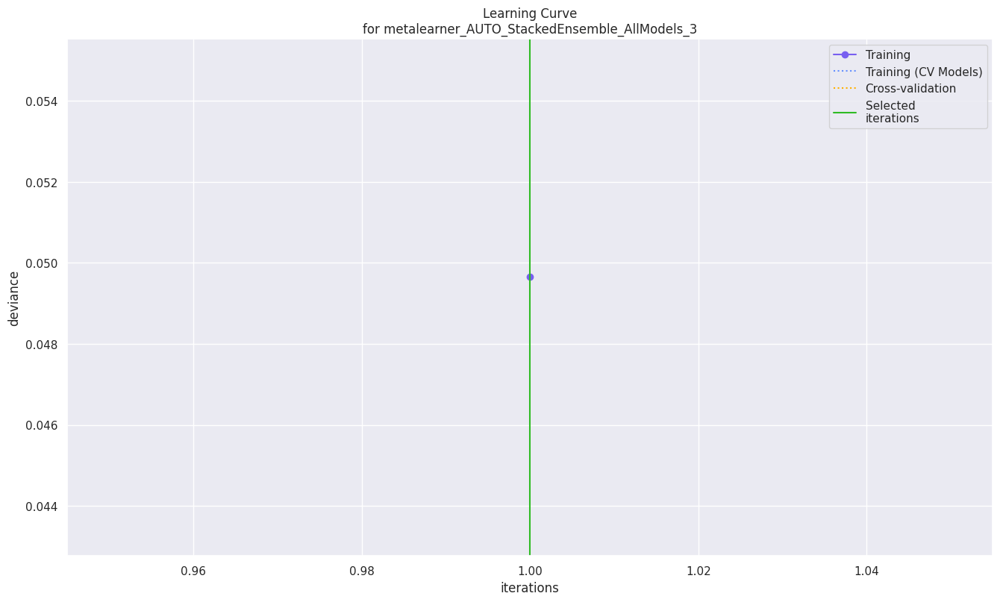

# Variable Importance

> The variable importance plot shows the relative importance of the most important variables in the model.

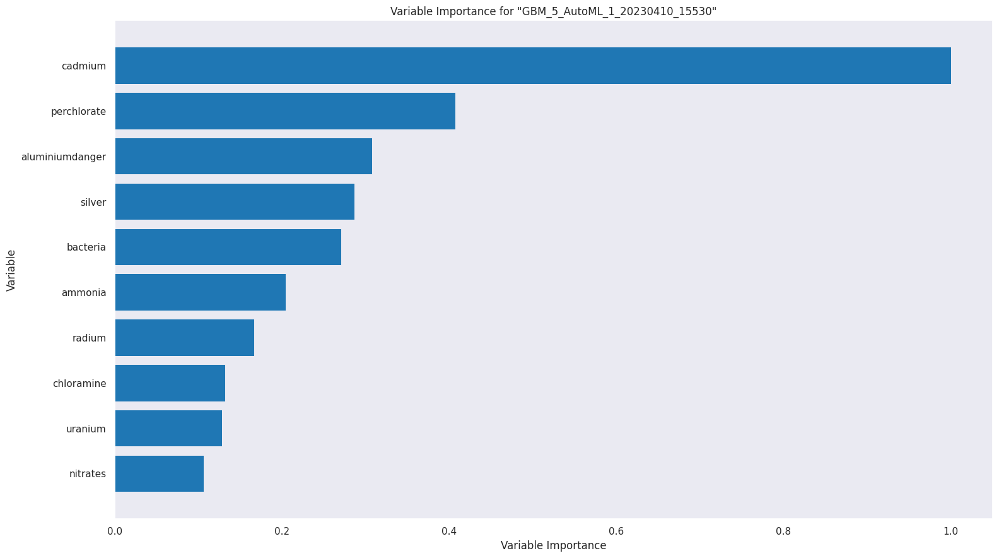

# Variable Importance Heatmap

> Variable importance heatmap shows variable importance across multiple models. Some models in H2O return variable importance for one-hot (binary indicator) encoded versions of categorical columns (e.g. Deep Learning, XGBoost). In order for the variable importance of categorical columns to be compared across all model types we compute a summarization of the the variable importance across all one-hot encoded features and return a single variable importance for the original categorical feature. By default, the models and variables are ordered by their similarity.

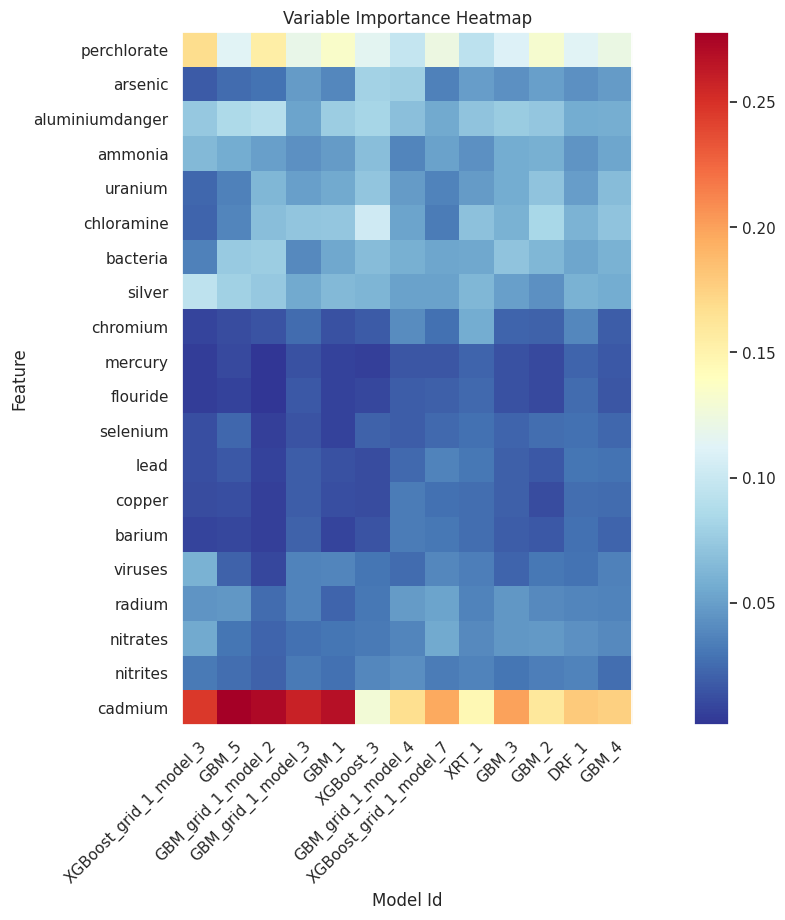

# Model Correlation

> This plot shows the correlation between the predictions of the models. For classification, frequency of identical predictions is used. By default, models are ordered by their similarity (as computed by hierarchical clustering). Interpretable models, such as GAM, GLM, and RuleFit are highlighted using red colored text.

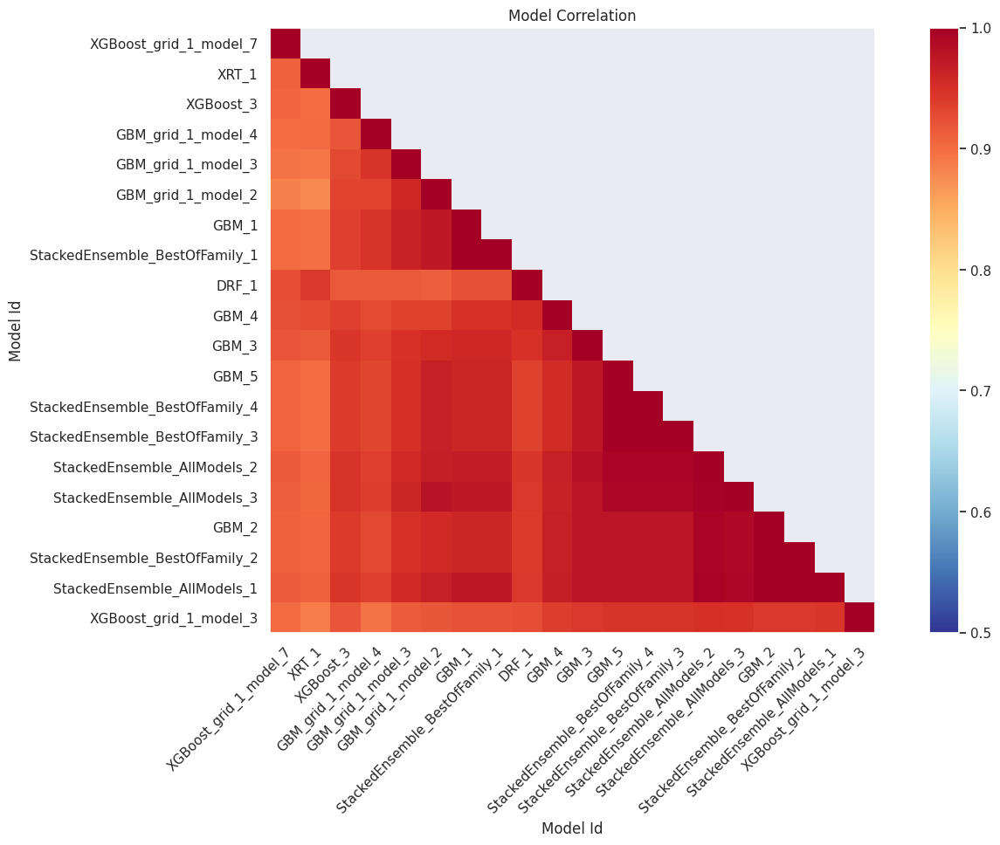

# SHAP Summary

> SHAP summary plot shows the contribution of the features for each instance (row of data). The sum of the feature contributions and the bias term is equal to the raw prediction of the model, i.e., prediction before applying inverse link function.

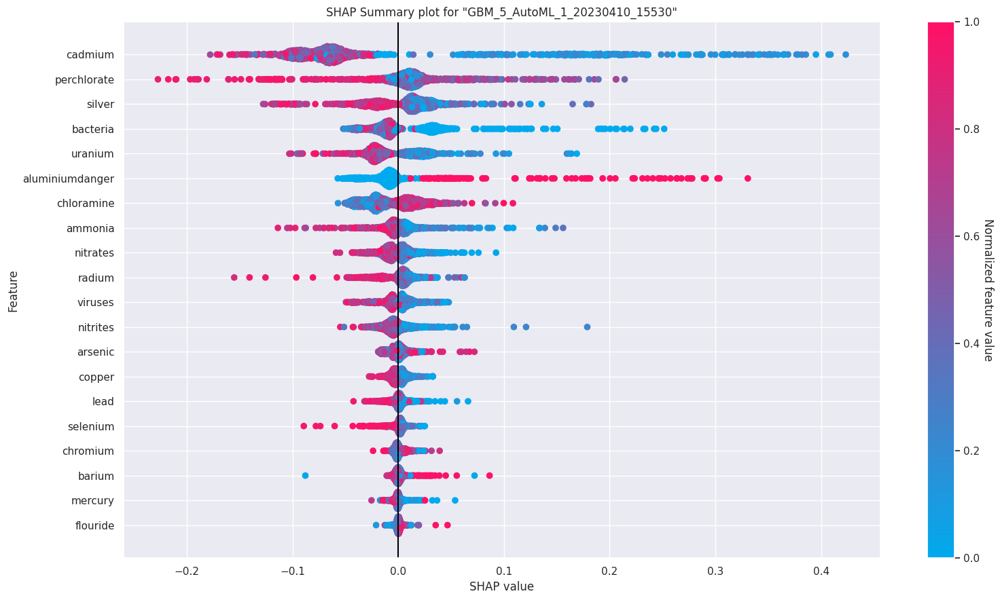

# Partial Dependence Plots

> Partial dependence plot (PDP) gives a graphical depiction of the marginal effect of a variable on the response. The effect of a variable is measured in change in the mean response. PDP assumes independence between the feature for which is the PDP computed and the rest.

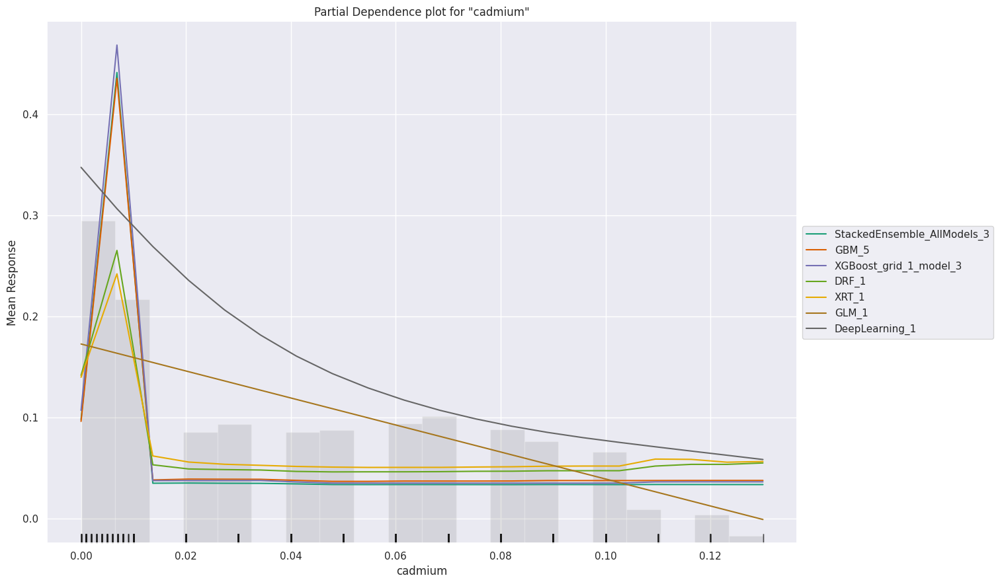

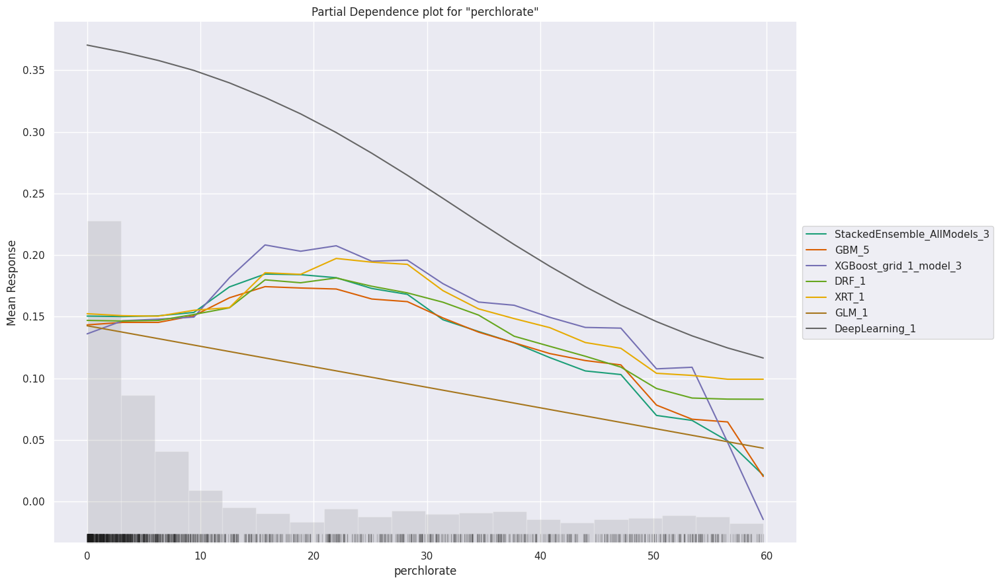

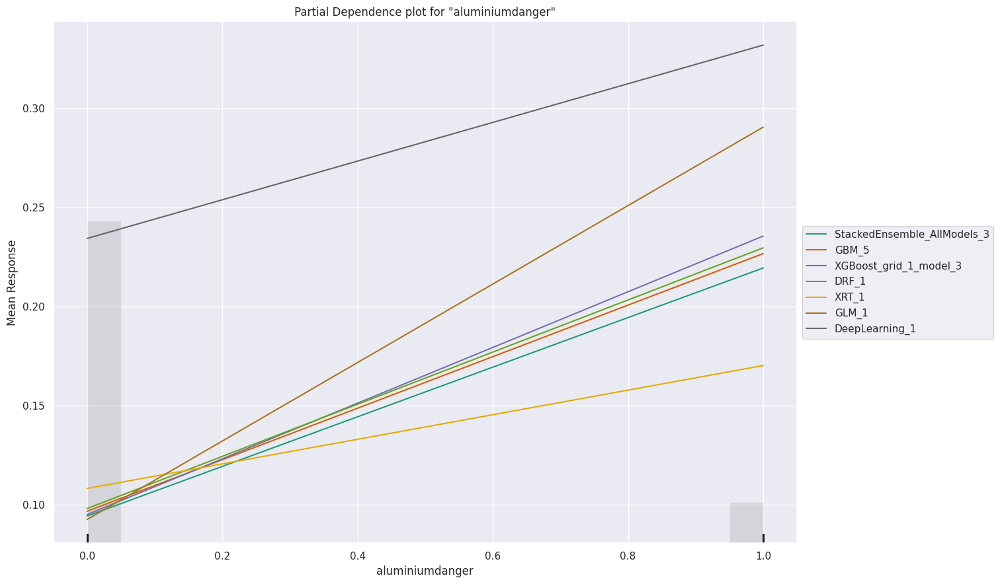

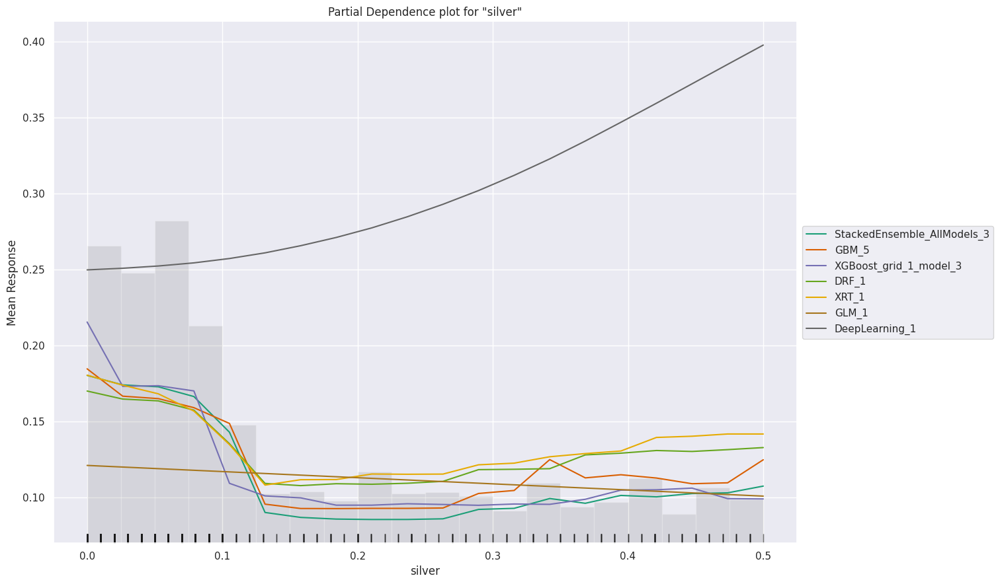

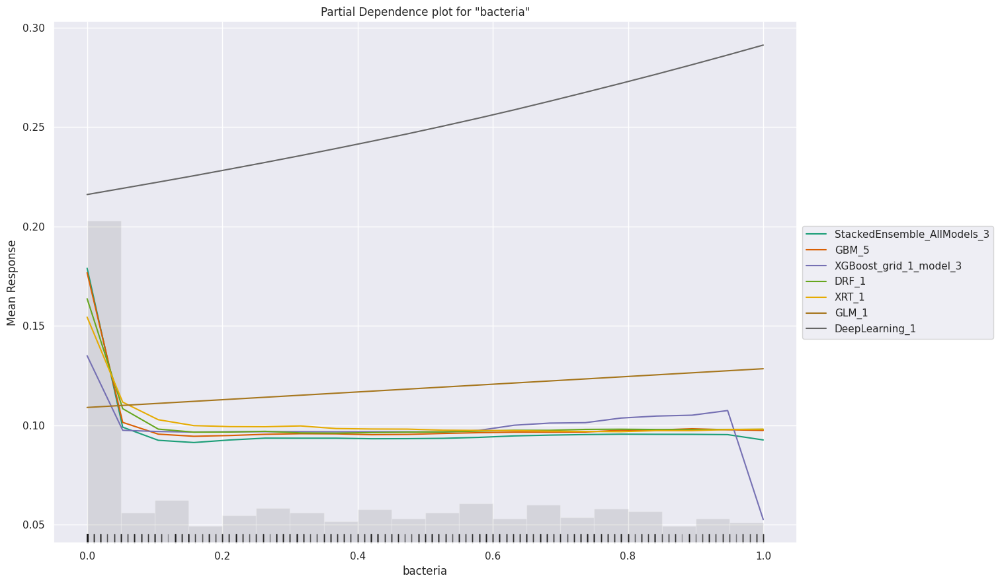

# Individual Conditional Expectation

> An Individual Conditional Expectation (ICE) plot gives a graphical depiction of the marginal effect of a variable on the response. ICE plots are similar to partial dependence plots (PDP); PDP shows the average effect of a feature while ICE plot shows the effect for a single instance. This function will plot the effect for each decile. In contrast to the PDP, ICE plots can provide more insight, especially when there is stronger feature interaction.

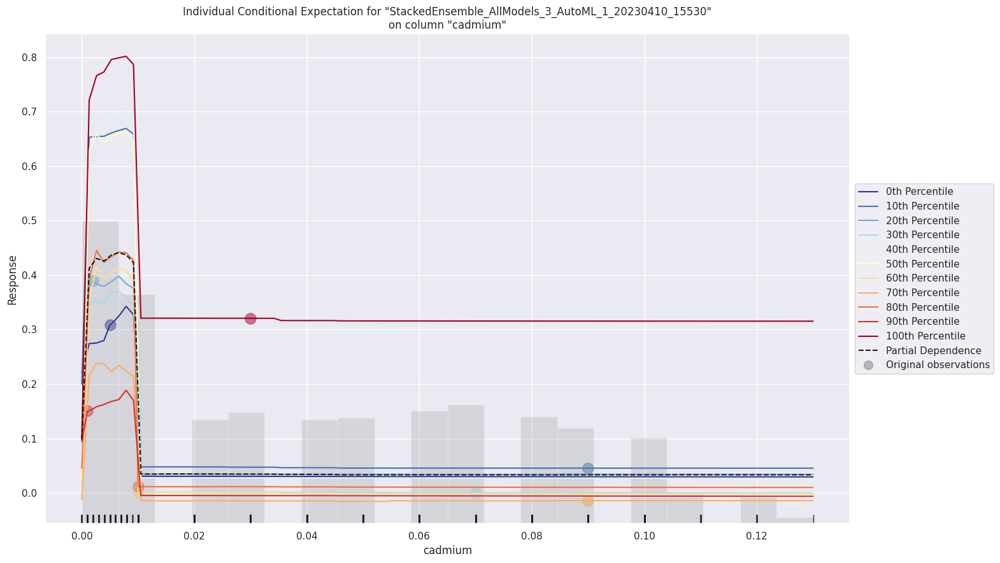

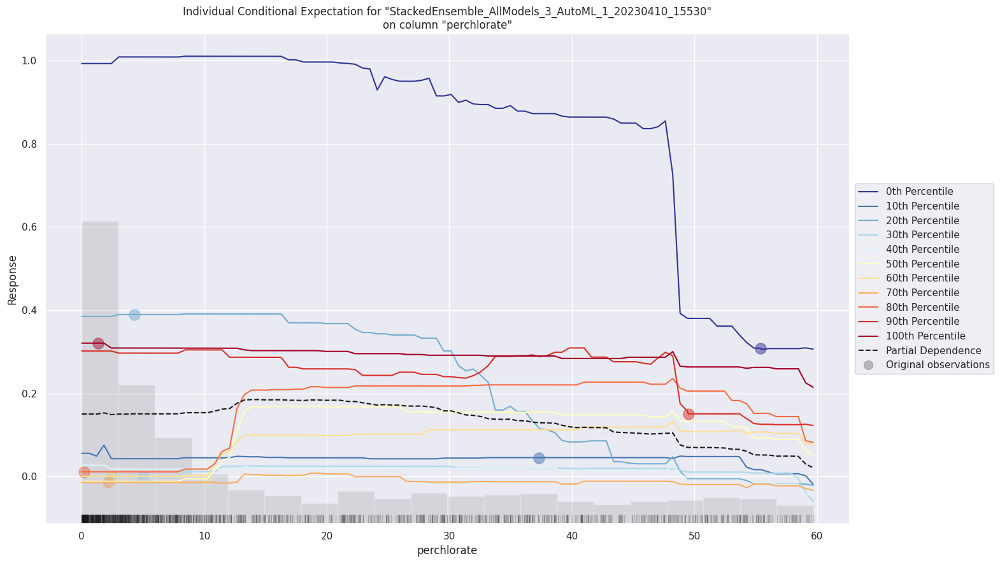

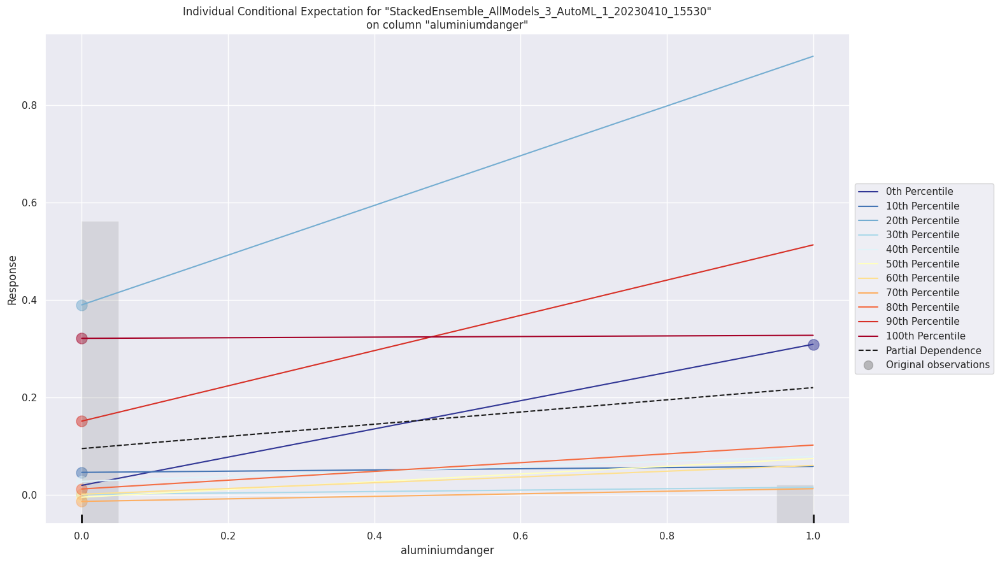

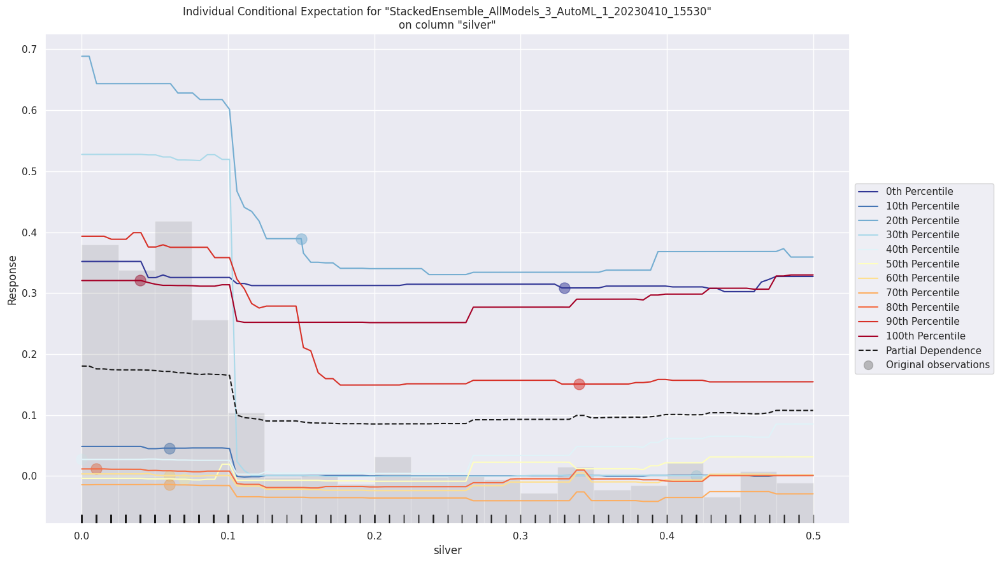

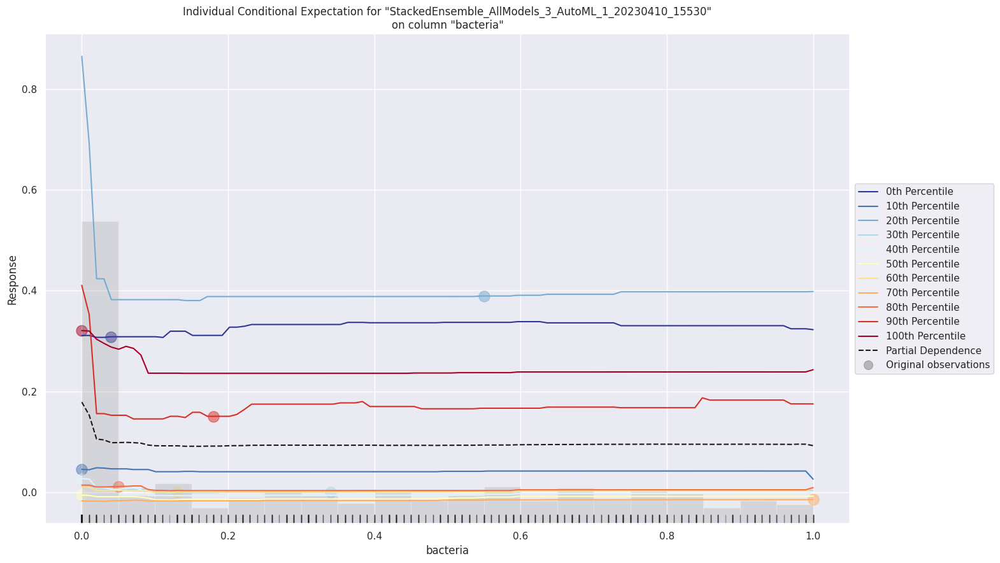

In [109]:
exa = aml.explain(df_test)

Interpreting Best Model from AutoML

Residual Analysis
Here, we can see the striped lines of residuals, which is an artifact of having an integer value as a response value, instead of a real value. It can also be observed from the below graph that residuals are normally distributed. Residuals signify that residuals don't have heteroscedasticity.

SHAP Summary
From the SHAP summary diagram, we can interpret a few conclusions -

All the features are listed as per their importance in making the prediction, that is Cadmium is more significant followed by Perchlorate, and so on. Flouride is the least significant predictor in our model.
As we can see Cadmium has the most impact on the water quality as it has the most values away from 0.0 that is Shap value. 

Compared to regular feature importance measures, SHAP analysis enables visualization of how a feature impacts the target at various levels. Typical methods often overestimate the importance of continuous or categorical variables with many unique values.

Partial Dependence Plot (PDP)
It shows how the predicted value of the target variable changes as the value of a specific input feature changes, while holding all other input features constant at their average or selected values.
If we see Cadmium, the range increases between 0.00 to 0.02

In [110]:
import statsmodels.formula.api as smf  # OLS model Library


In [111]:
import h2o

pandas_df = h2o.as_list(df)

In [112]:
results = smf.ols(
    "is_safe ~ ammonia+arsenic + barium + cadmium + chloramine + chromium + copper + flouride + bacteria + viruses + lead + nitrates + nitrites + mercury + perchlorate + radium + selenium + silver + uranium + aluminiumdanger",
    data=pandas_df,
).fit()

results.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                is_safe   R-squared:                       0.178
Model:                            OLS   Adj. R-squared:                  0.176
Method:                 Least Squares   F-statistic:                     86.56
Date:                Mon, 10 Apr 2023   Prob (F-statistic):          7.67e-321
Time:                        02:41:13   Log-Likelihood:                -1395.8
No. Observations:                7999   AIC:                             2834.
Df Residuals:                    7978   BIC:                             2980.
Df Model:                          20                                         
Covariance Type:            nonrobust                                         
===================================================================================
                      coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------
Intercept           0.3137      0.018     17.319      0.000       0.278       0.349
ammonia            -0.0014      0.000     -3.773      0.000      -0.002      -0.001
arsenic            -0.2092      0.016    -12.891      0.000      -0.241      -0.177
barium              0.0118      0.003      3.631      0.000       0.005       0.018
cadmium            -1.4017      0.103    -13.582      0.000      -1.604      -1.199
chloramine          0.0213      0.002     11.978      0.000       0.018       0.025
chromium            0.1515      0.016      9.552      0.000       0.120       0.183
copper             -0.0188      0.005     -3.636      0.000      -0.029      -0.009
flouride            0.0084      0.007      1.131      0.258      -0.006       0.023
bacteria            0.0268      0.014      1.916      0.055      -0.001       0.054
viruses            -0.0787      0.012     -6.757      0.000      -0.102      -0.056
lead               -0.0916      0.056     -1.623      0.105      -0.202       0.019
nitrates           -0.0037      0.001     -6.316      0.000      -0.005      -0.003
nitrites           -0.0137      0.007     -1.989      0.047      -0.027      -0.000
mercury            -3.1982      1.092     -2.930      0.003      -5.338      -1.058
perchlorate        -0.0019      0.000     -7.642      0.000      -0.002      -0.001
radium             -0.0022      0.002     -1.408      0.159      -0.005       0.001
selenium           -0.4053      0.113     -3.590      0.000      -0.627      -0.184
silver             -0.0579      0.029     -1.972      0.049      -0.116      -0.000
uranium            -0.8585      0.120     -7.135      0.000      -1.094      -0.623
aluminiumdanger     0.2141      0.011     19.139      0.000       0.192       0.236
==============================================================================
Omnibus:                     2747.835   Durbin-Watson:                   1.504
Prob(Omnibus):                  0.000   Jarque-Bera (JB):             7721.045
Skew:                           1.856   Prob(JB):                         0.00
Kurtosis:                       6.064   Cond. No.                     9.64e+03
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 9.64e+03. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

In [113]:

train, validate, test = np.split(
    pandas_df.sample(frac=1, random_state=42), [int(0.6 * len(df)), int(0.8 * len(df))]
)

train = h2o.H2OFrame(train)
validate = h2o.H2OFrame(validate)
test = h2o.H2OFrame(test)

Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%
Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%
Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%


In [114]:
gbm_parameters = {
    "learn_rate": [i * 0.01 for i in range(1, 11)],
    "max_depth": list(range(2, 11)),
    "sample_rate": [i * 0.1 for i in range(5, 11)],
    "col_sample_rate": [i * 0.1 for i in range(1, 11)],
}

In [115]:
search_criteria = {"strategy": "RandomDiscrete", "max_models": 36, "seed": 1}

In [116]:
gbm_grid2 = H2OGridSearch(
    model=H2OGradientBoostingEstimator,
    grid_id="gbm_grid2",
    hyper_params=gbm_parameters,
    search_criteria=search_criteria,
)

In [118]:
gbm_grid2.train(
    x=X, y=Y, training_frame=train, validation_frame=validate, ntrees=100, seed=1
)

gbm Grid Build progress: |███████████████████████████████████████████████████████| (done) 100%


,col_sample_rate,learn_rate,max_depth,sample_rate,model_ids,residual_deviance
,0.7000000,0.03,6.0,1.0,gbm_grid2_model_6,0.0480399
,0.3000000,0.03,8.0,1.0,gbm_grid2_model_5,0.0507533
,0.8,0.03,9.0,0.9,gbm_grid2_model_8,0.0507554
,0.8,0.03,5.0,0.5,gbm_grid2_model_12,0.0514903
,0.5,0.05,7.0,0.9,gbm_grid2_model_2,0.0516209
,0.7000000,0.06,5.0,0.6000000,gbm_grid2_model_14,0.0520768
,0.9,0.04,4.0,0.9,gbm_grid2_model_31,0.0521499
,0.9,0.07,4.0,0.9,gbm_grid2_model_17,0.0524373
,0.9,0.1,4.0,0.7000000,gbm_grid2_model_15,0.0527501
,0.9,0.03,10.0,0.5,gbm_grid2_model_21,0.0543893


In [119]:
gbm_gridperf2 = gbm_grid2.get_grid(sort_by="residual_deviance", decreasing=False)
gbm_gridperf2

,col_sample_rate,learn_rate,max_depth,sample_rate,model_ids,residual_deviance
,0.7000000,0.03,6.0,1.0,gbm_grid2_model_6,0.0480399
,0.3000000,0.03,8.0,1.0,gbm_grid2_model_5,0.0507533
,0.8,0.03,9.0,0.9,gbm_grid2_model_8,0.0507554
,0.8,0.03,5.0,0.5,gbm_grid2_model_12,0.0514903
,0.5,0.05,7.0,0.9,gbm_grid2_model_2,0.0516209
,0.7000000,0.06,5.0,0.6000000,gbm_grid2_model_14,0.0520768
,0.9,0.04,4.0,0.9,gbm_grid2_model_31,0.0521499
,0.9,0.07,4.0,0.9,gbm_grid2_model_17,0.0524373
,0.9,0.1,4.0,0.7000000,gbm_grid2_model_15,0.0527501
,0.9,0.03,10.0,0.5,gbm_grid2_model_21,0.0543893


In [120]:
list_hyperparameters = []
for i in range(36):
    hyperparameters = gbm_gridperf2.get_hyperparams_dict(i)
    list_hyperparameters.append(hyperparameters)

Hyperparameters: [learn_rate, max_depth, sample_rate, col_sample_rate]
Hyperparameters: [learn_rate, max_depth, sample_rate, col_sample_rate]
Hyperparameters: [learn_rate, max_depth, sample_rate, col_sample_rate]
Hyperparameters: [learn_rate, max_depth, sample_rate, col_sample_rate]
Hyperparameters: [learn_rate, max_depth, sample_rate, col_sample_rate]
Hyperparameters: [learn_rate, max_depth, sample_rate, col_sample_rate]
Hyperparameters: [learn_rate, max_depth, sample_rate, col_sample_rate]
Hyperparameters: [learn_rate, max_depth, sample_rate, col_sample_rate]
Hyperparameters: [learn_rate, max_depth, sample_rate, col_sample_rate]
Hyperparameters: [learn_rate, max_depth, sample_rate, col_sample_rate]
Hyperparameters: [learn_rate, max_depth, sample_rate, col_sample_rate]
Hyperparameters: [learn_rate, max_depth, sample_rate, col_sample_rate]
Hyperparameters: [learn_rate, max_depth, sample_rate, col_sample_rate]
Hyperparameters: [learn_rate, max_depth, sample_rate, col_sample_rate]
Hyperp

In [121]:
models = gbm_gridperf2.models

In [122]:
list_residual_deviance = []
for i in range(36):
    model = models[i]
    performance_metrics = model.model_performance(validate)
    residual_deviance = performance_metrics.mean_residual_deviance()
    list_residual_deviance.append(residual_deviance)

In [123]:
for i in range(36):
    list_hyperparameters[i]["Residual_Deviance"] = list_residual_deviance[i]

In [124]:
hyperparameters_dataframe = pd.DataFrame(list_hyperparameters)
print(hyperparameters_dataframe)

    col_sample_rate  learn_rate  max_depth  sample_rate  Residual_Deviance
0               0.7        0.03          6          1.0           0.048040
1               0.3        0.03          8          1.0           0.050753
2               0.8        0.03          9          0.9           0.050755
3               0.8        0.03          5          0.5           0.051490
4               0.5        0.05          7          0.9           0.051621
5               0.7        0.06          5          0.6           0.052077
6               0.9        0.04          4          0.9           0.052150
7               0.9        0.07          4          0.9           0.052437
8               0.9        0.10          4          0.7           0.052750
9               0.9        0.03         10          0.5           0.054389
10              0.4        0.08          6          0.9           0.054774
11              0.5        0.10          4          0.8           0.054934
12              0.6      

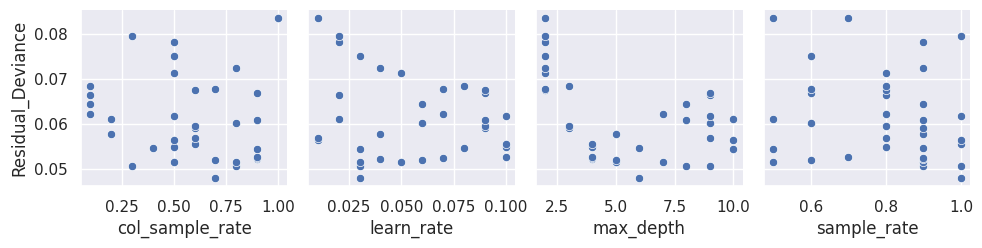

In [125]:
sns.pairplot(
    hyperparameters_dataframe,
    y_vars=["Residual_Deviance"],
    x_vars=["col_sample_rate", "learn_rate", "max_depth", "sample_rate"],
)

All the feature's P value is 0 or near to 0 except Copper, ammonia, bacteria, nitrates and selenium, so the relationship is significant.

From the VIF data, we could know that all variables have correlationship with each other except Ammonia, Flouride, Copper their VIF are relatively low.
All variables are independent of each other,especially virus, bacteria, chromium, chloramine we can know that from the correlation heap map.

In multivariate models rank the most significant predictor variables and exclude insignificant ones from the model.
The most significant predictor variable is Cadmium, and nitrate is the least siginificant one.
The regularization did not have much of an impact as the rmse before and after regularization did not have much of difference
rmse before - 0.219

The hyperparameter combination with the lowest Residual Deviance was a model  with col_sample_rate of  0.7, learn_rate of 0.03, max_depth of 6, and sample_rate of 1.0, with a Residual Deviance of 0.048040. The next best models had Residual Deviances in the range of 0.05-0.07, while the worst-performing models had Residual Deviances above 0.08.
In general, the outcomes indicate that adjusting the hyperparameters col_sample_rate, learn_rate, max_depth, and sample_rate can greatly influence the effectiveness of an XGBoost model. This implies that fine-tuning these hyperparameters can result in substantial enhancements in the model's performance.

Conclusion and Evaluation

As a result, for binary classification, the Gradient Boosting Machine is th having the best performance. To prevent overfitting, it is possible to use methods such as cross-validation and regularization. Additionally, a larger dataset can be of advantage for reducing overfitting.

***Observations***

In the leaderboard above, the best performing model is StackedEnsemble_AllModels_3_AutoML_1_20230228_224537 with an rmse score of 0.222141.

The second-best model is StackedEnsemble_AllModels_2_AutoML_1_20230228_224537 with an rmse score of 0.222989. The models are then listed in descending order based on their rmse scores.

As same in Random Forest, even in autoML model we have Cadmium as the most important feature
The next important features are perchlorate, aluminium danger, chloramine and others respectively.



**Intuition of Model Interpretability**

In [126]:
X_train, X_test, y_train, y_test = train_test_split(x, y, test_size=0.1, shuffle=False) #revert
numerical_features = [c for c in X_train.columns]
num = [([n], [SimpleImputer(), StandardScaler()]) for n in numerical_features]
mapper = DataFrameMapper(num, df_out=True)
reg = LinearRegression()
pipeline = Pipeline([
    ('preprocess', mapper),
    ('reg', reg)
])
p = pipeline.fit(X_train, y_train)

In [127]:
nan_frame = pd.DataFrame(columns=numerical_features, index=[0])
nan_frame

,ammonia,arsenic,barium,cadmium,chloramine,chromium,copper,flouride,bacteria,viruses,lead,nitrates,nitrites,mercury,perchlorate,radium,selenium,silver,uranium,aluminiumdanger
0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [128]:
base_value = round(pipeline.predict(nan_frame)[0], 3)
print(f"Expected value of the output (base value): {base_value}")

Expected value of the output (base value): 0.125


In [129]:
X_test.iloc[0: 1]

,ammonia,arsenic,barium,cadmium,chloramine,chromium,copper,flouride,bacteria,viruses,lead,nitrates,nitrites,mercury,perchlorate,radium,selenium,silver,uranium,aluminiumdanger
7199,8.17,0.05,1.17,0.05,0.04,0.02,1.18,0.88,0.28,0.001,0.032,3.81,1.77,0.003,9.79,5.1,0.06,0.01,0.07,0


In [130]:
sample_prediction = round(pipeline.predict(X_test.iloc[0: 1])[0], 3)
print(f"Current Prediction: {sample_prediction}")
#print(f"Actual value: {y_test[0]}")

Current Prediction: 0.113


### **Partial Dependence Plots**

In [131]:
explainer = shap.Explainer(pipeline.predict, X_train)
shap_values = explainer(X_test)

Permutation explainer: 801it [10:04,  1.31it/s]


In [132]:
def partial_dependence_plot(feature, idx=None):
    if idx is None: # visualize all samples
        shap.plots.partial_dependence(
            feature,
            pipeline.predict,
            X_train, 
            ice=False,
            model_expected_value=True, 
            feature_expected_value=True)
    else: # visualize sample idx
        shap.partial_dependence_plot(
            feature, 
            pipeline.predict,
            X_train, 
            ice=False,
            model_expected_value=True, 
            feature_expected_value=True,
            shap_values=shap_values[idx:idx+1,:])

In [ ]:
# SHAP for Linear Model
linear_explainer = shap.Explainer(pipeline.predict, X_train)
linear_shap_values = linear_explainer(X_train)
for i in X_train.columns:
    # make a standard partial dependence plot
    sample_ind = 18
    shap.partial_dependence_plot(
        i,
        pipeline.predict,
        X_train,
        model_expected_value=True,
        feature_expected_value=True,
        ice=False,
        shap_values=linear_shap_values[sample_ind : sample_ind + 1, :],
    )

Permutation explainer:  15%|█▌        | 1107/7199 [14:31<1:55:17,  1.14s/it]

In [ ]:
partial_dependence_plot('cadmium', 0)

In [ ]:
partial_dependence_plot('ammonia', 0)

In [ ]:
partial_dependence_plot('bacteria', 0)

## **SHAP PLOTS**

In [ ]:
shap.initjs()

In [ ]:
def sample_feature_importance(idx, type='condensed'):
    if type == 'condensed':
        return shap.plots.force(shap_values[idx])
    elif type == 'waterfall':
        return shap.plots.waterfall(shap_values[idx])
    else:
        return "Return valid visual ('condensed', 'waterfall')"

In [ ]:
sample_feature_importance(0, 'waterfall')

In [ ]:
sample_feature_importance(0, 'condensed')

## **Feature Importance for model**

In [ ]:
shap.plots.bar(shap_values)

In [ ]:
shap.summary_plot(shap_values.values, X_train, plot_type='bar')

## **SHAP FOR LINEAR REGRESSION**

In [ ]:
numerical_features = [c for c in X_train.columns]
num = [([n], [SimpleImputer(), StandardScaler()]) for n in numerical_features]
mapper = DataFrameMapper(num , df_out=True)
preprocessed_X_train = mapper.fit_transform(X_train)
preprocessed_X_train = sm.add_constant(preprocessed_X_train)
reg = sm.OLS(y_train, preprocessed_X_train).fit()

In [ ]:
shap.summary_plot(shap_values, shap_values, feature_names=list(X_train.columns))

## **SHAP for Random Forest**

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(x, y, test_size=0.1, shuffle=False)
numerical_features = X_train.select_dtypes(include=['float64', 'int64']).columns

# Train a random forest regression model
reg = RandomForestRegressor()
reg.fit(X_train[numerical_features], y_train)

# Calculate feature importances
feature_importances = reg.feature_importances_
sorted_idx = feature_importances.argsort()
result = sorted(zip(numerical_features, feature_importances), key=lambda x: x[1], reverse=False)

plt.barh([x[0] for x in result], [x[1] for x in result])
plt.xlabel('Feature Importance')
plt.ylabel('Feature Name')
plt.title('Numerical Feature Importances')

In [ ]:
explainer = shap.Explainer(reg)
shap_values = explainer.shap_values(X_test)
shap.summary_plot(shap_values, X_test, plot_type="bar", feature_names=X_test.columns)

## **SHAP FOR AUTO ML**

In [ ]:
shapml = aml.explain(df_test)

### **SHAP Summary**

After seeing shap analysis for all three of our models,
the Shap summary gives additional insights into the feature importance for predicting the water quality if it's safe or not. 
It states that cadmium, perchlorate and Chloramine are among the most significant features. By understanding the impact of these features, we can better interpret the model's decision and use this information to make more informed decisions.

# **The Question?**
This dataset was created using imaginary data related to water quality in an urban setting. 
The dataset provides information on various aspects of water quality such as chemicals like arsenic, cadmium, perchlorate, and other parameters. 
It can be used for research purposes, simulations, and modeling of water quality in urban environments. 
The dataset may also be useful for the development of policies and practices aimed at improving water quality in cities.


# **What did we do?**

We have considered all the parameters and tried to find the most important parameters.
First, we found the correlation between the features, analyzed the description of the data, filled out any null
values by the imputation methods. Further we
Additionally, we normalized the data and tested different algorithms such as linear regression. 
We fine-tuned the hyperparameters, including the learning rate and number of trees, to identify the optimal model performance.


# **How well did it work?**
We have tried the different algorithm models like the Linear regression, Decision trees, and
random forest. The hyperparameter tuning was performed to find the best performing parameters
like the learning rate and the regularization

XGBoost and decision trees were good in terms of accuracy

Shap Analysis was performed on the model where the most important variable was
Cadmium. When the cadmium, perchlorate is less we found that there is a higher probability of
water being safe.


# **What did we learn?**
I have learned to analyze the data before performing machine learning. It is important to
see the data and verify if it is in the right form.
From the analysis we can observe that from all the 21 columns we used 19 columns were needed to predict the classes of the beans, 
as there were not many variables which were highly correlated.
Least important variables need to be eliminated for the best performance of the model.
Hyperparameters needs to be tweaked to find the best performing models. 

It is important not to be drive conclusion only on single analysis.
It is important to deal with the missing data and its filling with different imputation
methods. It's essential to note that the training accuracy alone doesn't determine the quality of the model.

It is important to see the testing accuracy and see if the model overfits or not. The model
may overfit because of noise i.e. the data which is not important.
In the heart prediction case, the recall is more important as false positive may be lethal.

**CITATIONS**

Citations

1.Github repositories


Link -https://github.com/ajhalthor/model-interpretability/blob/main/Shap%20Values.ipynb 
https://github.com/aiskunks/YouTube/blob/main/A_Crash_Course_in_Statistical_Learning/Model_Interpretability/SHAP%20and%20LIME%20analysis%20Walkthrough.ipynb

2.GLM model have been adapted from the H2O documentation from the below link

Author - H2O.ai
Link - https://docs.h2o.ai/h2o/latest-stable/h2o-docs/data-science/glm.html

# **References**

1.   https://github.com/aiskunks/YouTube/blob/main/A_Crash_Course_in_Statistical_Learning/ML_Data_Cleaning_and_Feature_Selection/ML_Data_Cleaning_and_Feature_Selection_Wine_Quality.ipynb
2.   https://datascience.stackexchange.com/questions/54808/how-to-remove-outliers-using-box-plot
3. https://scikit-learn.org/stable/modules/generated/sklearn.ensemble.RandomForestClassifier.html
4. https://medium.com/@dtuk81/confusion-matrix-visualization-fc31e3f30fea
5. https://machinelearningmastery.com/knn-imputation-for-missing-values-in-machine-learning/ 
6. Scikit learn offcial documentation
7. https://towardsdatascience.com/understanding-feature-importance-and-how-to-implement-it-in-python-ff0287b20285
8. W3schools
9. Sample assignment from AISkunks - SmokeDetector and Wine Quality workbooks (Code from these assignments)
10. https://towardsdatascience.com/automl-and-the-future-of-data-science-82a1b8f65e7e

